In [1]:
# Import torch
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

C:\Users\lord-\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:

def show(tensor : torch.Tensor, ch=1, size=(28,28), num=16):
    # tensor: 128 x 784
    data = tensor.detach().cpu().view(-1, ch, *size)
    grid = make_grid(data[:num], nrow=4).permute(1, 2, 0)
    plt.imshow(grid)
    plt.show()


In [3]:
epochs = 500
current_step = 0
info_step = 300
mean_generator_loss = 0
mean_discriminator_loss = 0

z_dim = 64
lr = 0.00001

loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'
dataloader = DataLoader(MNIST('.', 
                              download=True, 
                              transform=transforms.ToTensor()), 
                              shuffle=True, 
                              batch_size=bs)



In [4]:
#Generator

def genBlock(input, output):
    return nn.Sequential(
        nn.Linear(input, output),
        nn.BatchNorm1d(output),
        nn.ReLU(inplace=True)
    )

class Generator(nn.Module):
    def __init__(self, z_dim=64, i_dim=784, h_dim=128):
        super().__init__()
        self.gen = nn.Sequential(
            genBlock(z_dim, h_dim), # 64, 128
            genBlock(h_dim, h_dim *2), # 128, 256
            genBlock(h_dim*2, h_dim * 4), #256, 512
            genBlock(h_dim*4, h_dim * 8), #512, 1024
            nn.Linear(h_dim*8, i_dim), # 1024, 784
            nn.Sigmoid()
        )
        
    def forward(self, noise):
        return self.gen(noise)

def gen_noise(number, z_dim):
    return torch.randn(number, z_dim).to(device)

# Discriminator

def discBlock(input, output):
    return nn.Sequential(
        nn.Linear(input, output),
        nn.LeakyReLU(0.2)
    )

class Discriminator(nn.Module):
    def __init__(self, i_dim=784, h_dim=256):
        super().__init__()
        self.disc = nn.Sequential(
            discBlock(i_dim, h_dim*4), # 784, 1024
            discBlock(h_dim*4, h_dim * 2), # 1024, 512
            discBlock(h_dim*2, h_dim), # 512, 256
            nn.Linear(h_dim, 1) # 256, 1
        )
    def forward(self, image):
        return self.disc(image)

In [5]:
gen = Generator(z_dim).to(device)
gen_optimizer = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device)
disc_optimizer = torch.optim.Adam(disc.parameters(), lr=lr)

In [6]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [7]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([8, 7, 6, 2, 6, 3, 5, 5, 4, 7])


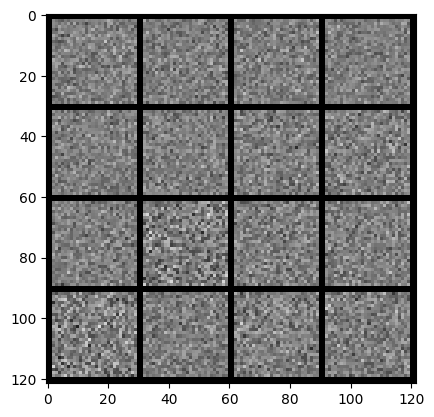

In [8]:
x,y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [9]:
# calculate loss

# gen loss
def calculate_gen_loss(loss_func, gen : Generator, disc : Discriminator, number, z_dim):
    noise = gen_noise(number, z_dim)
    fake = gen(noise)
    pred = disc(fake)
    targets = torch.ones_like(pred)
    gen_loss = loss_func(pred, targets)
    return gen_loss

# disc loss
def calculate_disc_loss(loss_func, gen : Generator, disc : Discriminator, number, real, z_dim):
    noise = gen_noise(number, z_dim)
    fake = gen(noise)
    disc_fake = disc(fake.detach())

    disc_fake_targets = torch.zeros_like(disc_fake)
    disc_fake_loss = loss_func(disc_fake, disc_fake_targets)

    disc_real = disc(real)
    disc_real_targets = torch.ones_like(disc_real)
    disc_real_loss = loss_func(disc_real, disc_real_targets)

    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss
    

 64%|███████████████████████████████▉                  | 299/469 [00:05<00:03, 47.37it/s]

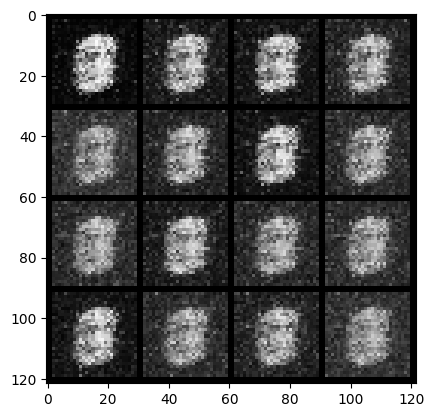

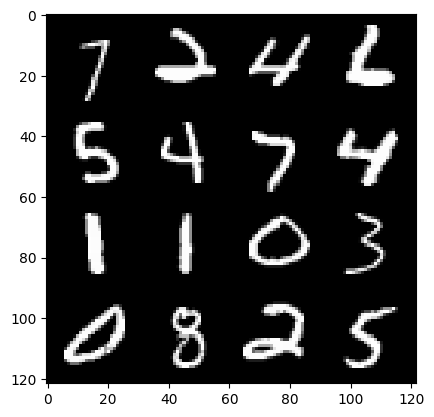

 66%|████████████████████████████████▉                 | 309/469 [00:06<00:04, 35.01it/s]

0: step 300 / gen loss: 1.9255419073502225 / disc_loss 0.34541490145027615


 27%|█████████████▋                                    | 128/469 [00:02<00:06, 50.18it/s]

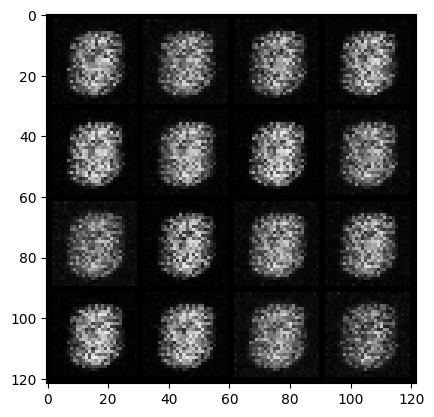

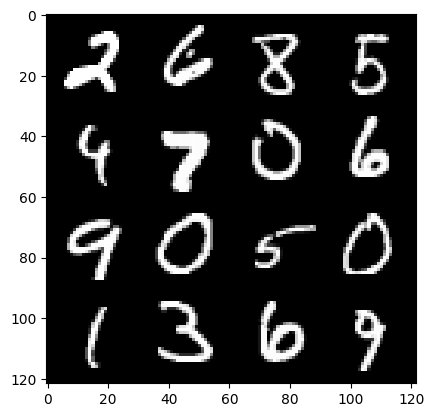

 30%|██████████████▊                                   | 139/469 [00:02<00:09, 36.08it/s]

1: step 600 / gen loss: 3.424989705880482 / disc_loss 0.12543678708374503


 92%|█████████████████████████████████████████████▉    | 431/469 [00:09<00:00, 48.92it/s]

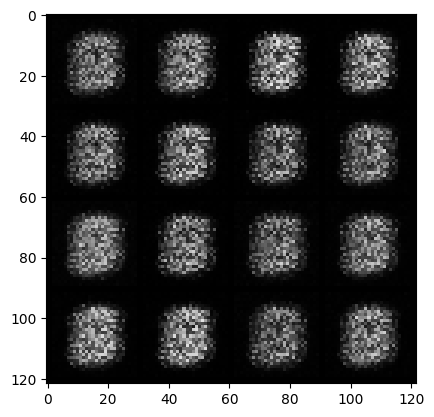

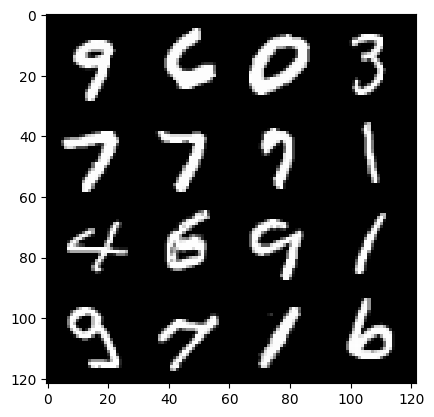

 94%|███████████████████████████████████████████████   | 441/469 [00:09<00:00, 35.64it/s]

1: step 900 / gen loss: 3.3754938936233505 / disc_loss 0.059244526512920885


 55%|███████████████████████████▌                      | 258/469 [00:05<00:04, 46.64it/s]

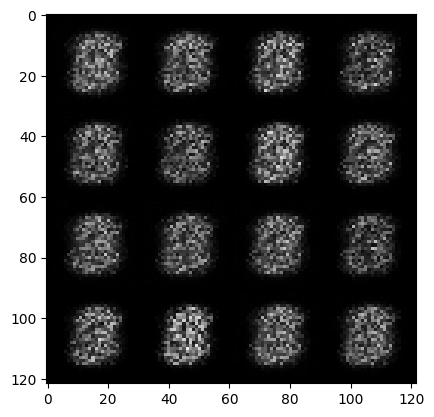

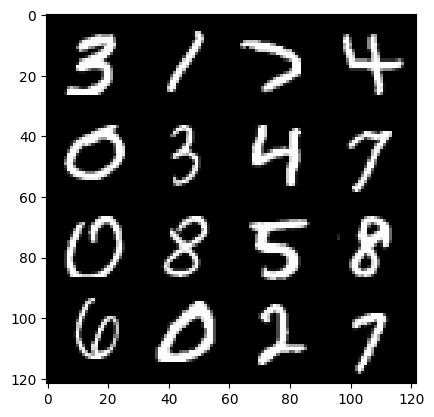

 57%|████████████████████████████▋                     | 269/469 [00:05<00:05, 35.65it/s]

2: step 1200 / gen loss: 3.393296875953677 / disc_loss 0.04119778549919526


 20%|██████████                                         | 93/469 [00:01<00:07, 47.90it/s]

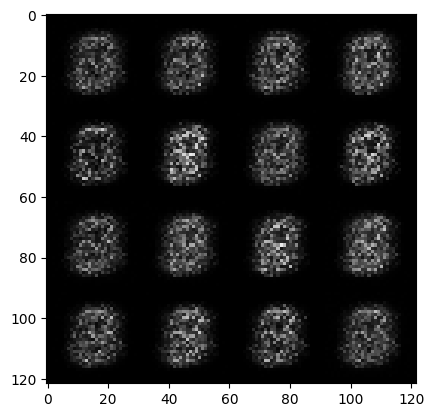

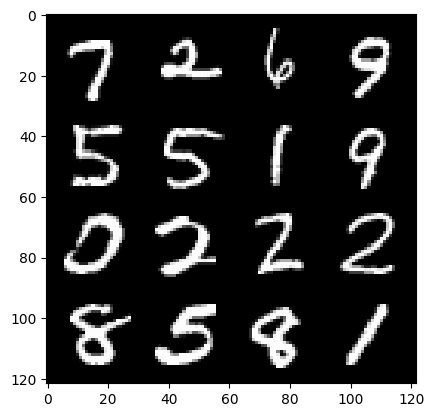

 22%|██████████▉                                       | 103/469 [00:02<00:10, 35.01it/s]

3: step 1500 / gen loss: 3.3916282041867576 / disc_loss 0.041365076905737326


 84%|█████████████████████████████████████████▉        | 393/469 [00:08<00:01, 46.31it/s]

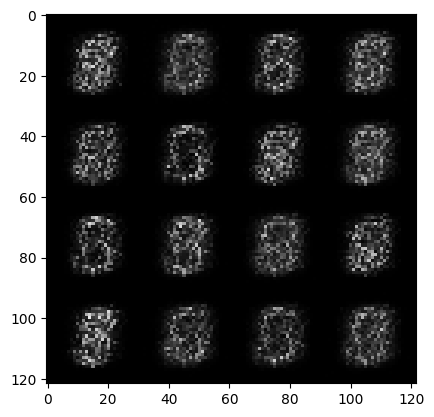

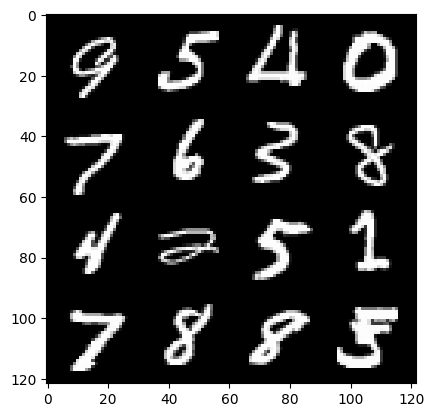

 85%|██████████████████████████████████████████▍       | 398/469 [00:08<00:02, 28.79it/s]

3: step 1800 / gen loss: 3.400444471836088 / disc_loss 0.04471533643702668


 47%|███████████████████████▋                          | 222/469 [00:04<00:05, 48.88it/s]

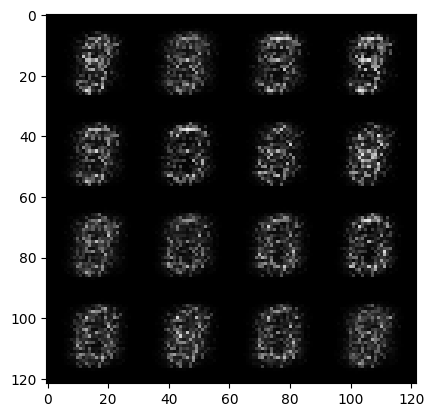

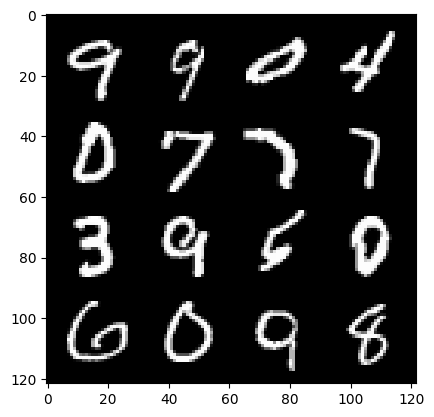

 49%|████████████████████████▋                         | 231/469 [00:05<00:07, 32.23it/s]

4: step 2100 / gen loss: 3.656639735698699 / disc_loss 0.040227968289206405


 11%|█████▋                                             | 52/469 [00:01<00:09, 45.26it/s]

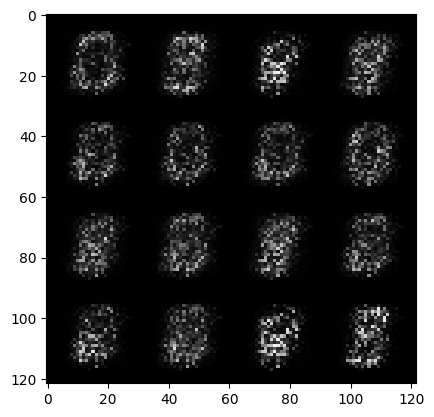

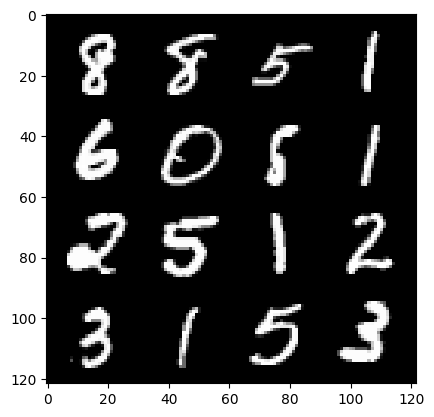

 13%|██████▊                                            | 63/469 [00:01<00:11, 35.17it/s]

5: step 2400 / gen loss: 3.9837360771497097 / disc_loss 0.03231126312787334


 75%|█████████████████████████████████████▋            | 353/469 [00:07<00:02, 47.02it/s]

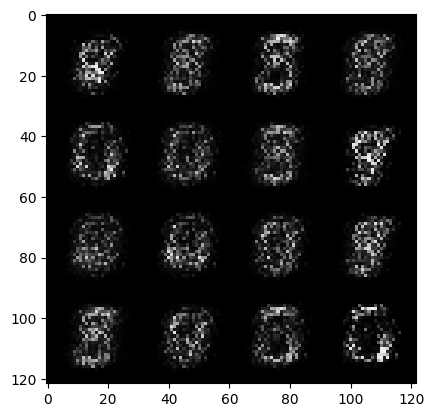

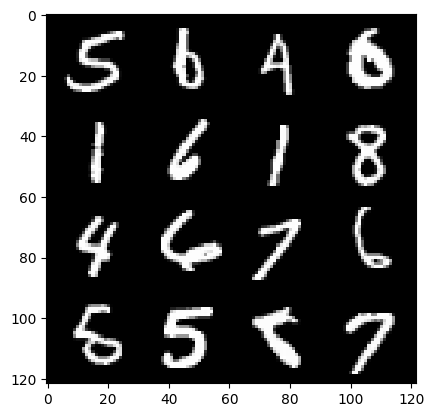

 77%|██████████████████████████████████████▋           | 363/469 [00:08<00:03, 34.51it/s]

5: step 2700 / gen loss: 4.409521141052249 / disc_loss 0.026616009995341305


 40%|███████████████████▊                              | 186/469 [00:03<00:05, 48.54it/s]

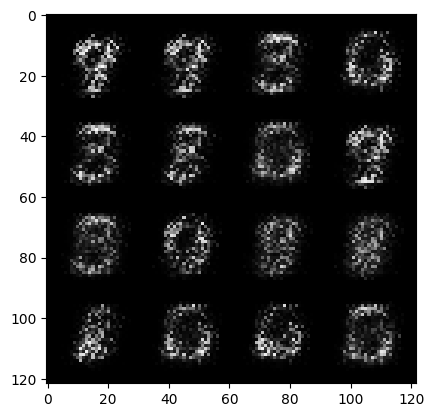

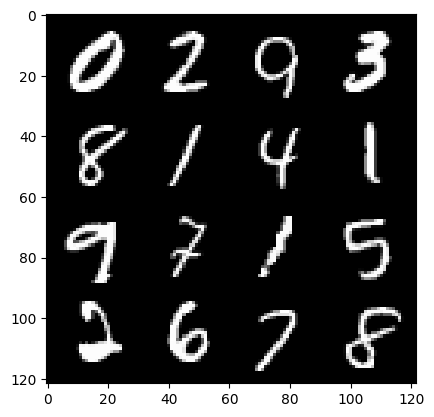

 41%|████████████████████▎                             | 191/469 [00:04<00:08, 31.25it/s]

6: step 3000 / gen loss: 4.9202375125885 / disc_loss 0.022860997359578798


  3%|█▋                                                 | 15/469 [00:00<00:10, 45.11it/s]

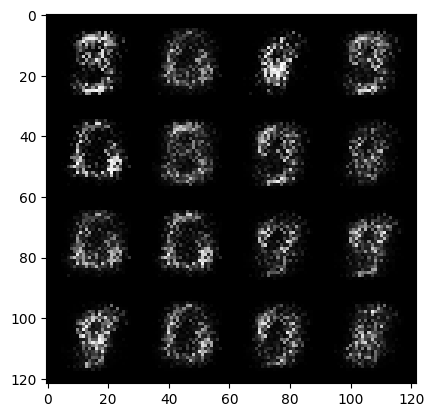

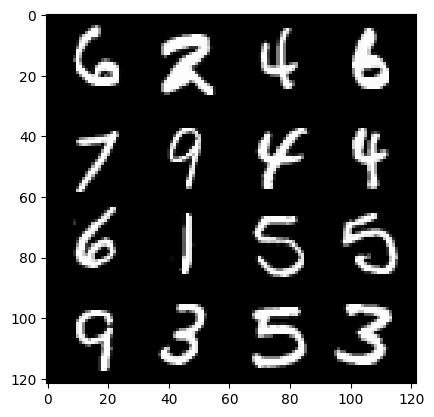

  5%|██▋                                                | 25/469 [00:00<00:13, 31.98it/s]

7: step 3300 / gen loss: 5.031732818285627 / disc_loss 0.025027269273996355


 67%|█████████████████████████████████▋                | 316/469 [00:06<00:03, 48.48it/s]

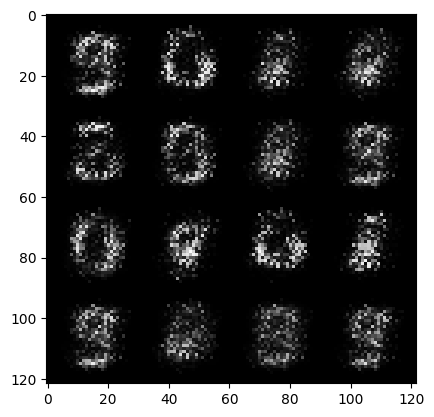

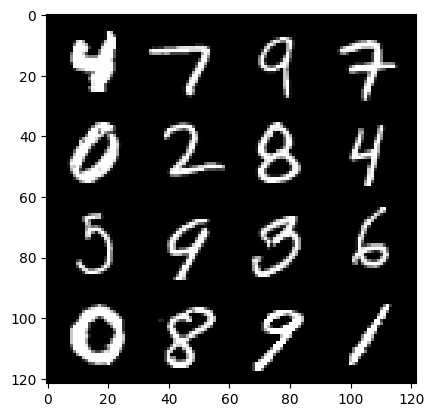

 70%|██████████████████████████████████▊               | 326/469 [00:07<00:04, 34.69it/s]

7: step 3600 / gen loss: 5.017431257565821 / disc_loss 0.022158017201970026


 31%|███████████████▎                                  | 144/469 [00:03<00:07, 44.15it/s]

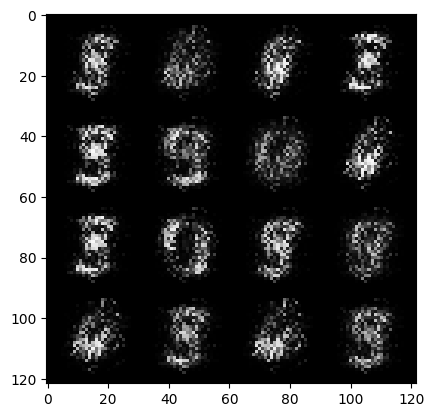

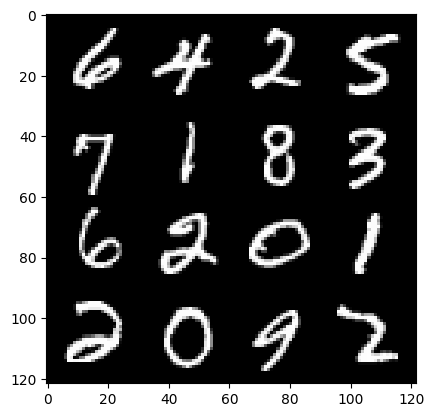

 32%|███████████████▉                                  | 149/469 [00:03<00:11, 28.09it/s]

8: step 3900 / gen loss: 5.336404277483619 / disc_loss 0.01914932657964528


 95%|███████████████████████████████████████████████▋  | 447/469 [00:09<00:00, 47.50it/s]

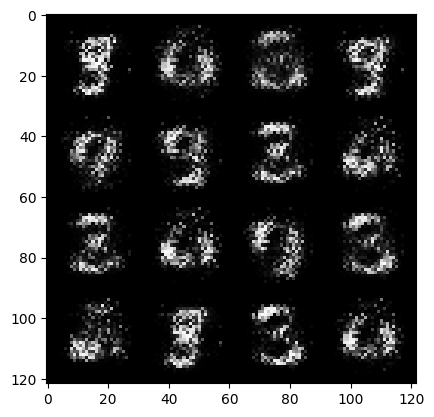

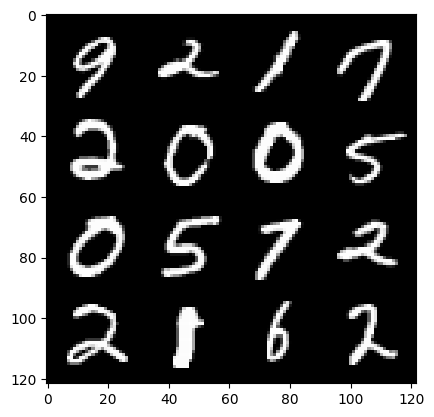

 96%|████████████████████████████████████████████████▏ | 452/469 [00:09<00:00, 27.50it/s]

8: step 4200 / gen loss: 5.798098209698993 / disc_loss 0.019040147170114003


 59%|█████████████████████████████▋                    | 279/469 [00:05<00:03, 48.67it/s]

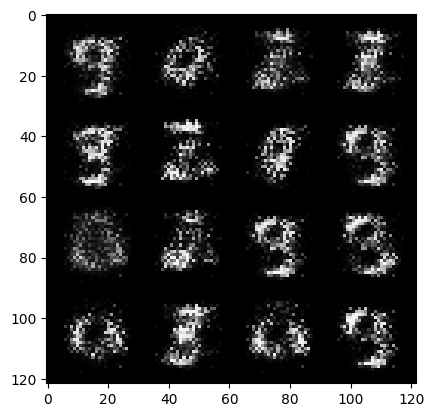

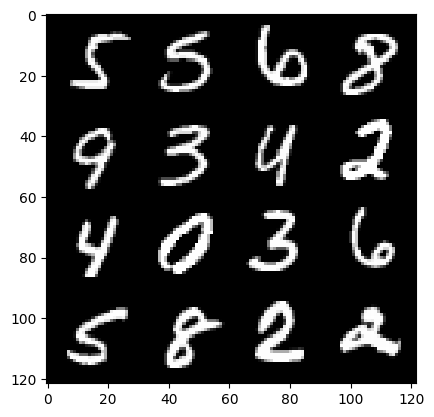

 61%|██████████████████████████████▎                   | 284/469 [00:06<00:05, 31.80it/s]

9: step 4500 / gen loss: 5.945174411137897 / disc_loss 0.016386517691425975


 23%|███████████▋                                      | 110/469 [00:02<00:07, 46.52it/s]

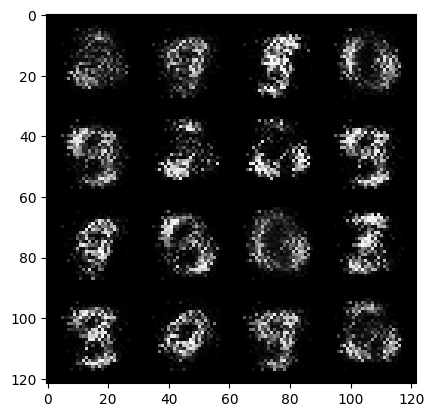

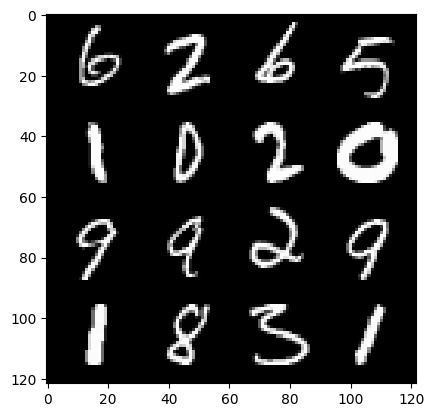

 25%|████████████▎                                     | 115/469 [00:02<00:11, 31.14it/s]

10: step 4800 / gen loss: 5.8775235748291 / disc_loss 0.013950180575872472


 87%|███████████████████████████████████████████▍      | 407/469 [00:09<00:01, 45.34it/s]

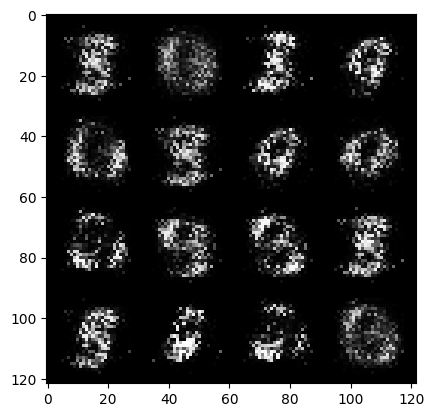

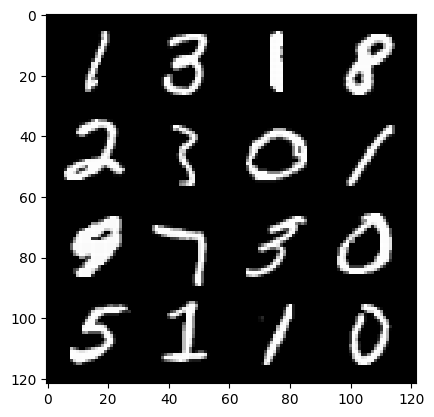

 89%|████████████████████████████████████████████▍     | 417/469 [00:09<00:01, 33.17it/s]

10: step 5100 / gen loss: 6.186498176256815 / disc_loss 0.010528168099311496


 51%|█████████████████████████▎                        | 237/469 [00:05<00:05, 43.36it/s]

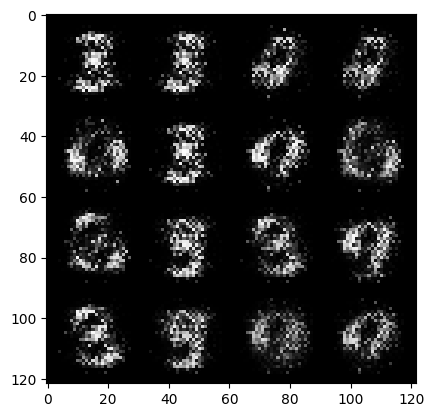

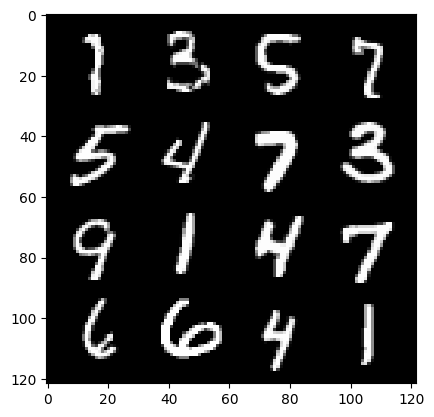

 53%|██████████████████████████▎                       | 247/469 [00:05<00:07, 31.44it/s]

11: step 5400 / gen loss: 6.445531706809997 / disc_loss 0.008945573191158468


 15%|███████▌                                           | 70/469 [00:01<00:08, 47.53it/s]

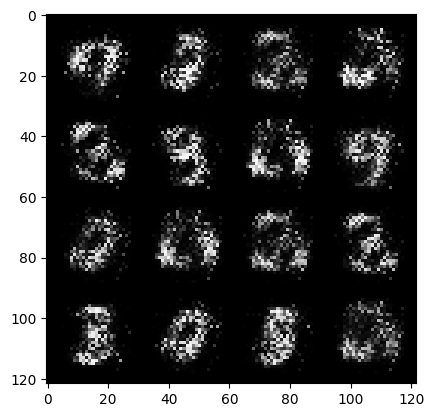

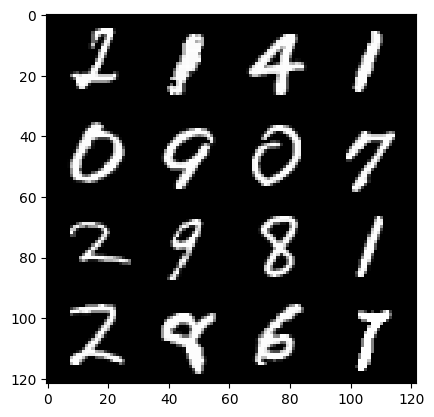

 17%|████████▋                                          | 80/469 [00:01<00:11, 32.97it/s]

12: step 5700 / gen loss: 6.442560380299888 / disc_loss 0.008921491838215546


 79%|███████████████████████████████████████▋          | 372/469 [00:08<00:02, 45.58it/s]

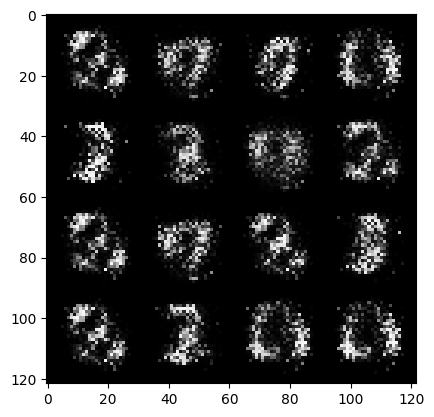

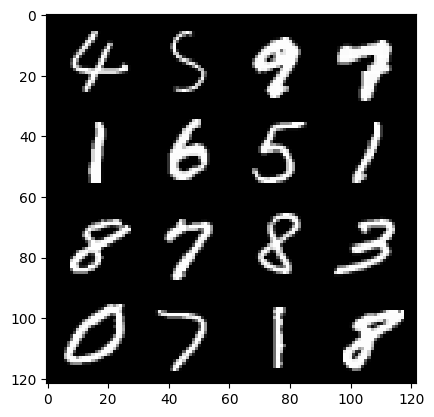

 80%|████████████████████████████████████████▏         | 377/469 [00:08<00:03, 28.31it/s]

12: step 6000 / gen loss: 6.730750169754032 / disc_loss 0.007608617361790189


 43%|█████████████████████▍                            | 201/469 [00:04<00:05, 48.05it/s]

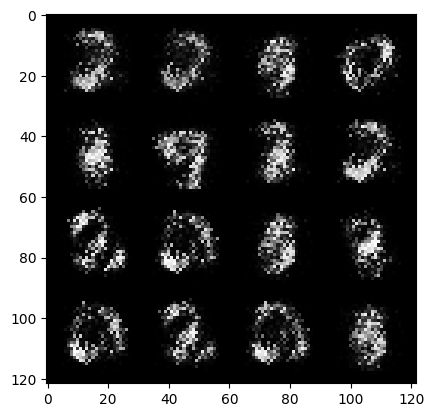

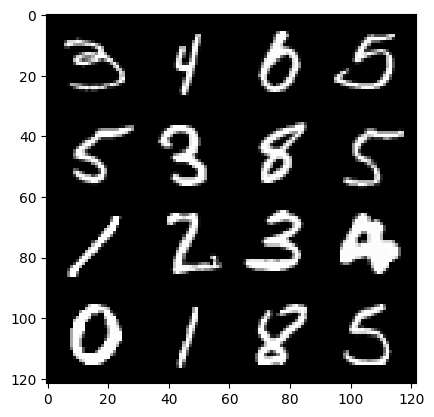

 45%|██████████████████████▍                           | 211/469 [00:04<00:07, 33.57it/s]

13: step 6300 / gen loss: 7.058745341300965 / disc_loss 0.010049592632567507


  7%|███▎                                               | 31/469 [00:00<00:10, 43.38it/s]

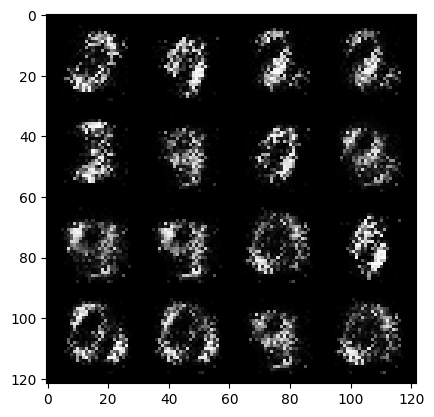

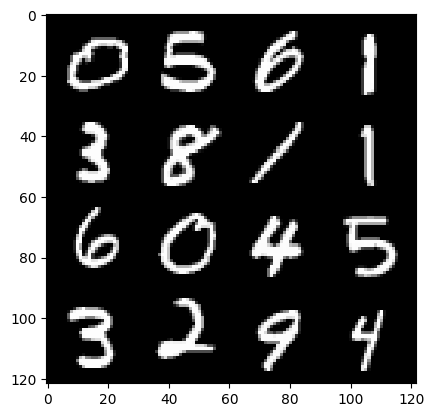

  9%|████▍                                              | 41/469 [00:01<00:13, 31.11it/s]

14: step 6600 / gen loss: 6.60953873316447 / disc_loss 0.012021912670073407


 71%|███████████████████████████████████▍              | 332/469 [00:07<00:03, 45.24it/s]

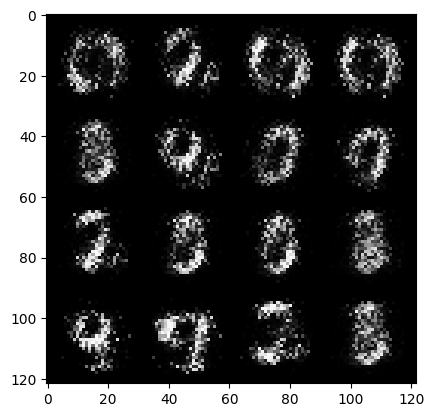

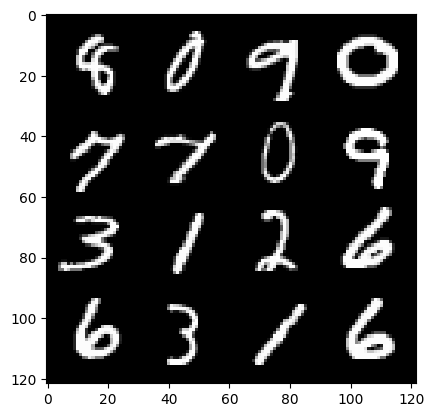

 73%|████████████████████████████████████▍             | 342/469 [00:07<00:03, 33.01it/s]

14: step 6900 / gen loss: 6.81414250055949 / disc_loss 0.013816945263339825


 35%|█████████████████▍                                | 164/469 [00:03<00:07, 41.40it/s]

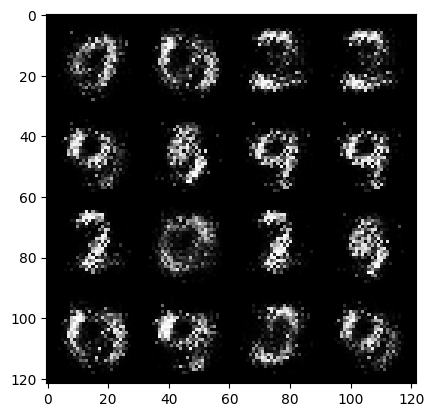

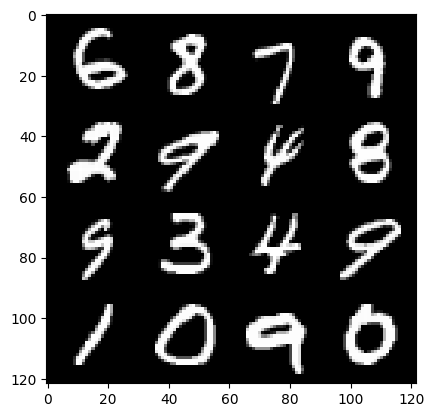

 36%|██████████████████                                | 169/469 [00:04<00:11, 25.73it/s]

15: step 7200 / gen loss: 6.551277645428973 / disc_loss 0.011497800673435749


 99%|█████████████████████████████████████████████████▎| 463/469 [00:10<00:00, 43.62it/s]

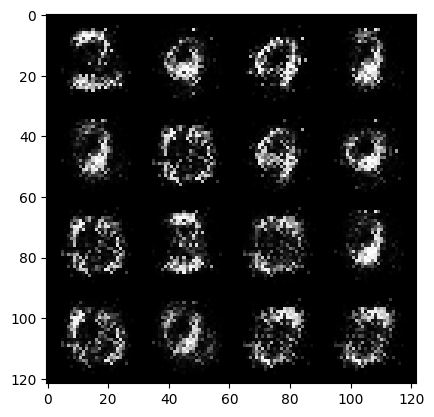

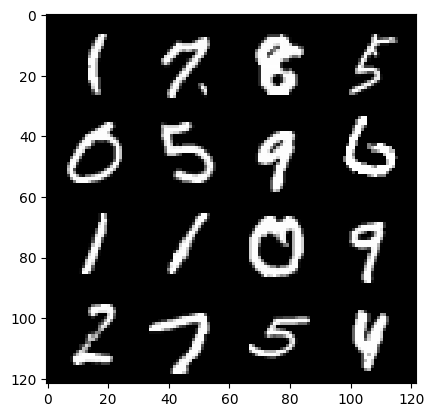

100%|██████████████████████████████████████████████████| 469/469 [00:11<00:00, 42.05it/s]


15: step 7500 / gen loss: 6.418356738090514 / disc_loss 0.010069809080256766


 63%|███████████████████████████████▍                  | 295/469 [00:06<00:03, 44.59it/s]

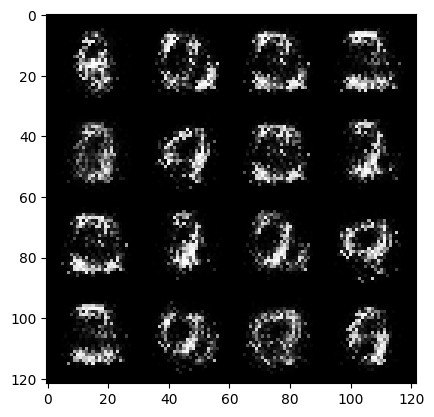

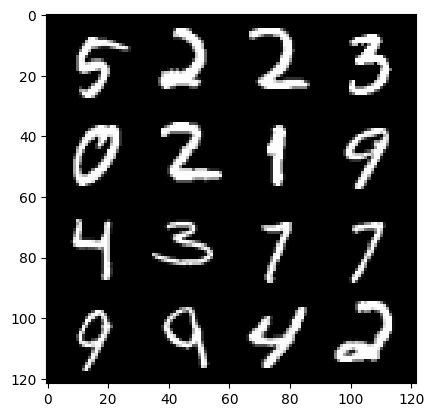

 65%|████████████████████████████████▌                 | 305/469 [00:07<00:05, 31.67it/s]

16: step 7800 / gen loss: 6.804553116162612 / disc_loss 0.007477867717777069


 26%|█████████████                                     | 123/469 [00:02<00:07, 44.86it/s]

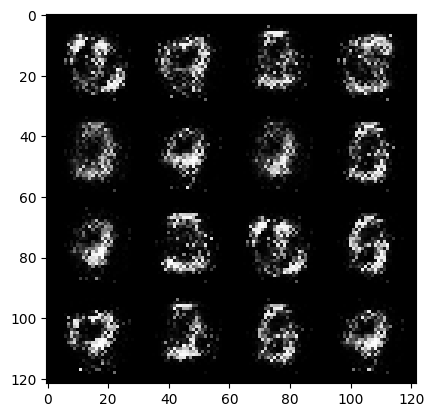

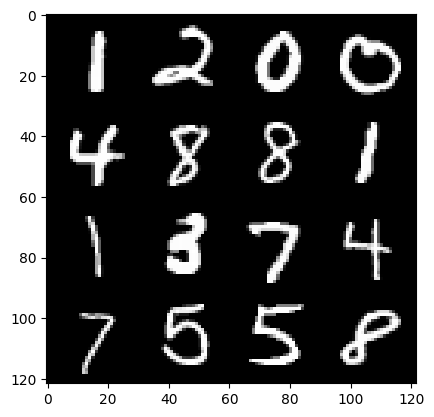

 28%|██████████████                                    | 132/469 [00:03<00:11, 28.33it/s]

17: step 8100 / gen loss: 7.067806161244708 / disc_loss 0.007625506554419793


 91%|█████████████████████████████████████████████▌    | 427/469 [00:10<00:00, 44.48it/s]

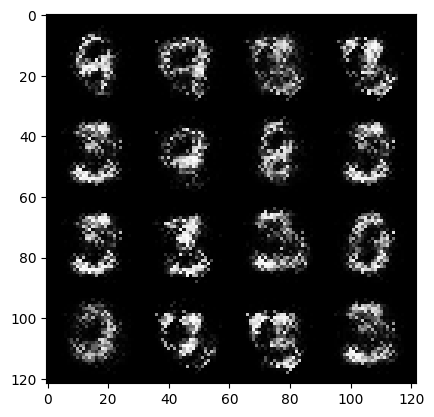

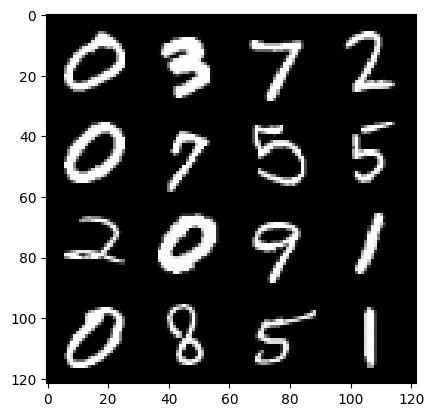

 92%|██████████████████████████████████████████████    | 432/469 [00:10<00:01, 29.82it/s]

17: step 8400 / gen loss: 7.311494003931682 / disc_loss 0.010796726184198637


 55%|███████████████████████████▌                      | 258/469 [00:05<00:04, 47.25it/s]

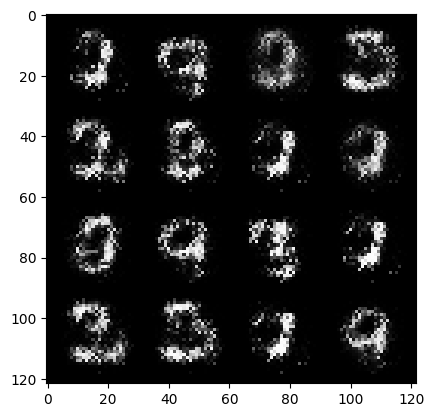

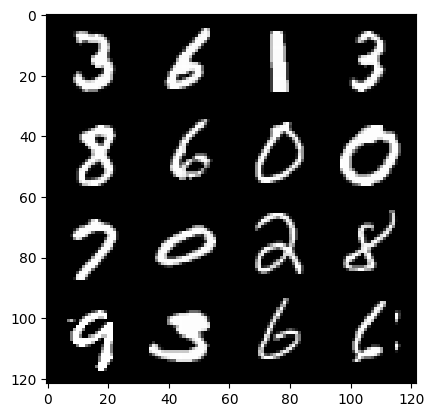

 56%|████████████████████████████                      | 263/469 [00:05<00:07, 28.33it/s]

18: step 8700 / gen loss: 6.8866823275883995 / disc_loss 0.012751555677969007


 18%|█████████▏                                         | 85/469 [00:01<00:08, 47.11it/s]

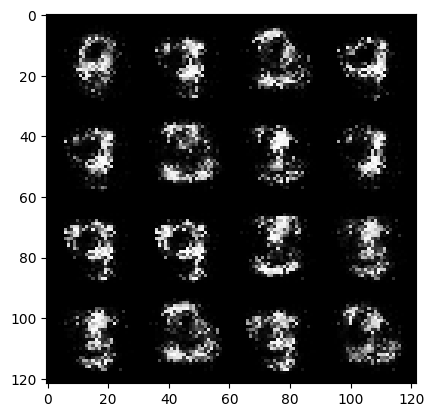

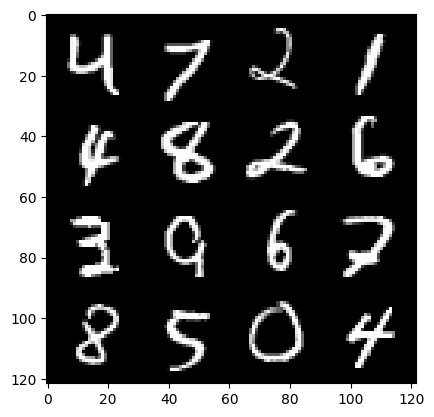

 20%|██████████▎                                        | 95/469 [00:02<00:10, 34.81it/s]

19: step 9000 / gen loss: 6.682951033910113 / disc_loss 0.011614400052155057


 82%|█████████████████████████████████████████▏        | 386/469 [00:08<00:01, 44.69it/s]

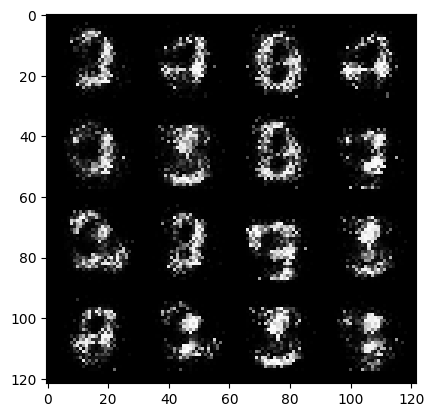

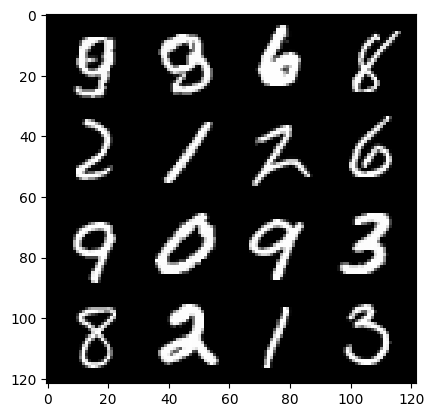

 84%|██████████████████████████████████████████▏       | 396/469 [00:08<00:02, 29.34it/s]

19: step 9300 / gen loss: 7.037092514038084 / disc_loss 0.009120141817644858


 46%|███████████████████████                           | 216/469 [00:04<00:05, 46.03it/s]

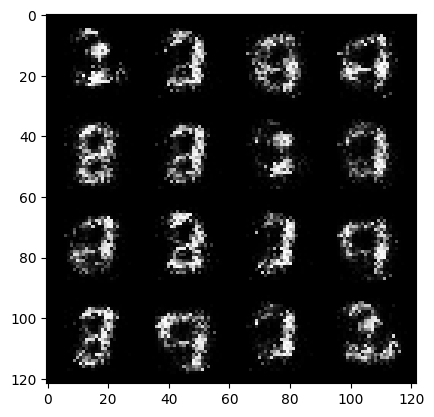

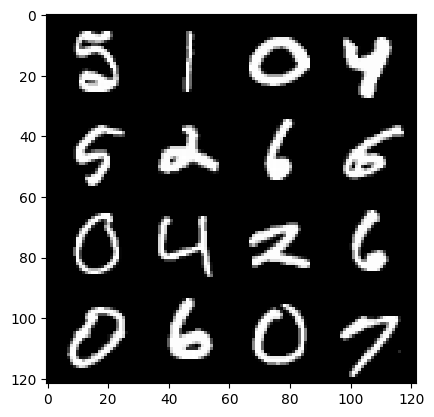

 48%|███████████████████████▉                          | 225/469 [00:05<00:07, 31.08it/s]

20: step 9600 / gen loss: 7.567316319147745 / disc_loss 0.009417293496274702


 10%|█████▎                                             | 49/469 [00:01<00:08, 47.19it/s]

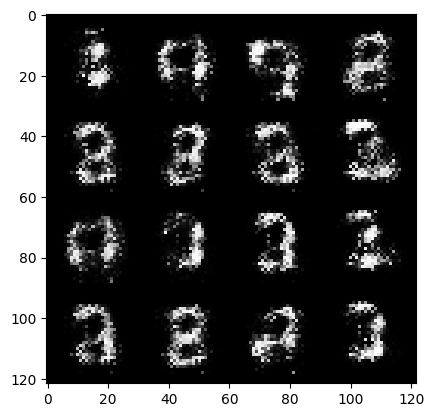

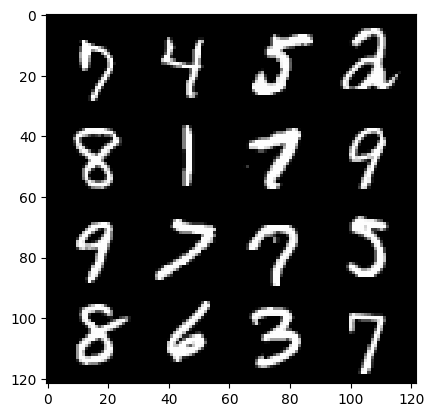

 13%|██████▍                                            | 59/469 [00:01<00:11, 34.39it/s]

21: step 9900 / gen loss: 7.439585510889684 / disc_loss 0.012303793434208881


 74%|█████████████████████████████████████▏            | 349/469 [00:07<00:02, 47.21it/s]

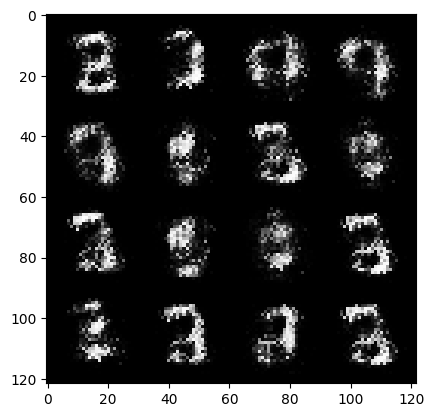

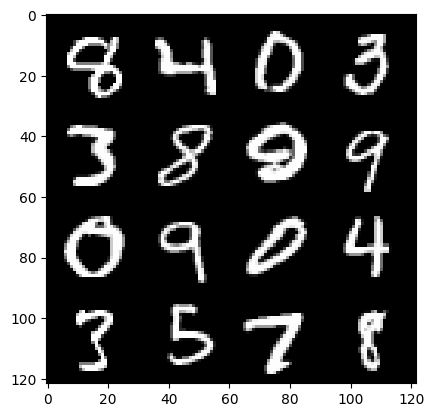

 77%|██████████████████████████████████████▎           | 359/469 [00:08<00:03, 31.12it/s]

21: step 10200 / gen loss: 6.97504284381866 / disc_loss 0.016234013861200453


 38%|███████████████████▏                              | 180/469 [00:04<00:06, 44.71it/s]

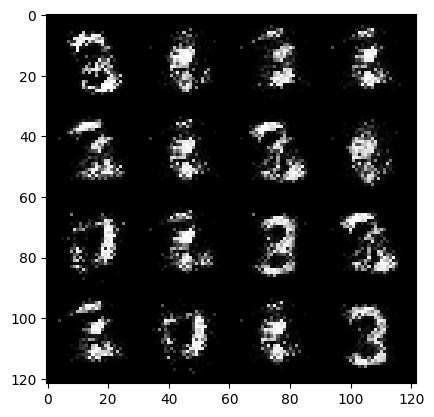

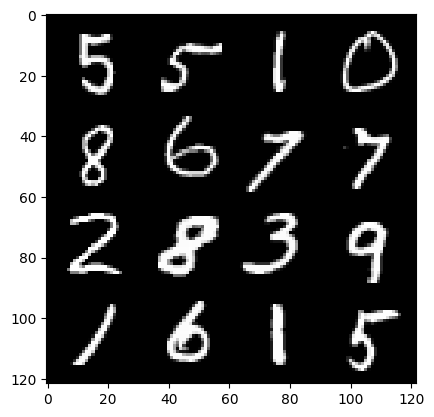

 41%|████████████████████▎                             | 190/469 [00:04<00:08, 31.81it/s]

22: step 10500 / gen loss: 6.775670738220215 / disc_loss 0.01302538827682535


  2%|█                                                  | 10/469 [00:00<00:10, 43.49it/s]

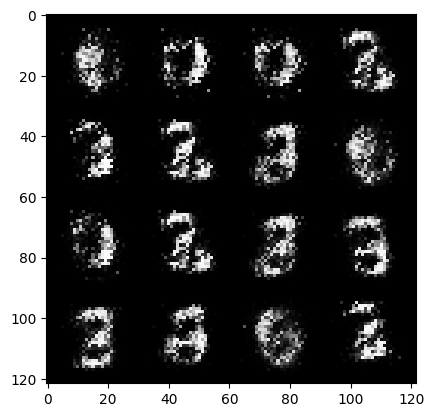

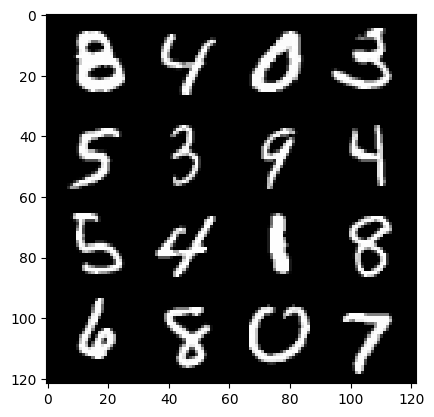

  4%|██▏                                                | 20/469 [00:00<00:15, 28.44it/s]

23: step 10800 / gen loss: 6.995644803047176 / disc_loss 0.01208740988668675


 67%|█████████████████████████████████▎                | 313/469 [00:07<00:03, 45.63it/s]

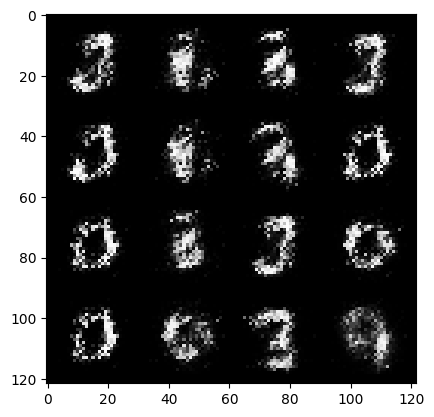

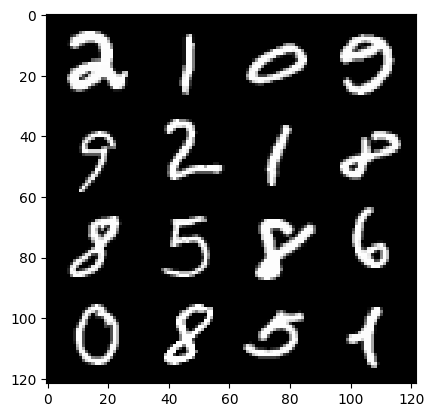

 68%|█████████████████████████████████▉                | 318/469 [00:07<00:05, 28.04it/s]

23: step 11100 / gen loss: 7.195368328094475 / disc_loss 0.009802767922325685


 30%|███████████████▏                                  | 143/469 [00:03<00:06, 46.90it/s]

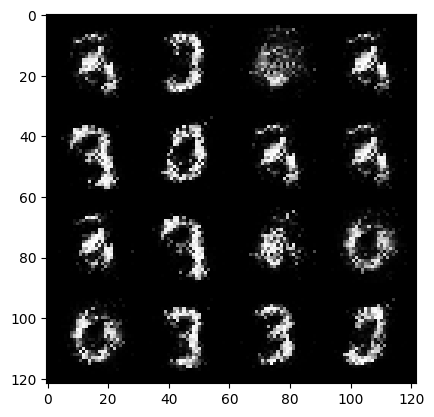

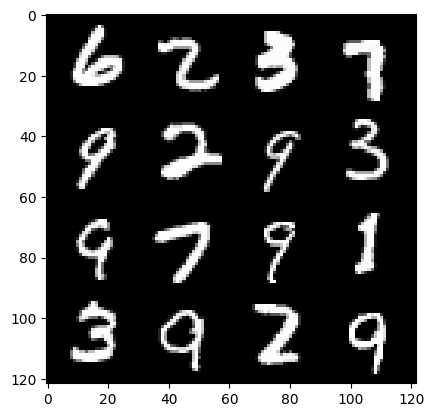

 32%|███████████████▊                                  | 148/469 [00:03<00:11, 28.39it/s]

24: step 11400 / gen loss: 7.493074978192647 / disc_loss 0.009956312041807304


 94%|███████████████████████████████████████████████   | 441/469 [00:09<00:00, 45.41it/s]

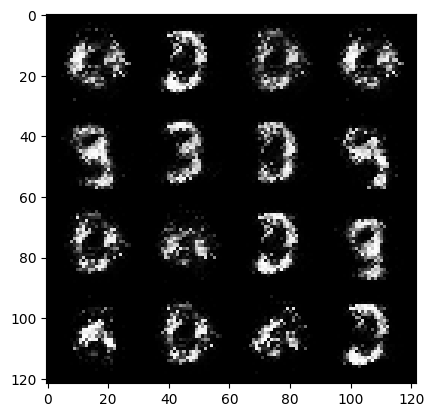

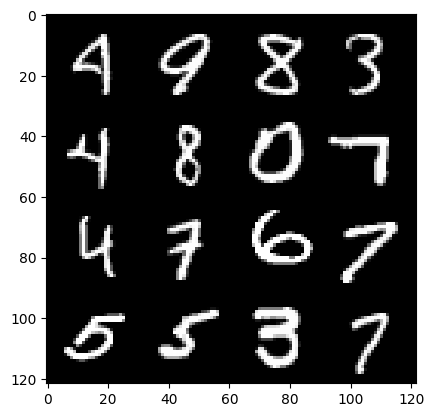

 96%|████████████████████████████████████████████████  | 451/469 [00:10<00:00, 32.13it/s]

24: step 11700 / gen loss: 7.708297363917029 / disc_loss 0.011574018868462493


 58%|█████████████████████████████                     | 273/469 [00:05<00:04, 45.78it/s]

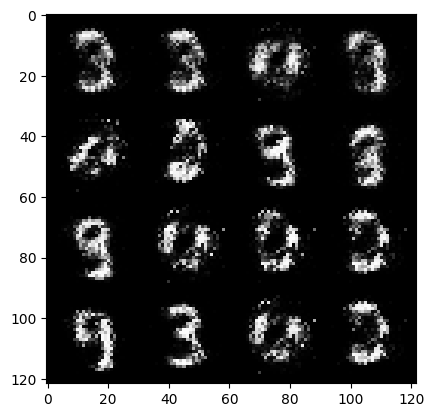

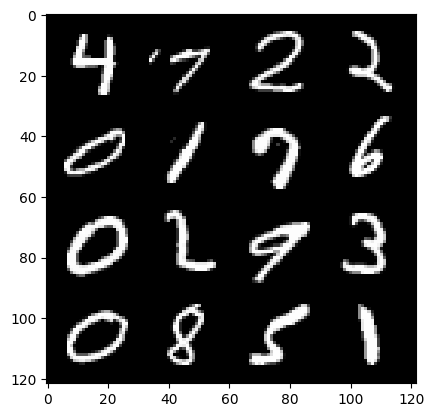

 60%|██████████████████████████████▏                   | 283/469 [00:06<00:05, 33.09it/s]

25: step 12000 / gen loss: 6.95440627415975 / disc_loss 0.014079510266116509


 22%|███████████▏                                      | 105/469 [00:02<00:09, 38.07it/s]

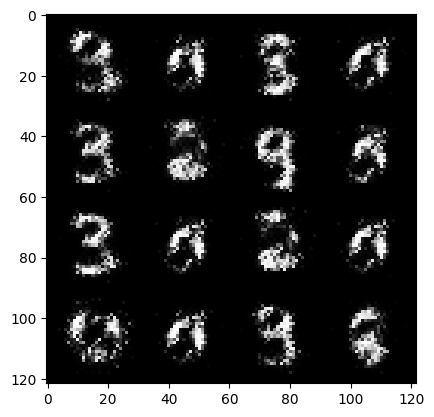

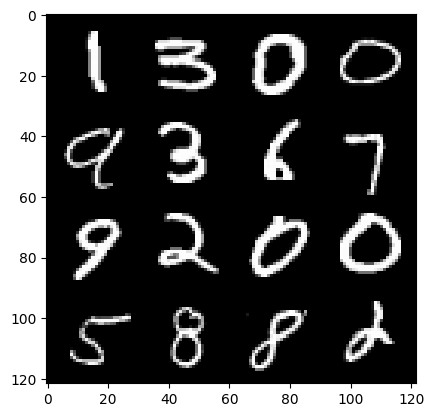

 24%|████████████                                      | 113/469 [00:03<00:14, 25.19it/s]

26: step 12300 / gen loss: 6.632427379290267 / disc_loss 0.019126107084254416


 86%|███████████████████████████████████████████       | 404/469 [00:09<00:01, 46.78it/s]

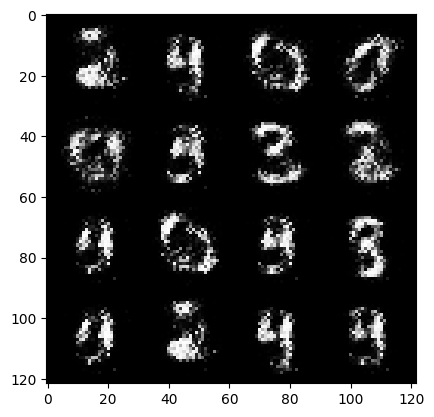

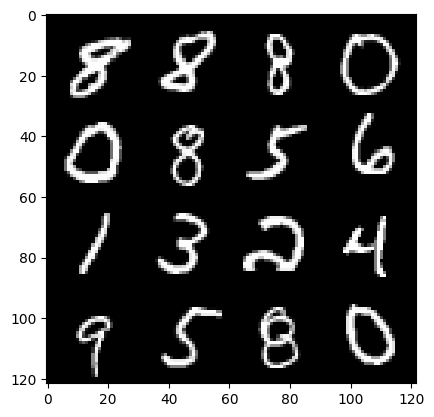

 88%|████████████████████████████████████████████▏     | 414/469 [00:09<00:01, 33.73it/s]

26: step 12600 / gen loss: 7.225118705431623 / disc_loss 0.01852187940773245


 50%|█████████████████████████                         | 235/469 [00:05<00:05, 45.94it/s]

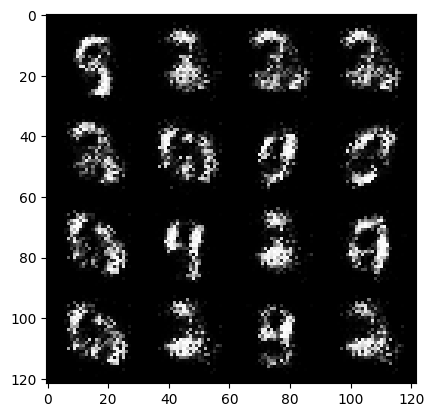

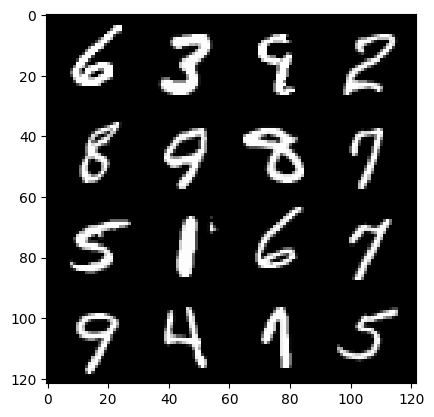

 52%|██████████████████████████                        | 244/469 [00:05<00:07, 31.31it/s]

27: step 12900 / gen loss: 6.880835789044702 / disc_loss 0.015079366629943249


 14%|███████▏                                           | 66/469 [00:01<00:08, 48.37it/s]

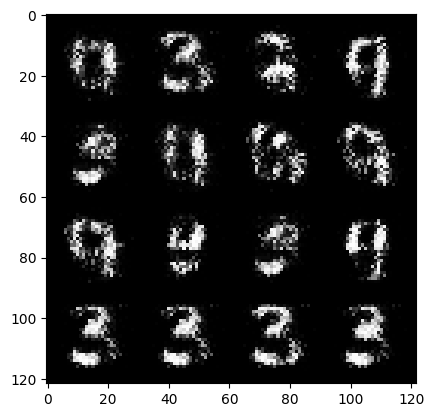

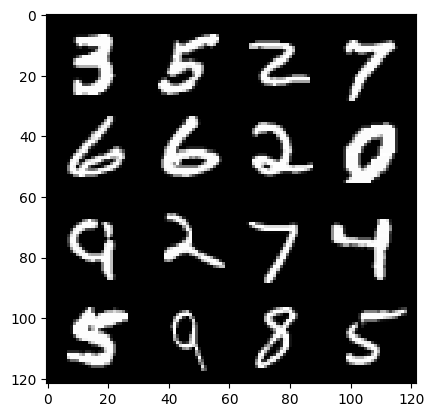

 16%|████████▎                                          | 77/469 [00:01<00:10, 36.72it/s]

28: step 13200 / gen loss: 6.619809417724608 / disc_loss 0.012974158853370069


 78%|███████████████████████████████████████▏          | 367/469 [00:08<00:02, 45.32it/s]

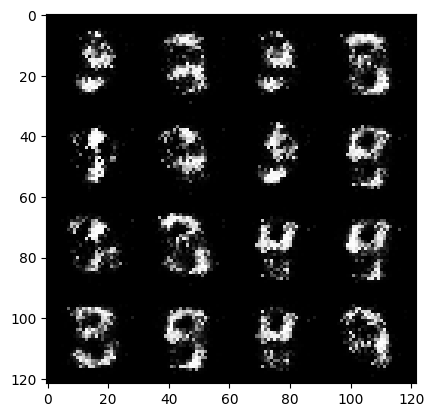

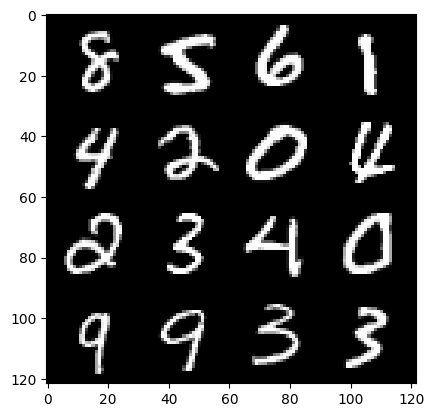

 80%|████████████████████████████████████████▏         | 377/469 [00:08<00:02, 32.41it/s]

28: step 13500 / gen loss: 6.580428442955018 / disc_loss 0.01382679018269605


 42%|█████████████████████                             | 197/469 [00:04<00:05, 46.96it/s]

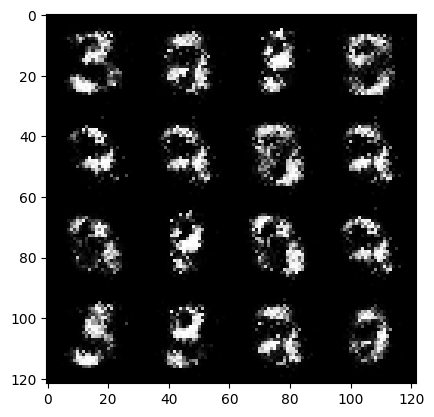

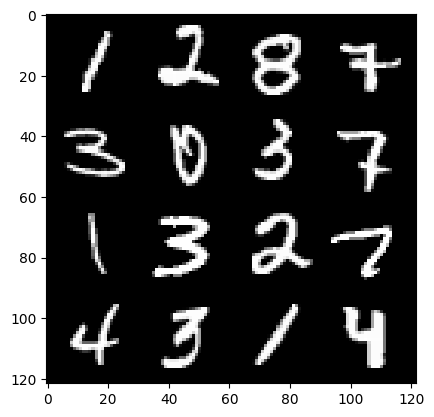

 44%|█████████████████████▉                            | 206/469 [00:04<00:08, 30.35it/s]

29: step 13800 / gen loss: 7.331768143971767 / disc_loss 0.012812002944604805


  6%|██▊                                                | 26/469 [00:00<00:09, 48.18it/s]

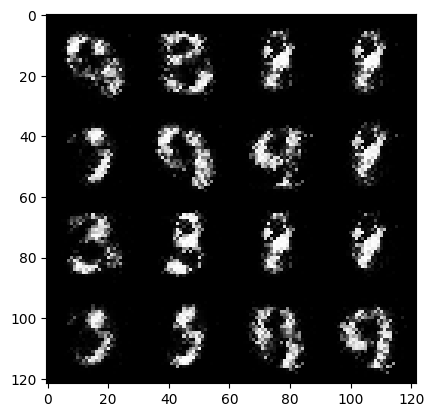

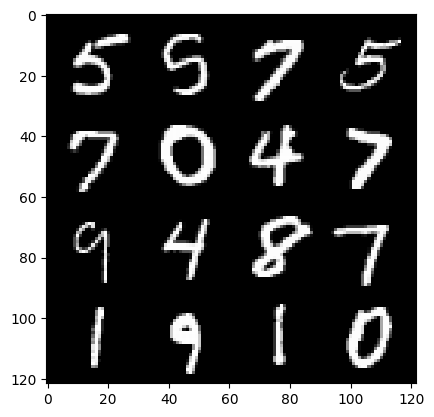

  8%|███▉                                               | 36/469 [00:00<00:13, 33.17it/s]

30: step 14100 / gen loss: 7.297952240308129 / disc_loss 0.014271524910194181


 70%|██████████████████████████████████▊               | 327/469 [00:07<00:03, 44.93it/s]

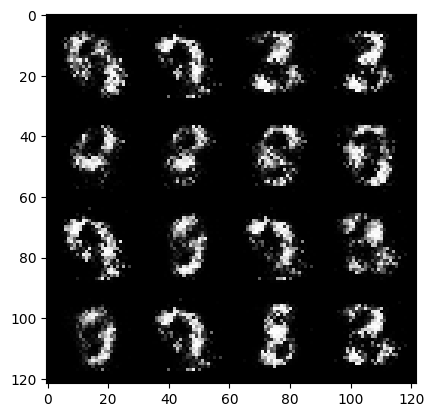

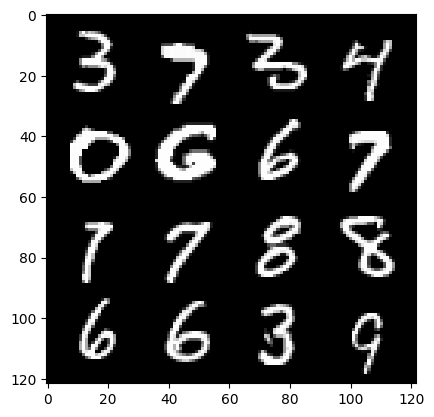

 72%|███████████████████████████████████▉              | 337/469 [00:07<00:04, 29.15it/s]

30: step 14400 / gen loss: 7.180837065378824 / disc_loss 0.015611973280708007


 34%|████████████████▉                                 | 159/469 [00:03<00:06, 49.66it/s]

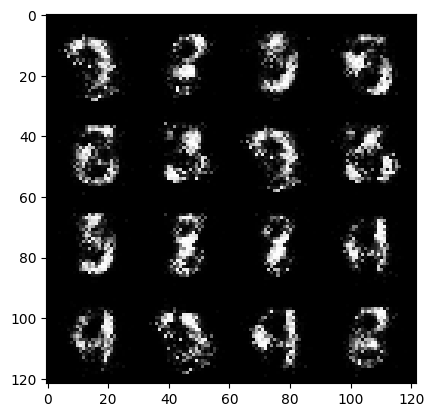

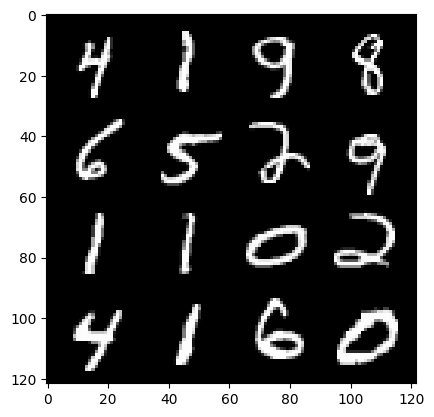

 36%|██████████████████                                | 169/469 [00:03<00:08, 36.90it/s]

31: step 14700 / gen loss: 7.403093663851425 / disc_loss 0.013454940861168628


 98%|████████████████████████████████████████████████▊ | 458/469 [00:09<00:00, 49.59it/s]

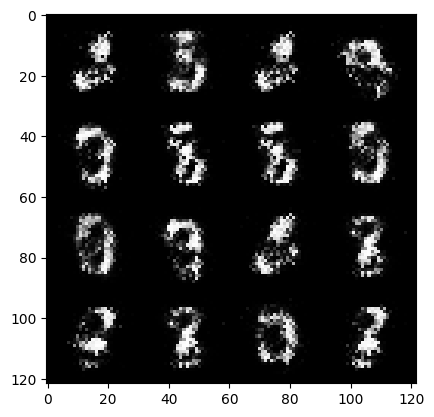

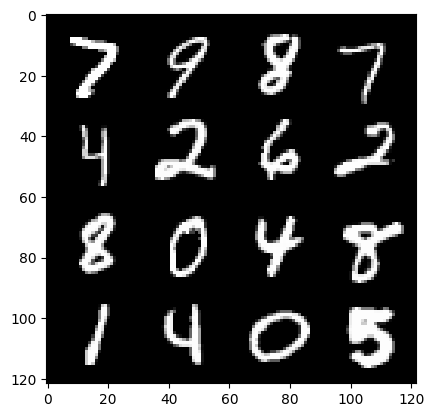

100%|██████████████████████████████████████████████████| 469/469 [00:09<00:00, 47.37it/s]


31: step 15000 / gen loss: 7.64457686106364 / disc_loss 0.01647743684705346


 62%|███████████████████████████████▏                  | 292/469 [00:06<00:03, 48.55it/s]

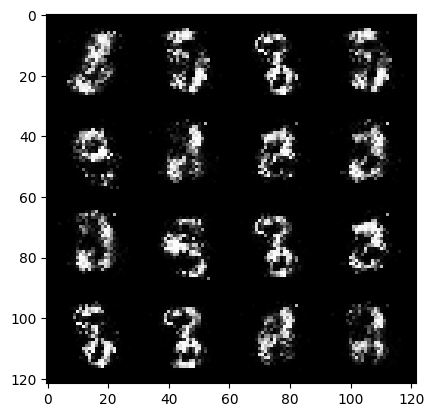

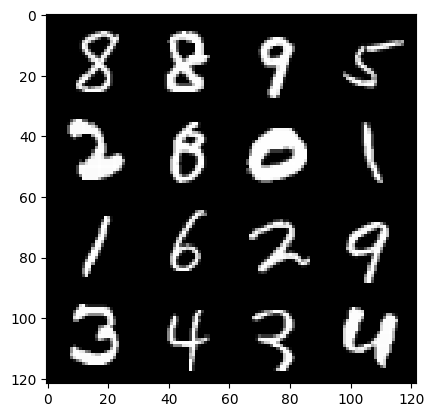

 63%|███████████████████████████████▋                  | 297/469 [00:06<00:05, 30.50it/s]

32: step 15300 / gen loss: 6.700616790453589 / disc_loss 0.02046805744602655


 25%|████████████▋                                     | 119/469 [00:02<00:07, 45.80it/s]

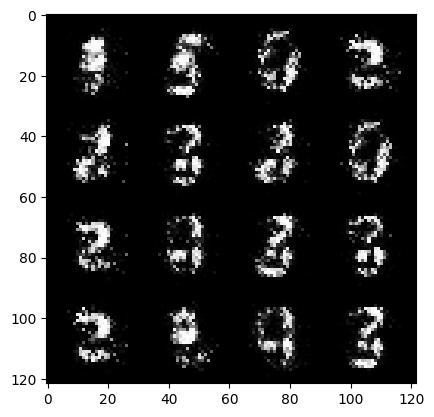

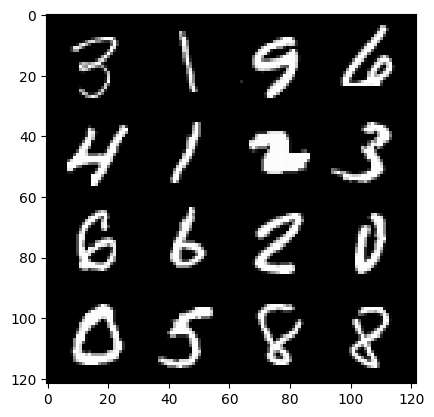

 28%|█████████████▊                                    | 129/469 [00:03<00:10, 33.55it/s]

33: step 15600 / gen loss: 6.553478248914081 / disc_loss 0.019067721713799987


 89%|████████████████████████████████████████████▋     | 419/469 [00:09<00:01, 46.58it/s]

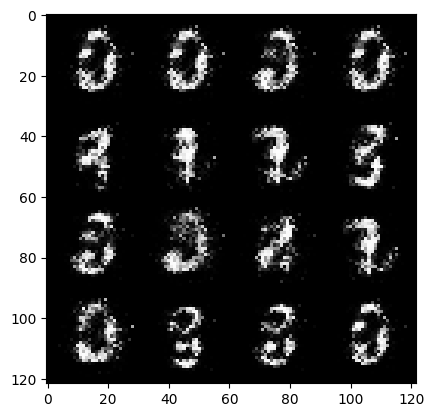

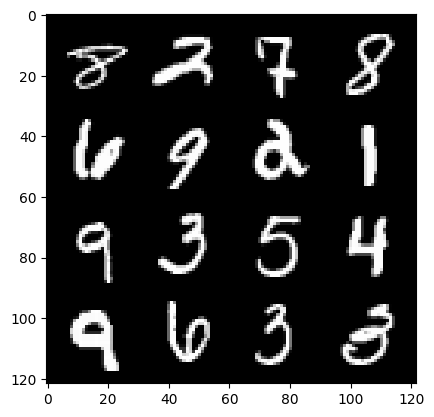

 91%|█████████████████████████████████████████████▋    | 429/469 [00:09<00:01, 34.74it/s]

33: step 15900 / gen loss: 6.785650134086609 / disc_loss 0.019420863062453754


 54%|██████████████████████████▊                       | 251/469 [00:05<00:04, 48.17it/s]

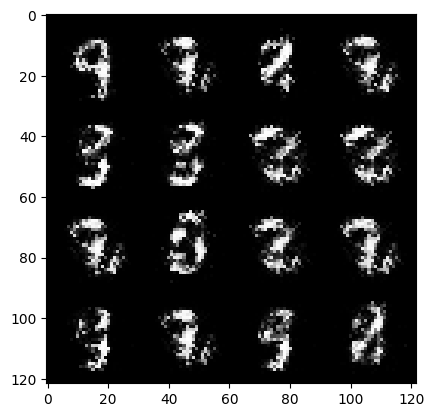

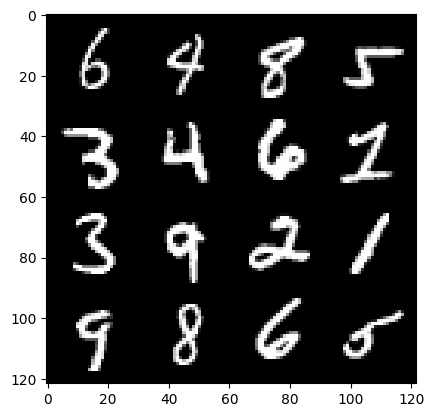

 56%|███████████████████████████▊                      | 261/469 [00:05<00:05, 35.67it/s]

34: step 16200 / gen loss: 6.546662432352705 / disc_loss 0.01846148376973966


 18%|█████████▏                                         | 85/469 [00:01<00:08, 46.26it/s]

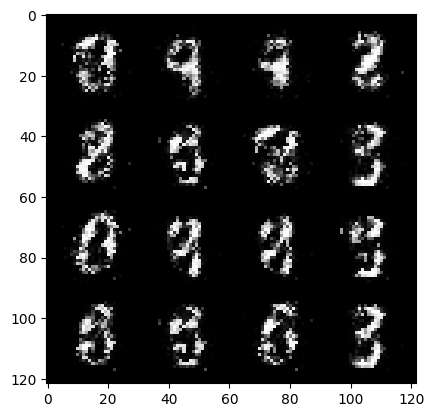

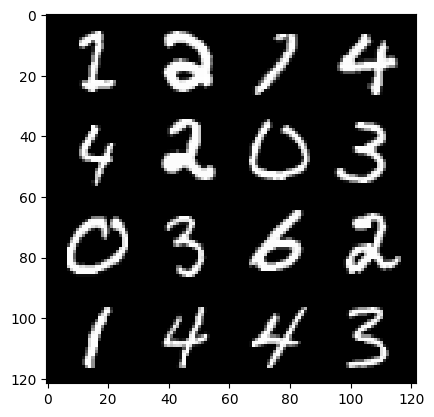

 19%|█████████▊                                         | 90/469 [00:02<00:12, 30.67it/s]

35: step 16500 / gen loss: 6.437835567792254 / disc_loss 0.021405614664157226


 81%|████████████████████████████████████████▋         | 382/469 [00:08<00:01, 49.02it/s]

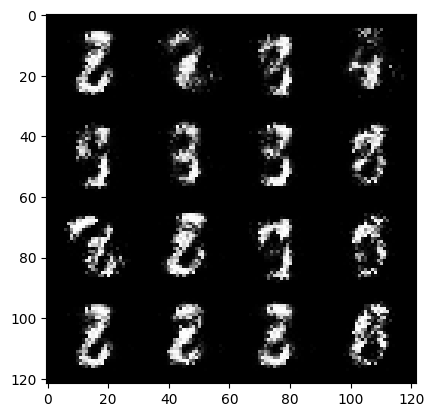

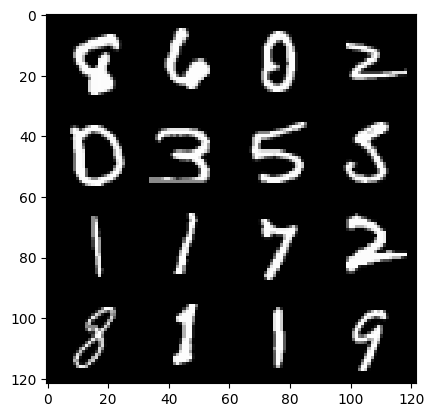

 84%|█████████████████████████████████████████▉        | 393/469 [00:08<00:02, 36.56it/s]

35: step 16800 / gen loss: 6.575879292488099 / disc_loss 0.023013428485331455


 46%|██████████████████████▉                           | 215/469 [00:04<00:05, 48.14it/s]

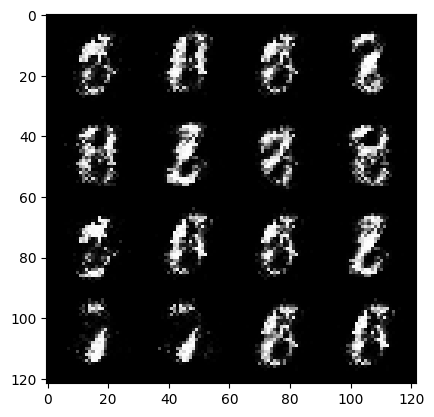

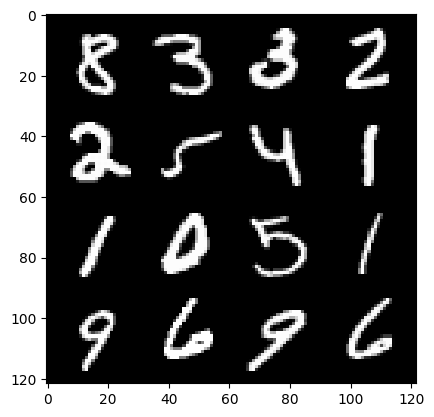

 48%|███████████████████████▉                          | 225/469 [00:04<00:06, 35.35it/s]

36: step 17100 / gen loss: 6.359730596542364 / disc_loss 0.023420915325017014


  9%|████▋                                              | 43/469 [00:00<00:08, 47.97it/s]

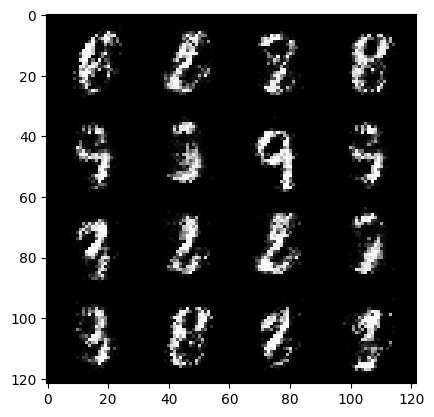

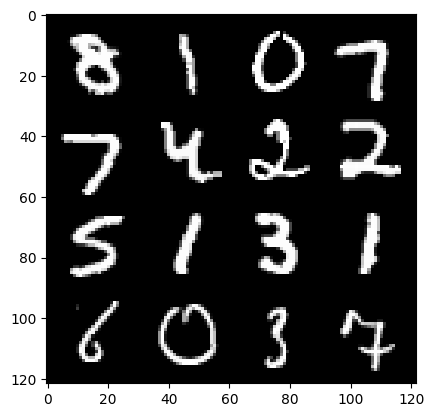

 11%|█████▊                                             | 53/469 [00:01<00:12, 33.89it/s]

37: step 17400 / gen loss: 6.2848165639241556 / disc_loss 0.021645438129392746


 73%|████████████████████████████████████▋             | 344/469 [00:07<00:02, 44.99it/s]

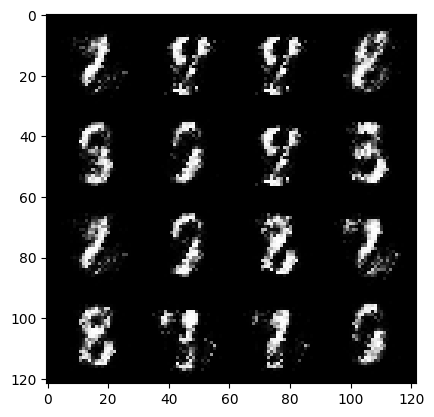

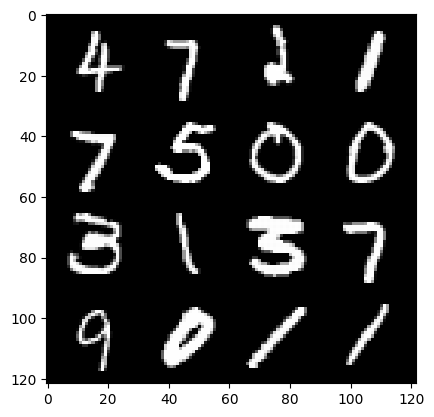

 75%|█████████████████████████████████████▋            | 354/469 [00:08<00:03, 34.29it/s]

37: step 17700 / gen loss: 6.185130745569867 / disc_loss 0.027844684501178562


 38%|██████████████████▉                               | 178/469 [00:03<00:06, 47.52it/s]

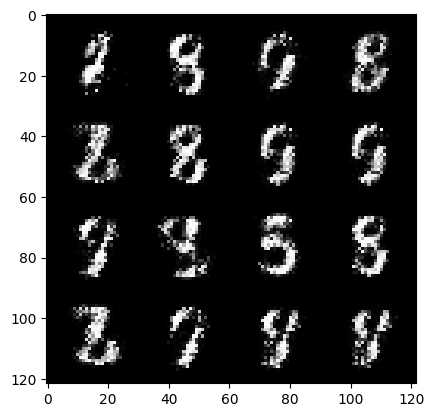

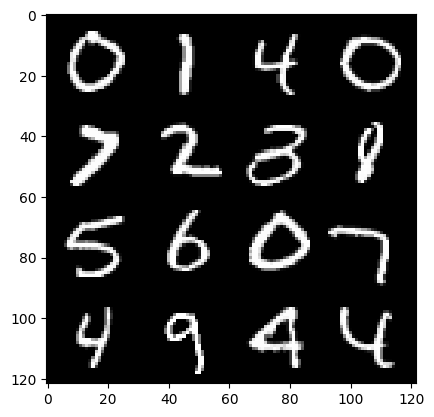

 39%|███████████████████▌                              | 183/469 [00:04<00:09, 30.74it/s]

38: step 18000 / gen loss: 5.720119118690499 / disc_loss 0.02457537833135575


  1%|▋                                                   | 6/469 [00:00<00:09, 50.28it/s]

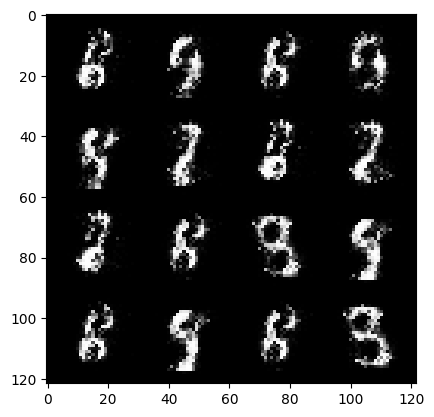

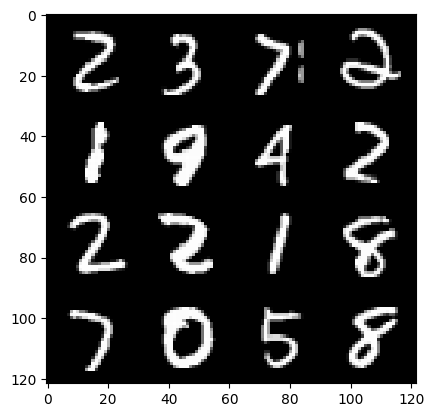

  4%|█▊                                                 | 17/469 [00:00<00:14, 31.65it/s]

39: step 18300 / gen loss: 6.024679875373844 / disc_loss 0.02363039042645444


 65%|████████████████████████████████▋                 | 307/469 [00:06<00:03, 45.29it/s]

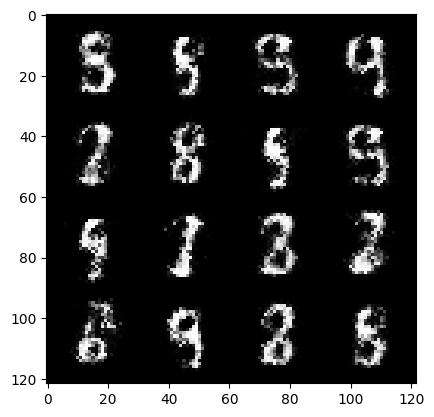

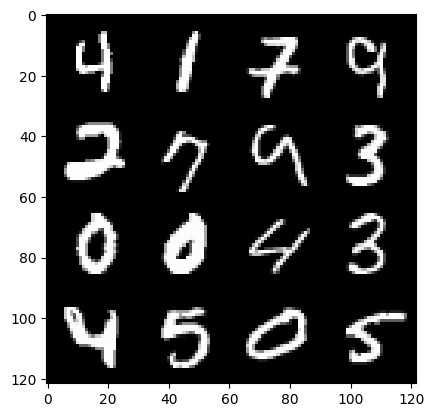

 68%|█████████████████████████████████▊                | 317/469 [00:07<00:04, 30.85it/s]

39: step 18600 / gen loss: 5.904858875274662 / disc_loss 0.027872578779545923


 30%|██████████████▉                                   | 140/469 [00:02<00:06, 47.24it/s]

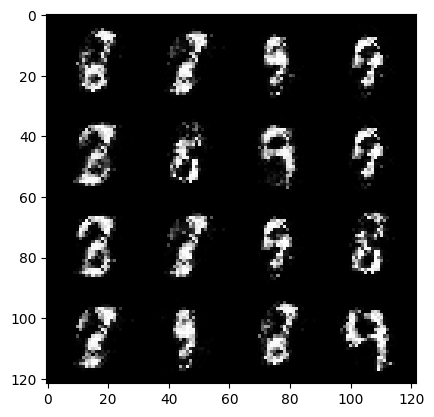

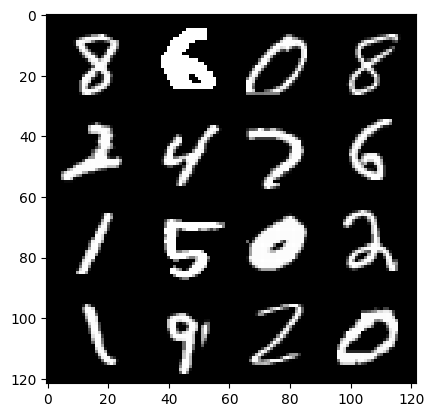

 31%|███████████████▍                                  | 145/469 [00:03<00:10, 30.67it/s]

40: step 18900 / gen loss: 5.694041751225787 / disc_loss 0.03176365880295634


 94%|██████████████████████████████████████████████▉   | 440/469 [00:09<00:00, 45.13it/s]

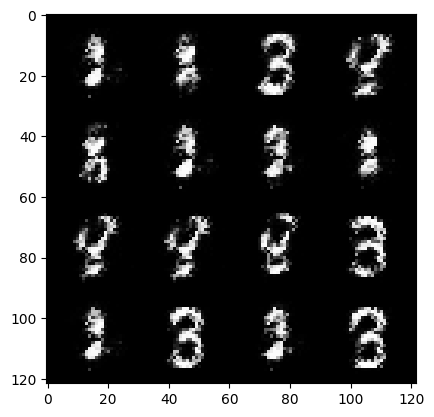

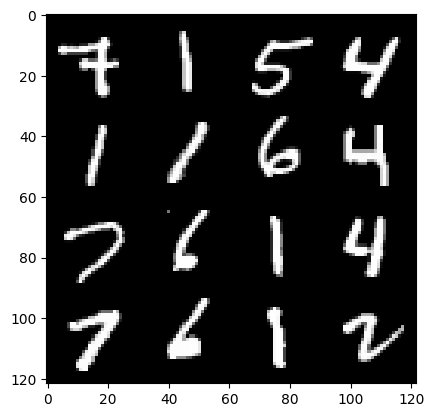

 95%|███████████████████████████████████████████████▍  | 445/469 [00:09<00:00, 29.32it/s]

40: step 19200 / gen loss: 5.582191303571063 / disc_loss 0.04062655586438874


 58%|████████████████████████████▊                     | 270/469 [00:05<00:04, 48.09it/s]

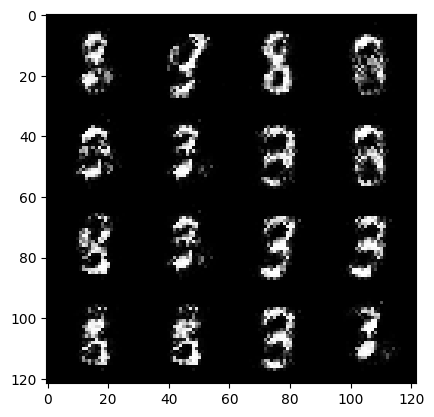

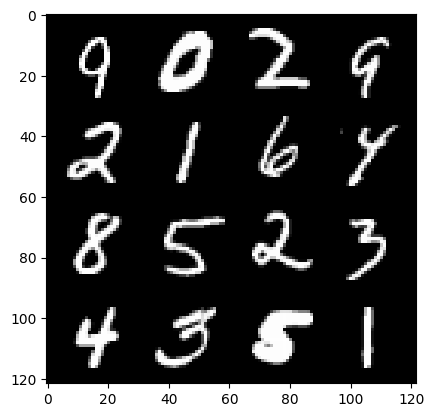

 59%|█████████████████████████████▎                    | 275/469 [00:06<00:07, 25.10it/s]

41: step 19500 / gen loss: 5.445469412803651 / disc_loss 0.03616743651684374


 22%|██████████▊                                       | 101/469 [00:02<00:07, 49.02it/s]

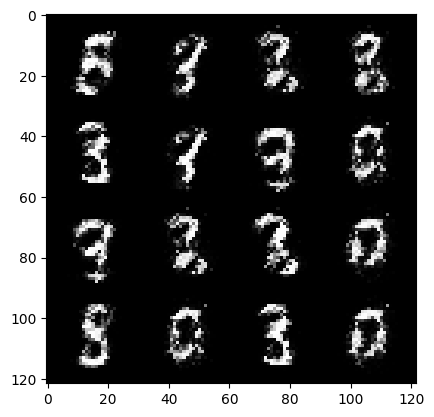

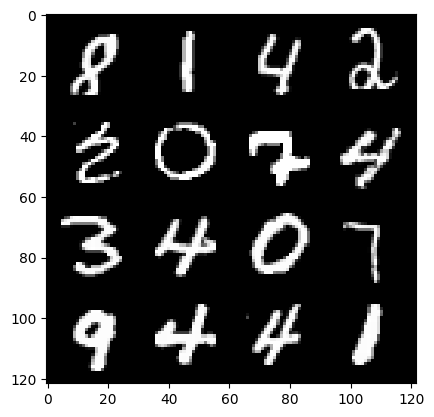

 24%|███████████▉                                      | 112/469 [00:02<00:09, 37.35it/s]

42: step 19800 / gen loss: 5.940450065930683 / disc_loss 0.03805943600678194


 85%|██████████████████████████████████████████▌       | 399/469 [00:08<00:01, 48.79it/s]

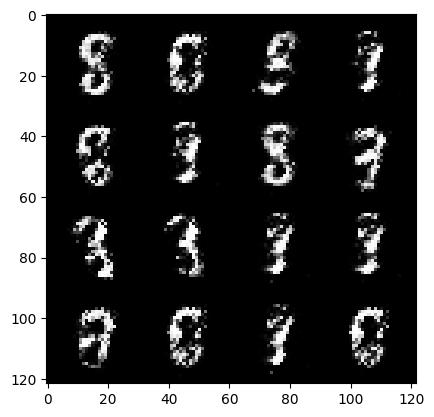

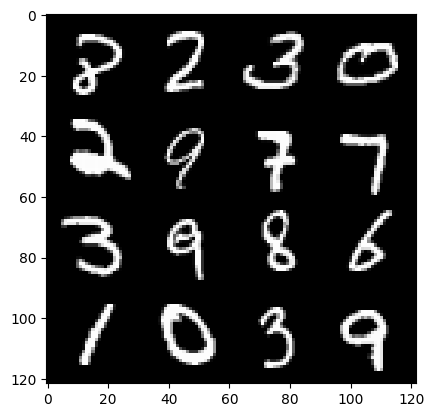

 87%|███████████████████████████████████████████▌      | 409/469 [00:08<00:01, 35.00it/s]

42: step 20100 / gen loss: 5.593154691855111 / disc_loss 0.04035049053685121


 49%|████████████████████████▋                         | 231/469 [00:04<00:04, 49.96it/s]

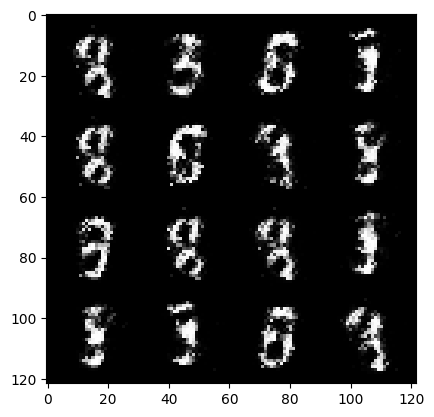

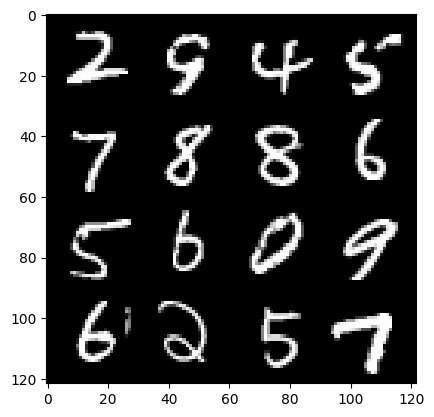

 52%|█████████████████████████▊                        | 242/469 [00:05<00:06, 37.65it/s]

43: step 20400 / gen loss: 5.798770354588824 / disc_loss 0.033062556493096064


 13%|██████▌                                            | 60/469 [00:01<00:08, 45.65it/s]

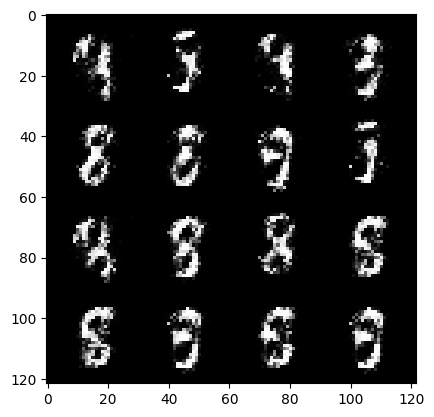

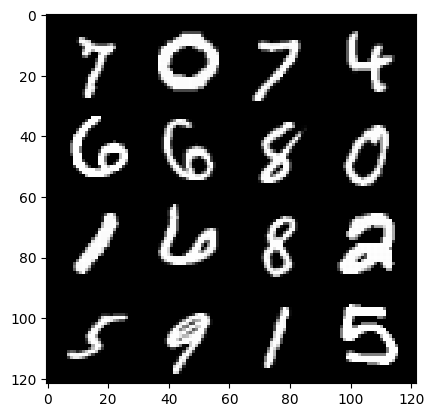

 15%|███████▌                                           | 70/469 [00:01<00:11, 33.96it/s]

44: step 20700 / gen loss: 5.776786985397339 / disc_loss 0.03009697014155487


 77%|██████████████████████████████████████▋           | 363/469 [00:07<00:02, 47.81it/s]

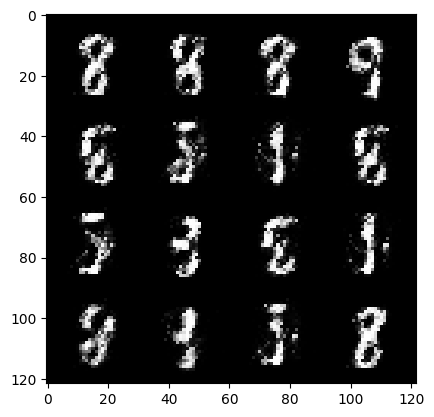

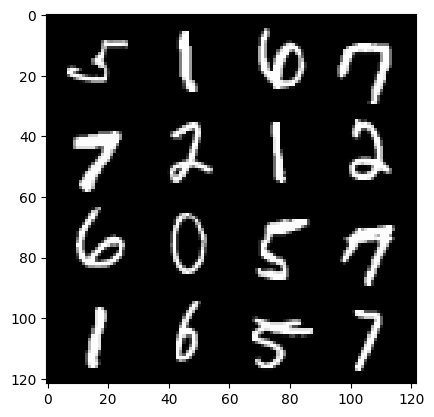

 80%|███████████████████████████████████████▊          | 373/469 [00:08<00:02, 35.06it/s]

44: step 21000 / gen loss: 5.661857635180154 / disc_loss 0.03622692219524955


 42%|████████████████████▊                             | 195/469 [00:04<00:05, 46.08it/s]

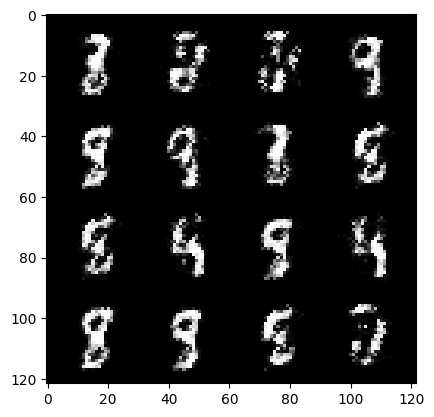

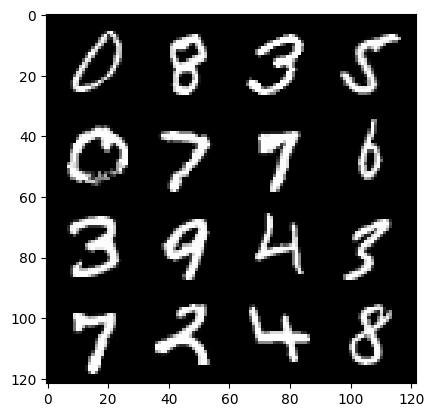

 43%|█████████████████████▎                            | 200/469 [00:04<00:08, 31.13it/s]

45: step 21300 / gen loss: 5.515089440345762 / disc_loss 0.04147046291269363


  5%|██▌                                                | 23/469 [00:00<00:08, 49.60it/s]

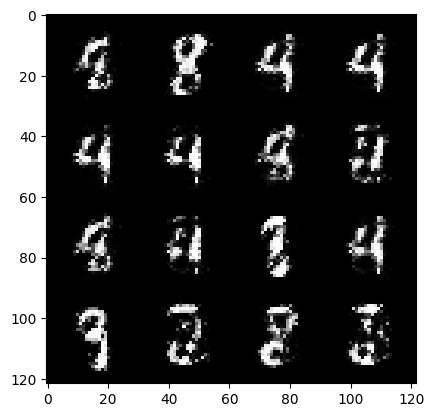

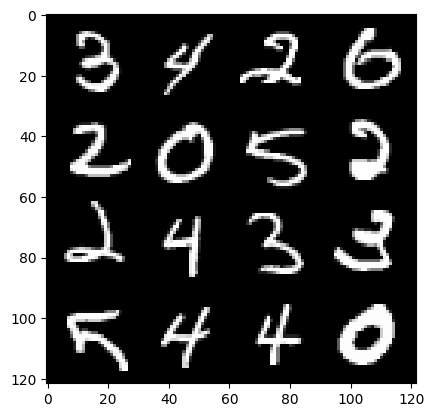

  7%|███▌                                               | 33/469 [00:00<00:12, 35.04it/s]

46: step 21600 / gen loss: 5.448045414288841 / disc_loss 0.04799258139760541


 69%|██████████████████████████████████▋               | 325/469 [00:07<00:03, 45.46it/s]

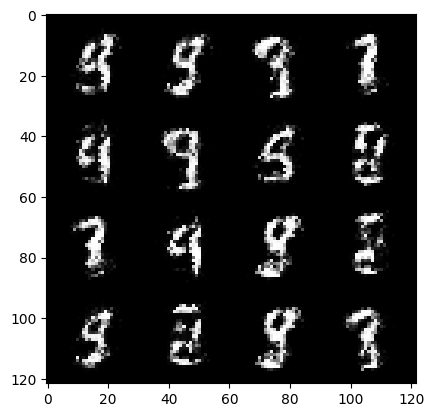

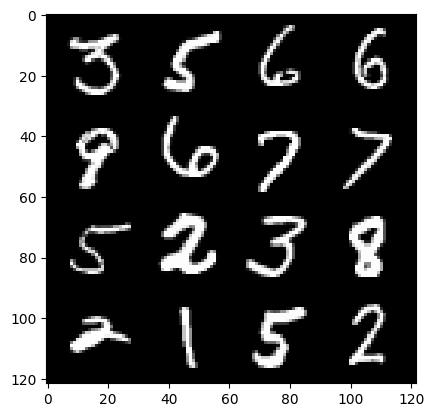

 71%|███████████████████████████████████▋              | 335/469 [00:07<00:03, 34.55it/s]

46: step 21900 / gen loss: 5.681923718452455 / disc_loss 0.03878960649482904


 33%|████████████████▍                                 | 154/469 [00:03<00:06, 48.18it/s]

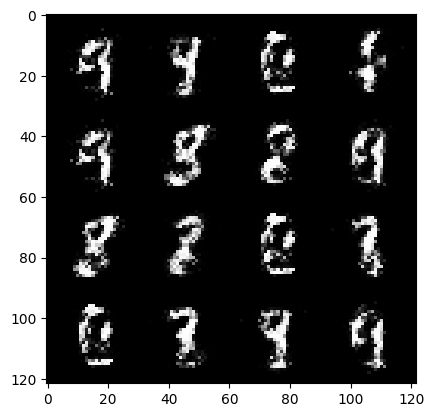

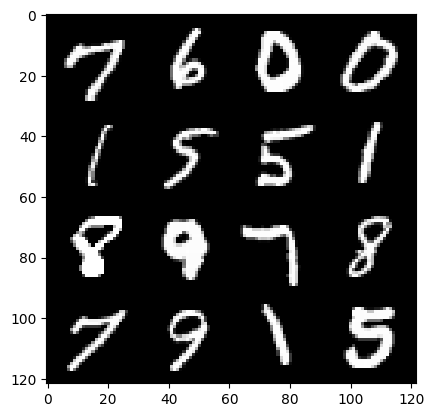

 35%|█████████████████▍                                | 164/469 [00:03<00:08, 34.79it/s]

47: step 22200 / gen loss: 5.4123759865760785 / disc_loss 0.04326938548435766


 97%|████████████████████████████████████████████████▌ | 455/469 [00:09<00:00, 50.29it/s]

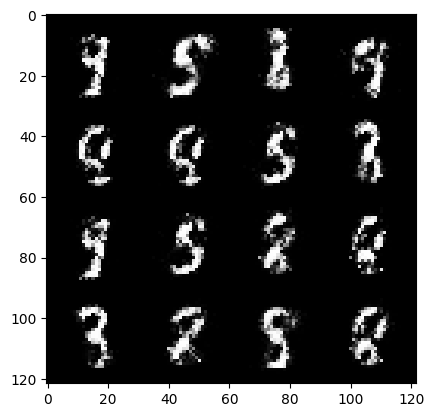

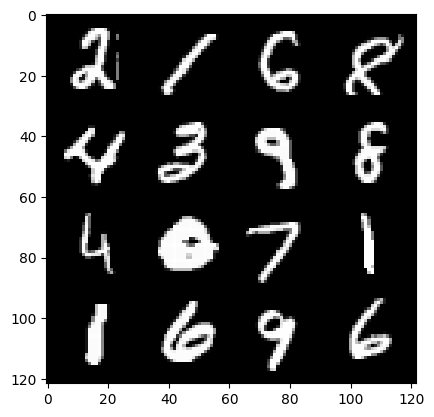

 99%|█████████████████████████████████████████████████▋| 466/469 [00:10<00:00, 36.25it/s]

47: step 22500 / gen loss: 5.615944417317703 / disc_loss 0.040024525552677596


 61%|██████████████████████████████▌                   | 287/469 [00:05<00:03, 46.88it/s]

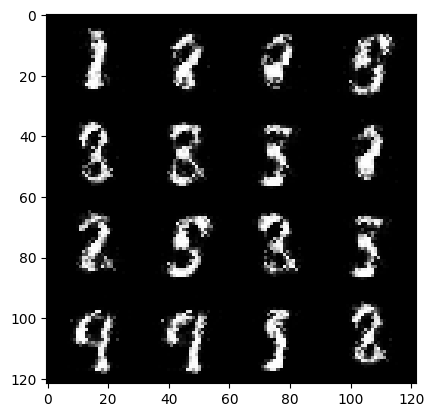

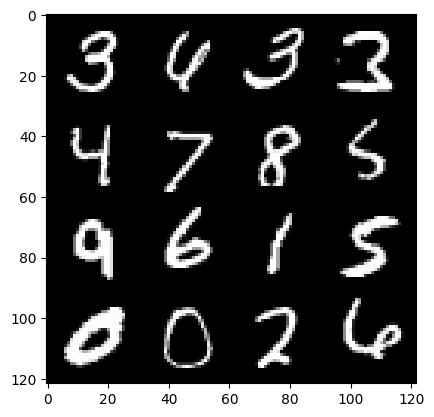

 63%|███████████████████████████████▋                  | 297/469 [00:06<00:05, 32.85it/s]

48: step 22800 / gen loss: 5.411359961827591 / disc_loss 0.043788972981274134


 25%|████████████▍                                     | 117/469 [00:02<00:07, 47.35it/s]

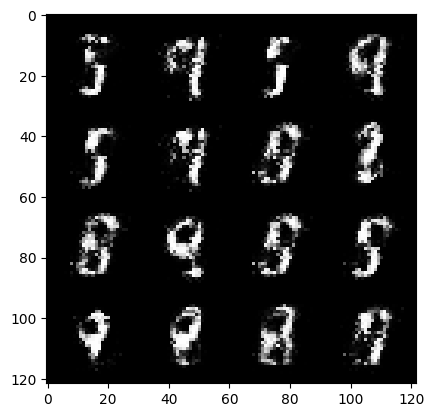

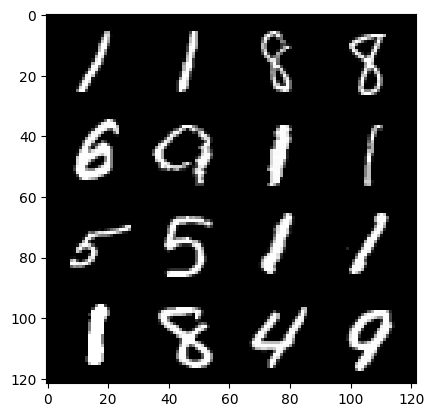

 27%|█████████████▌                                    | 127/469 [00:02<00:10, 32.62it/s]

49: step 23100 / gen loss: 5.158072354793547 / disc_loss 0.045236373866597845


 89%|████████████████████████████████████████████▌     | 418/469 [00:09<00:01, 37.70it/s]

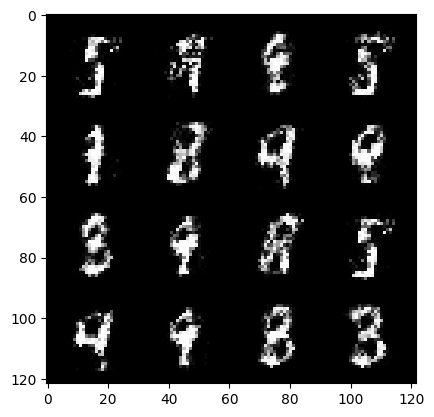

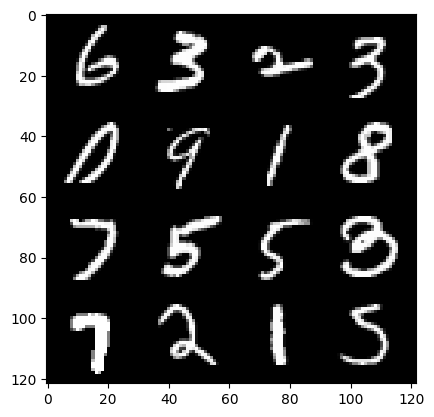

 91%|█████████████████████████████████████████████▌    | 427/469 [00:09<00:01, 27.97it/s]

49: step 23400 / gen loss: 5.0626492500305185 / disc_loss 0.04676353039219977


 52%|██████████████████████████▏                       | 246/469 [00:05<00:04, 48.42it/s]

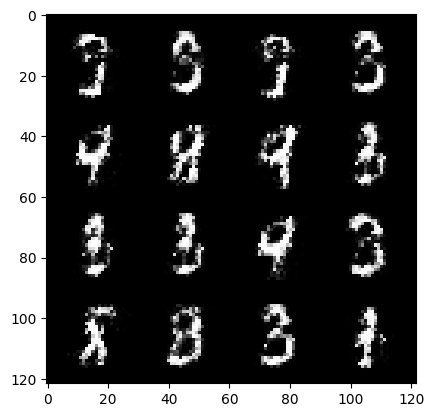

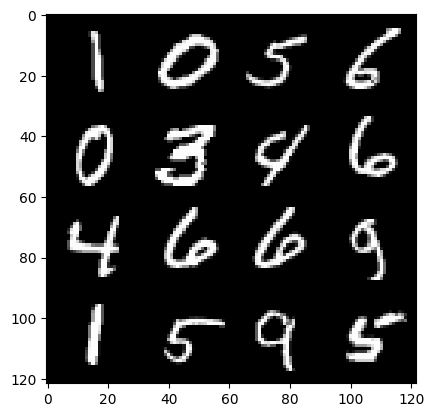

 55%|███████████████████████████▎                      | 256/469 [00:05<00:06, 34.38it/s]

50: step 23700 / gen loss: 5.428265361785888 / disc_loss 0.04143007813797643


 17%|████████▋                                          | 80/469 [00:01<00:08, 45.40it/s]

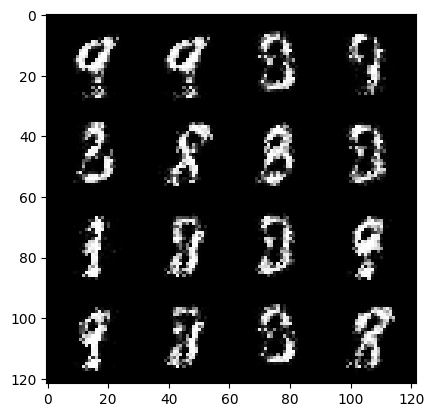

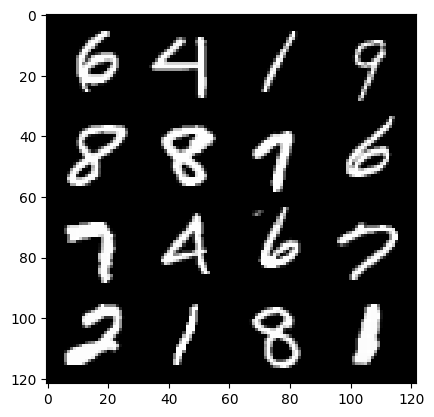

 18%|█████████▏                                         | 85/469 [00:02<00:13, 28.59it/s]

51: step 24000 / gen loss: 5.159377787113194 / disc_loss 0.053278331942856326


 80%|████████████████████████████████████████▏         | 377/469 [00:08<00:01, 46.59it/s]

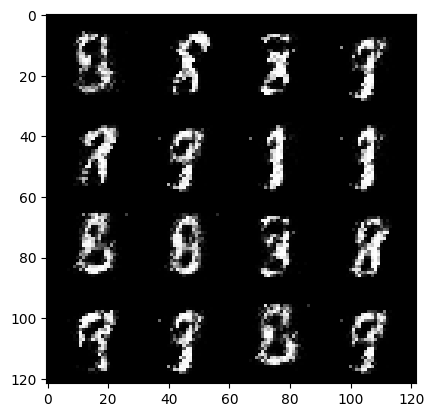

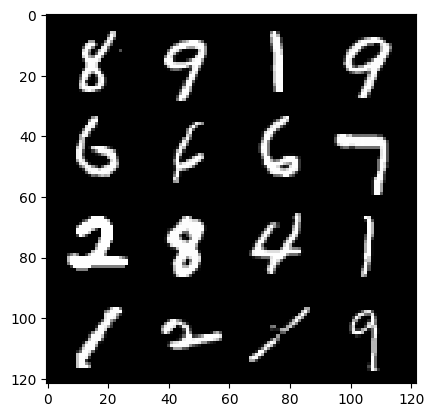

 83%|█████████████████████████████████████████▎        | 387/469 [00:08<00:02, 31.94it/s]

51: step 24300 / gen loss: 5.329027241071066 / disc_loss 0.04194808268298706


 45%|██████████████████████▍                           | 210/469 [00:04<00:06, 41.53it/s]

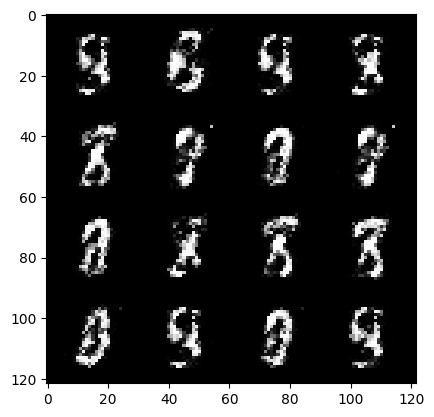

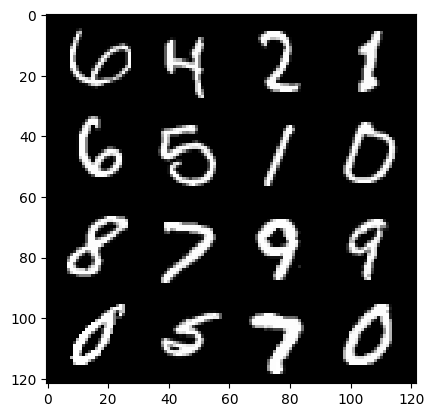

 47%|███████████████████████▍                          | 220/469 [00:05<00:08, 28.62it/s]

52: step 24600 / gen loss: 5.530566725730894 / disc_loss 0.04661770691629499


  9%|████▎                                              | 40/469 [00:00<00:09, 45.38it/s]

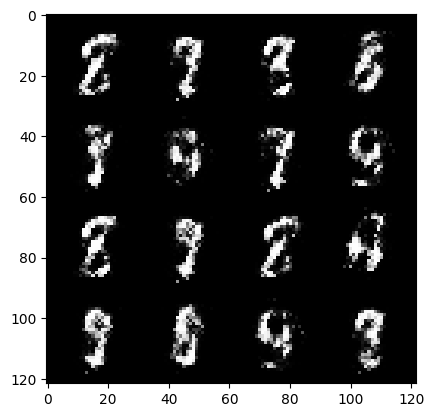

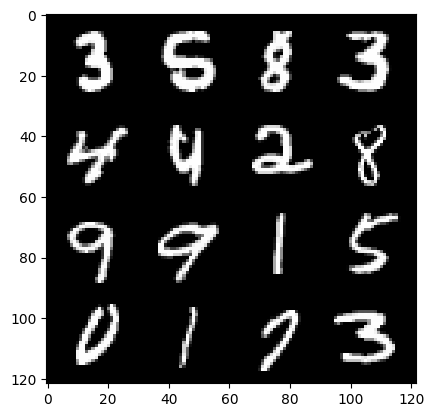

 11%|█████▍                                             | 50/469 [00:01<00:15, 26.63it/s]

53: step 24900 / gen loss: 5.1700612338384 / disc_loss 0.04943766629012928


 72%|████████████████████████████████████▏             | 340/469 [00:07<00:02, 46.69it/s]

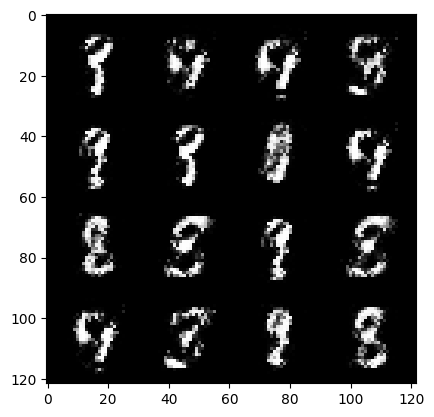

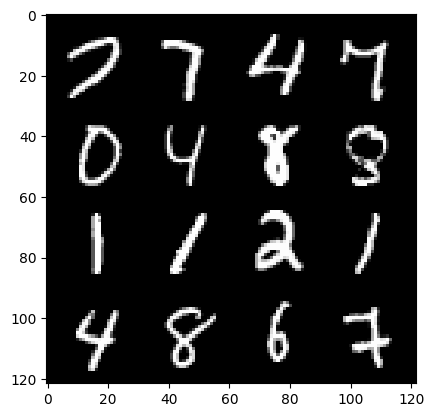

 75%|█████████████████████████████████████▎            | 350/469 [00:08<00:03, 33.77it/s]

53: step 25200 / gen loss: 5.407035025755564 / disc_loss 0.06381414152681826


 36%|██████████████████                                | 170/469 [00:03<00:05, 50.25it/s]

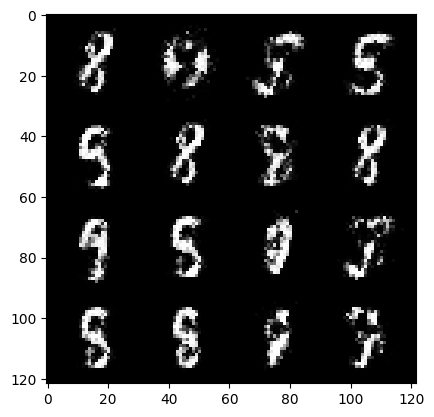

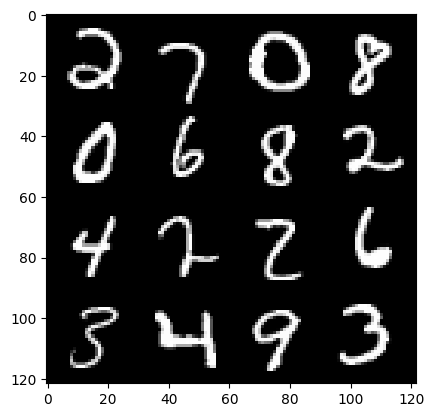

 39%|███████████████████▍                              | 182/469 [00:03<00:07, 38.09it/s]

54: step 25500 / gen loss: 5.428037937482203 / disc_loss 0.05579795559868213


  0%|                                                            | 0/469 [00:00<?, ?it/s]

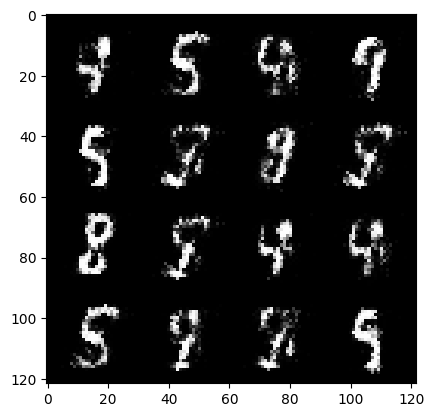

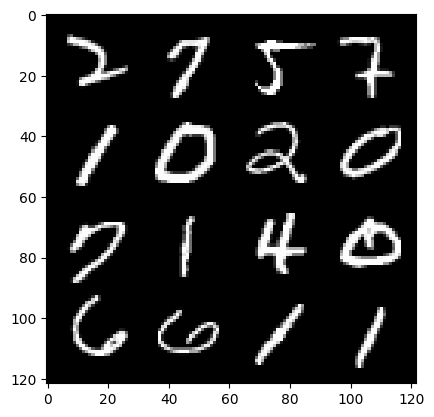

  3%|█▎                                                 | 12/469 [00:00<00:14, 30.93it/s]

55: step 25800 / gen loss: 5.149425808588658 / disc_loss 0.05939415214583284


 65%|████████████████████████████████▎                 | 303/469 [00:06<00:03, 48.66it/s]

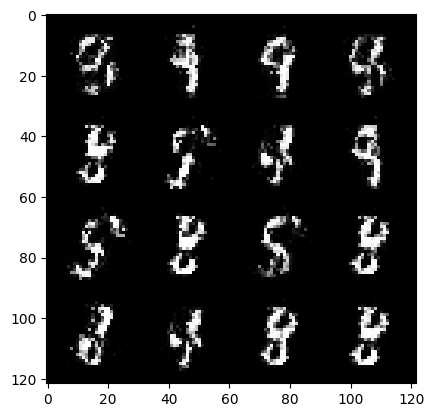

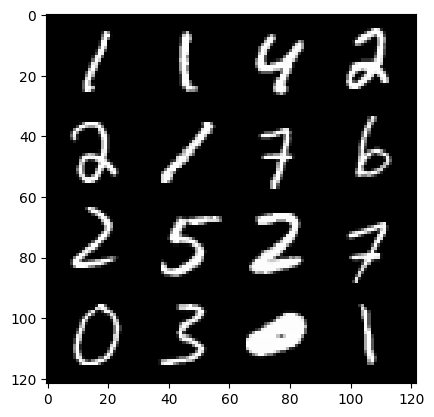

 67%|█████████████████████████████████▍                | 314/469 [00:06<00:04, 37.59it/s]

55: step 26100 / gen loss: 4.98142772038778 / disc_loss 0.05186819447825353


 29%|██████████████▎                                   | 134/469 [00:02<00:06, 49.24it/s]

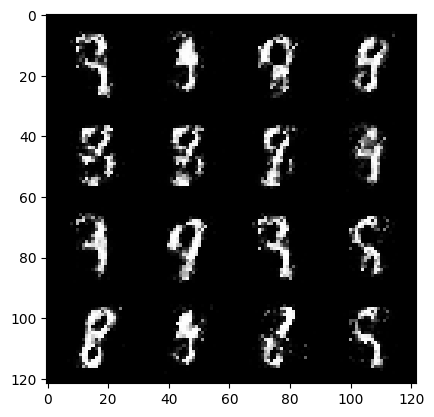

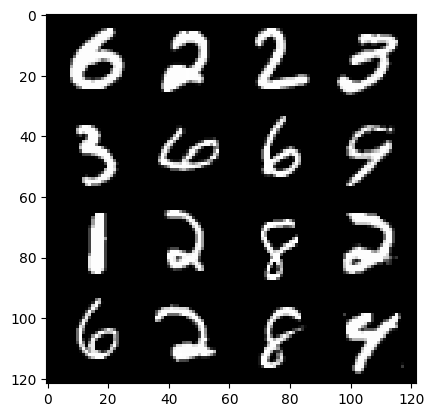

 31%|███████████████▎                                  | 144/469 [00:03<00:09, 35.55it/s]

56: step 26400 / gen loss: 5.309400534629821 / disc_loss 0.044294821924219525


 93%|██████████████████████████████████████████████▍   | 435/469 [00:09<00:00, 49.29it/s]

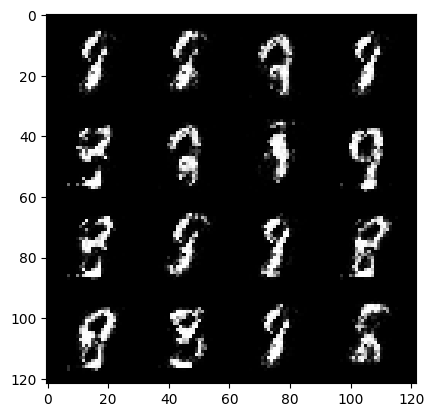

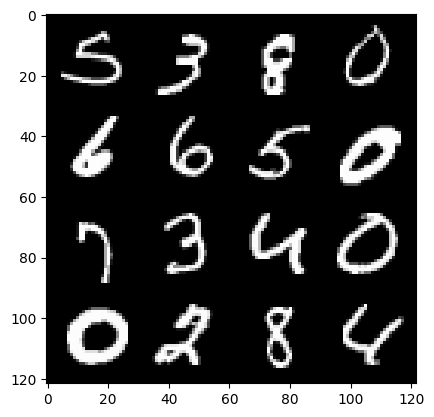

 95%|███████████████████████████████████████████████▌  | 446/469 [00:09<00:00, 37.07it/s]

56: step 26700 / gen loss: 5.078357137044271 / disc_loss 0.055631376278276246


 56%|████████████████████████████▏                     | 264/469 [00:05<00:04, 46.51it/s]

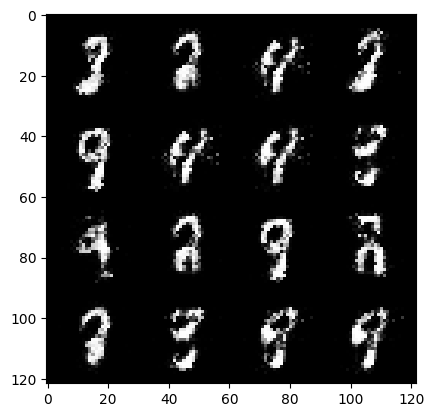

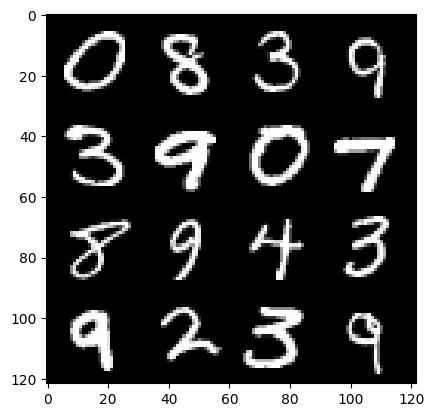

 58%|█████████████████████████████▏                    | 274/469 [00:06<00:05, 34.05it/s]

57: step 27000 / gen loss: 5.017207252184551 / disc_loss 0.057444042128821246


 21%|██████████▌                                        | 97/469 [00:02<00:08, 46.49it/s]

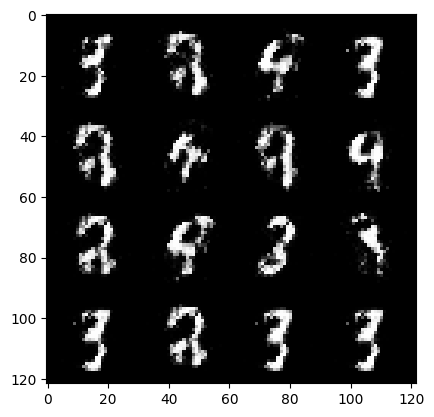

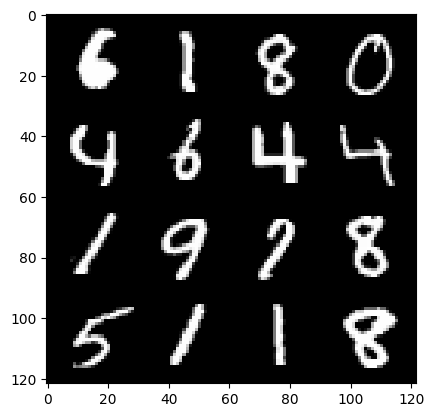

 22%|██████████▊                                       | 102/469 [00:02<00:11, 30.62it/s]

58: step 27300 / gen loss: 4.70351428190867 / disc_loss 0.06641264528036118


 85%|██████████████████████████████████████████▎       | 397/469 [00:08<00:01, 45.85it/s]

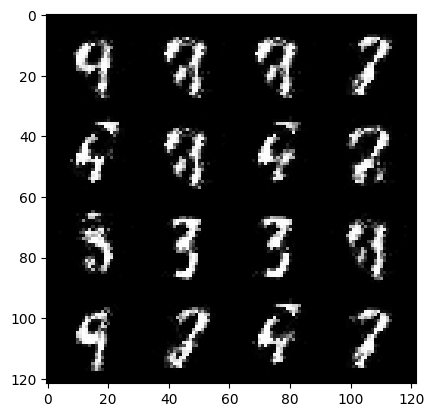

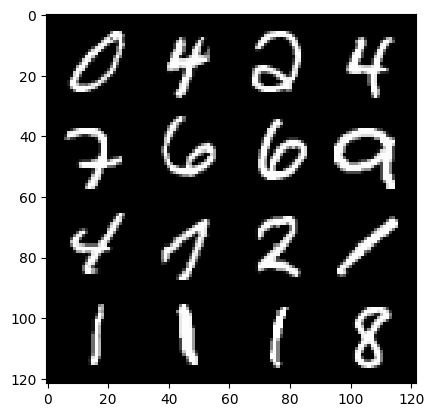

 87%|███████████████████████████████████████████▍      | 407/469 [00:09<00:01, 34.23it/s]

58: step 27600 / gen loss: 4.6761001364390085 / disc_loss 0.06416425756178801


 48%|████████████████████████▏                         | 227/469 [00:04<00:05, 44.95it/s]

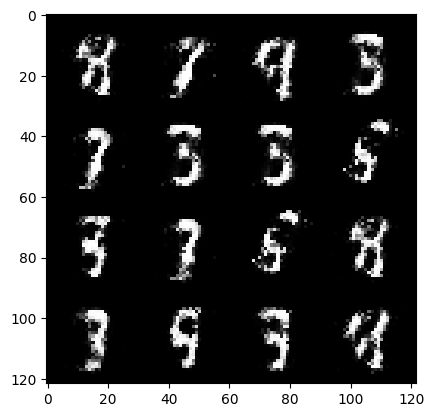

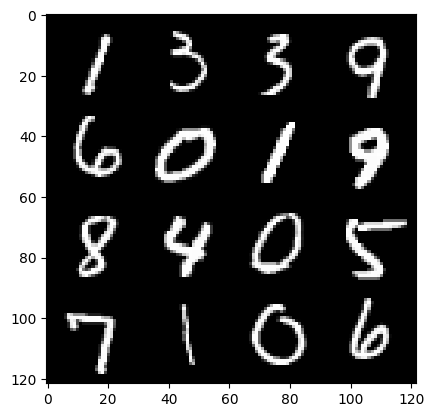

 51%|█████████████████████████▎                        | 237/469 [00:05<00:07, 33.05it/s]

59: step 27900 / gen loss: 5.082846287091572 / disc_loss 0.04714522914960983


 13%|██████▍                                            | 59/469 [00:01<00:08, 49.36it/s]

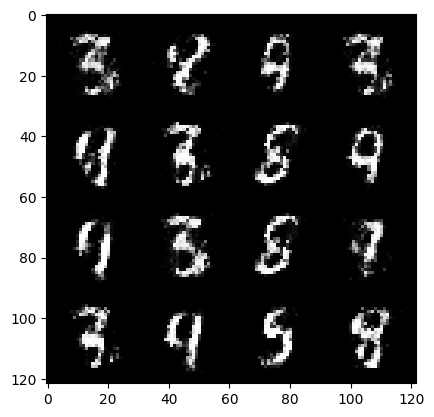

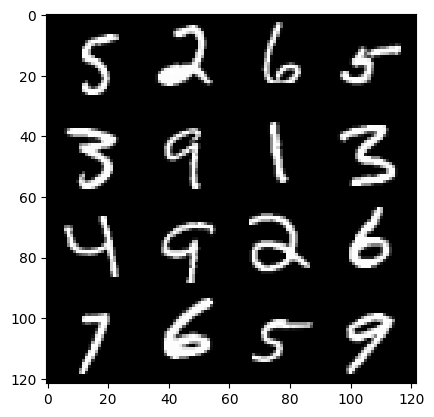

 15%|███████▌                                           | 69/469 [00:01<00:11, 34.53it/s]

60: step 28200 / gen loss: 5.0088006631533295 / disc_loss 0.05989193650583421


 77%|██████████████████████████████████████▍           | 360/469 [00:07<00:02, 46.84it/s]

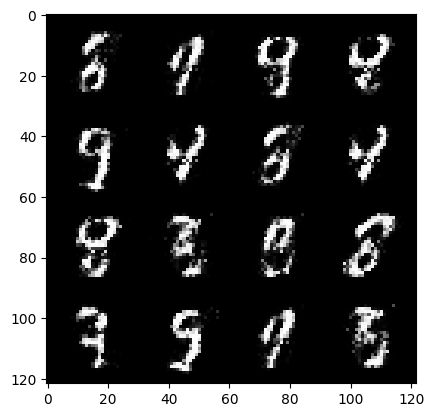

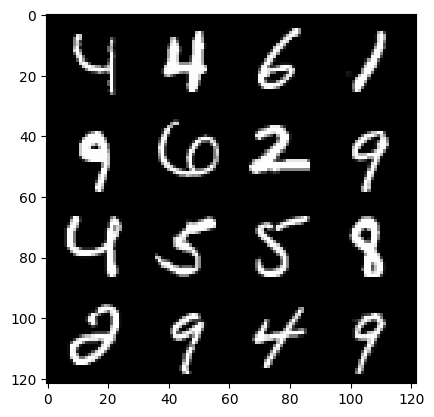

 78%|██████████████████████████████████████▉           | 365/469 [00:07<00:03, 31.70it/s]

60: step 28500 / gen loss: 4.430498130321506 / disc_loss 0.07928727947796387


 40%|████████████████████                              | 188/469 [00:03<00:05, 48.67it/s]

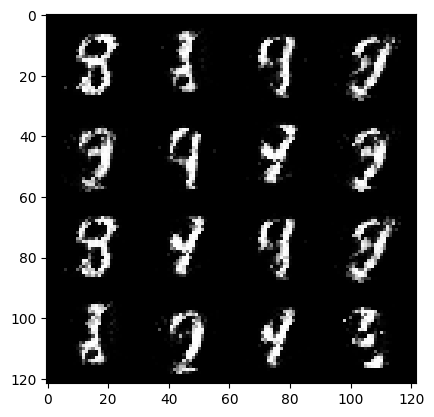

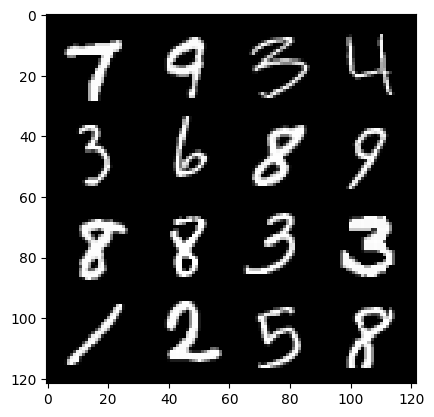

 42%|█████████████████████                             | 198/469 [00:04<00:07, 35.06it/s]

61: step 28800 / gen loss: 4.495820709864299 / disc_loss 0.07562685144133867


  4%|██▏                                                | 20/469 [00:00<00:10, 44.16it/s]

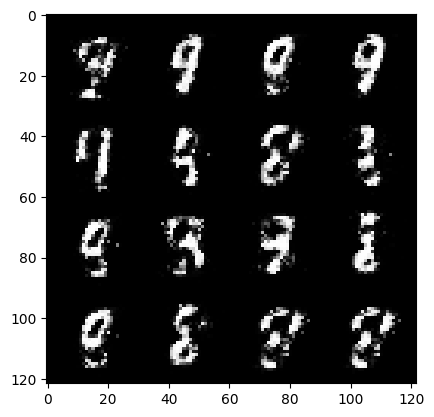

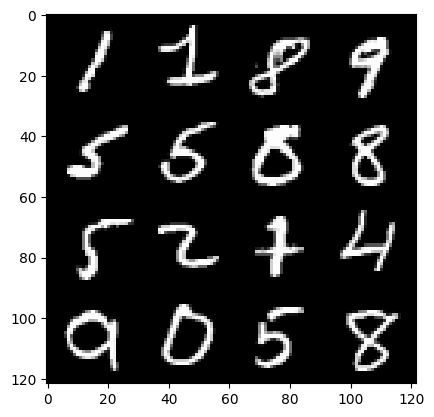

  6%|███▎                                               | 30/469 [00:00<00:14, 30.14it/s]

62: step 29100 / gen loss: 4.740483294328053 / disc_loss 0.06333990206631519


 69%|██████████████████████████████████▎               | 322/469 [00:07<00:03, 44.84it/s]

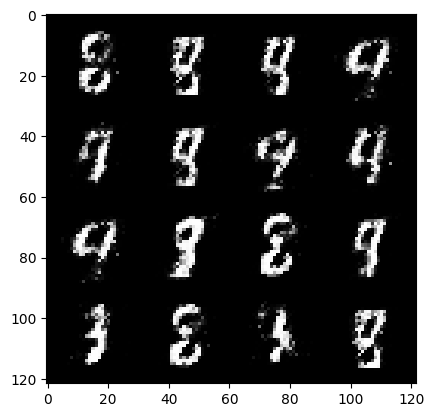

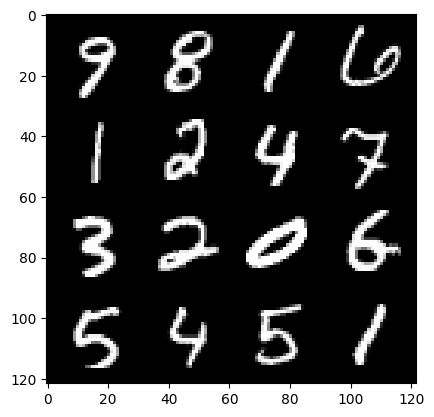

 70%|██████████████████████████████████▊               | 327/469 [00:07<00:04, 28.88it/s]

62: step 29400 / gen loss: 4.754346674283345 / disc_loss 0.061792362431685115


 32%|████████████████                                  | 151/469 [00:03<00:06, 47.59it/s]

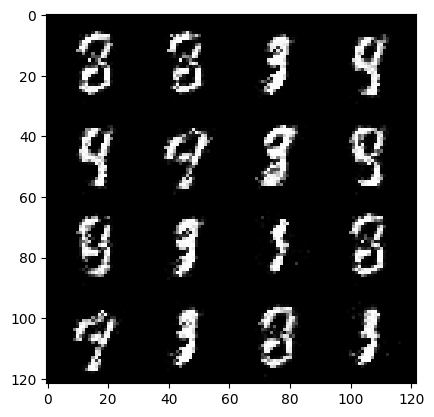

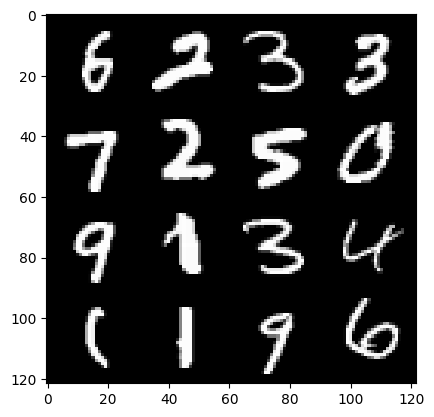

 34%|█████████████████▏                                | 161/469 [00:03<00:09, 33.88it/s]

63: step 29700 / gen loss: 4.461992218494412 / disc_loss 0.06364612527812524


 96%|████████████████████████████████████████████████▏ | 452/469 [00:09<00:00, 45.18it/s]

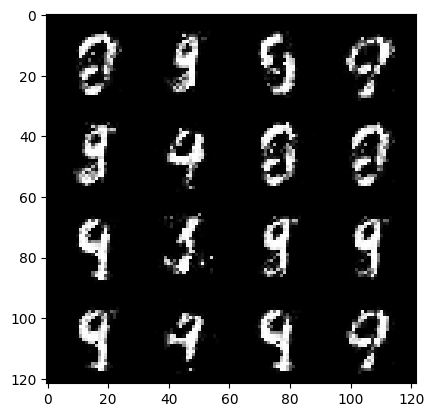

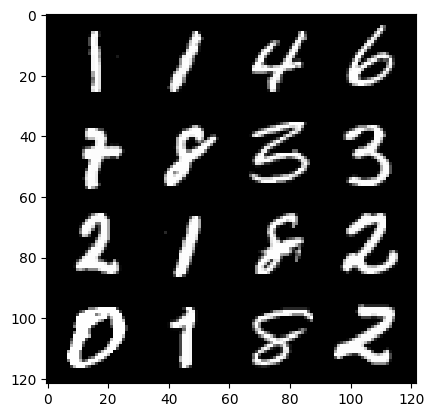

 97%|████████████████████████████████████████████████▋ | 457/469 [00:10<00:00, 22.11it/s]

63: step 30000 / gen loss: 4.931814757982891 / disc_loss 0.05045601307104032


 61%|██████████████████████████████▎                   | 284/469 [00:06<00:03, 47.76it/s]

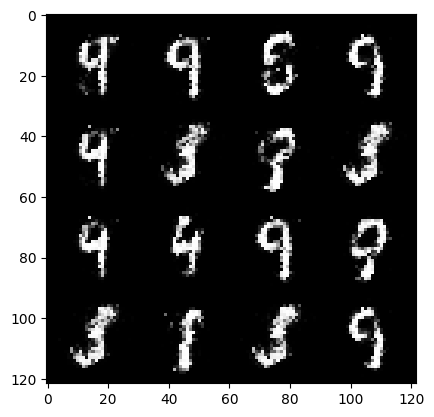

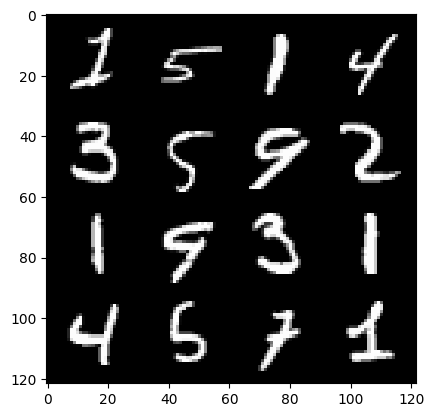

 62%|██████████████████████████████▊                   | 289/469 [00:06<00:06, 29.09it/s]

64: step 30300 / gen loss: 5.082295912106834 / disc_loss 0.047212756527587794


 25%|████████████▎                                     | 115/469 [00:02<00:07, 47.52it/s]

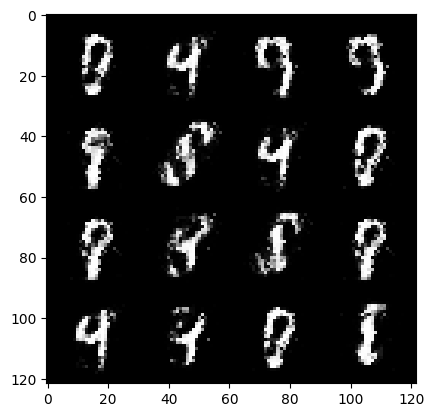

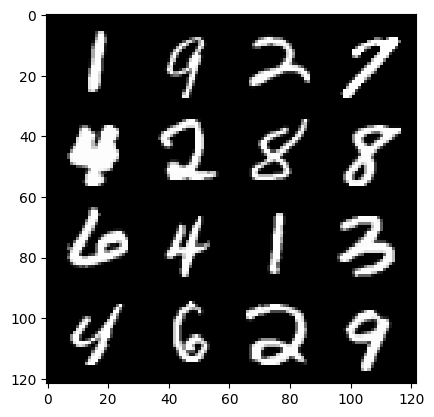

 27%|█████████████▎                                    | 125/469 [00:02<00:09, 35.22it/s]

65: step 30600 / gen loss: 4.949640922546386 / disc_loss 0.05780467762301364


 88%|████████████████████████████████████████████▏     | 414/469 [00:08<00:01, 49.25it/s]

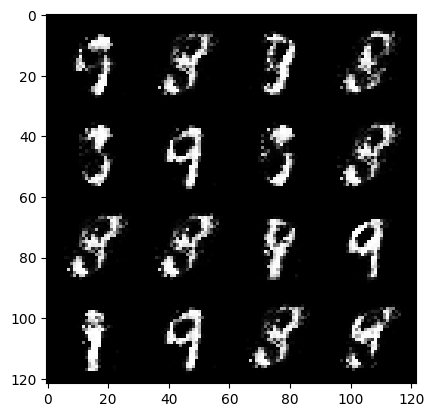

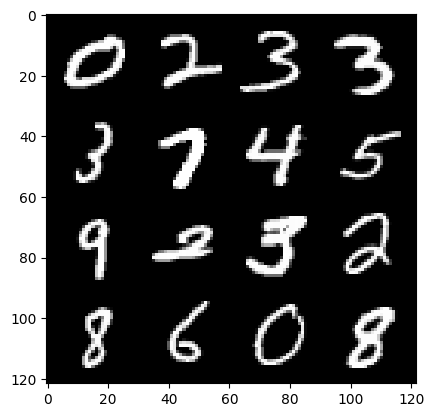

 90%|█████████████████████████████████████████████▏    | 424/469 [00:09<00:01, 35.79it/s]

65: step 30900 / gen loss: 5.055054219563807 / disc_loss 0.059469619259859136


 52%|██████████████████████████                        | 245/469 [00:05<00:04, 47.52it/s]

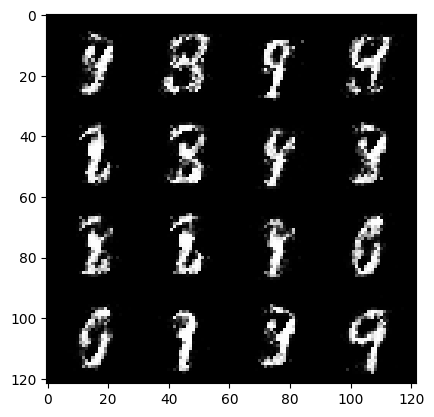

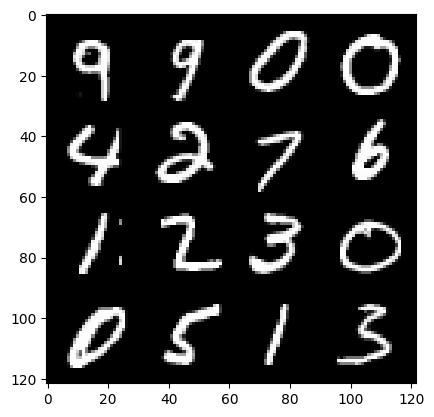

 54%|███████████████████████████▏                      | 255/469 [00:05<00:06, 34.07it/s]

66: step 31200 / gen loss: 4.720690686702732 / disc_loss 0.06455762101337316


 16%|████████▏                                          | 75/469 [00:01<00:08, 47.47it/s]

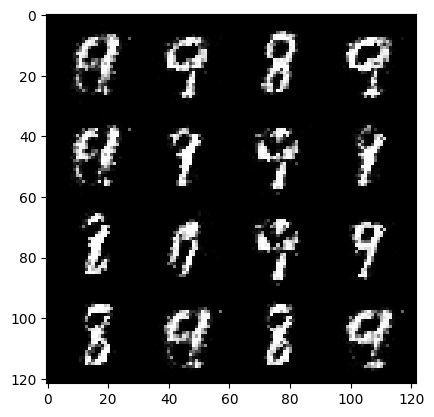

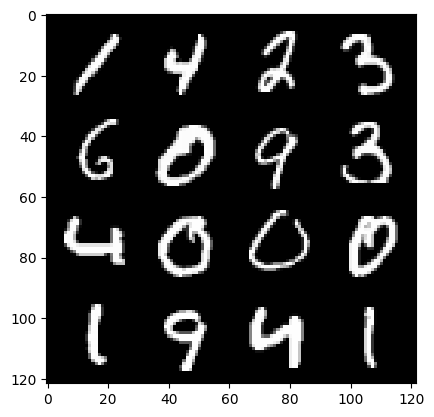

 18%|█████████▏                                         | 85/469 [00:01<00:10, 34.95it/s]

67: step 31500 / gen loss: 4.848866338729862 / disc_loss 0.0595769801766922


 80%|███████████████████████████████████████▊          | 373/469 [00:07<00:01, 51.05it/s]

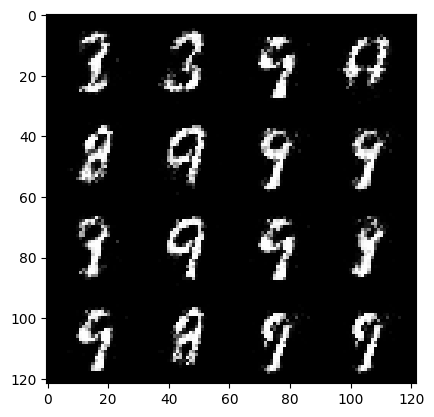

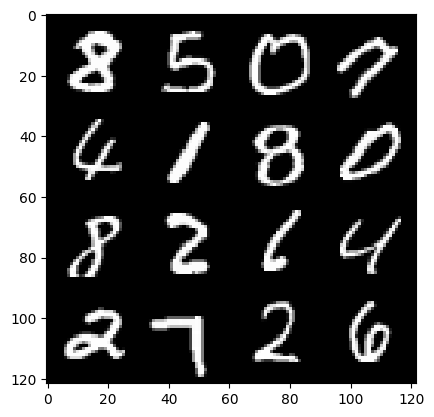

 82%|████████████████████████████████████████▉         | 384/469 [00:08<00:02, 36.15it/s]

67: step 31800 / gen loss: 4.596248551209768 / disc_loss 0.06891106440685689


 44%|█████████████████████▊                            | 205/469 [00:04<00:05, 46.11it/s]

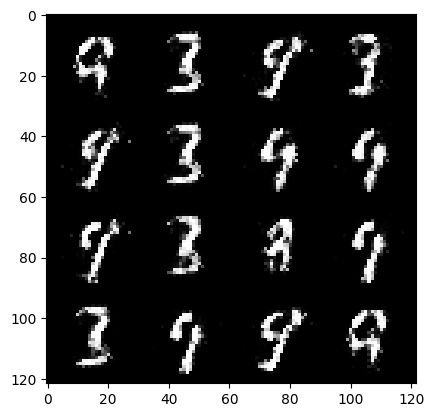

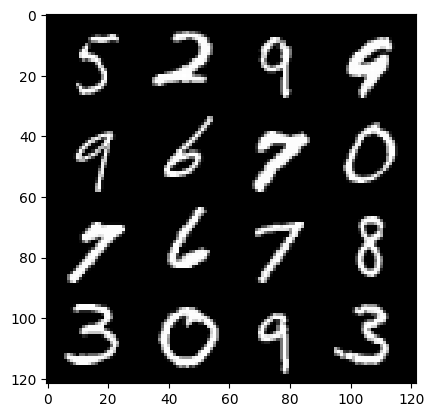

 46%|██████████████████████▉                           | 215/469 [00:04<00:07, 34.01it/s]

68: step 32100 / gen loss: 4.882876337369282 / disc_loss 0.05844692562396327


  7%|███▊                                               | 35/469 [00:00<00:09, 48.03it/s]

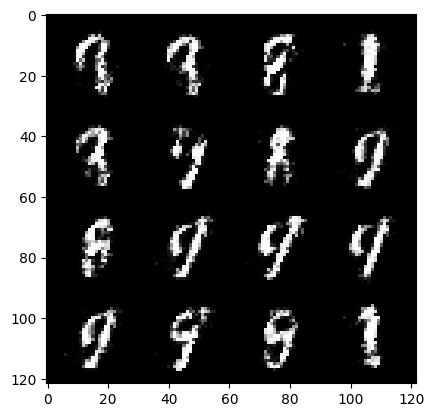

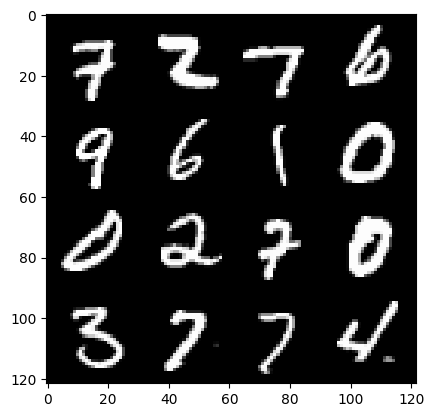

 10%|████▉                                              | 45/469 [00:01<00:12, 33.48it/s]

69: step 32400 / gen loss: 4.879297469456993 / disc_loss 0.07012884462873144


 72%|███████████████████████████████████▊              | 336/469 [00:07<00:02, 46.91it/s]

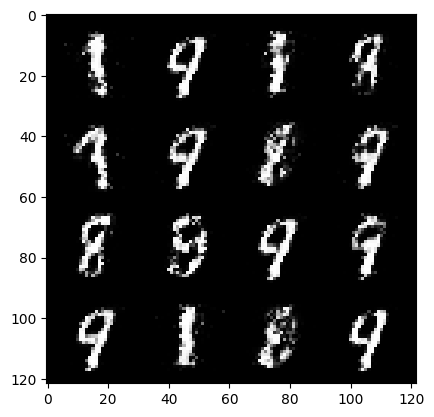

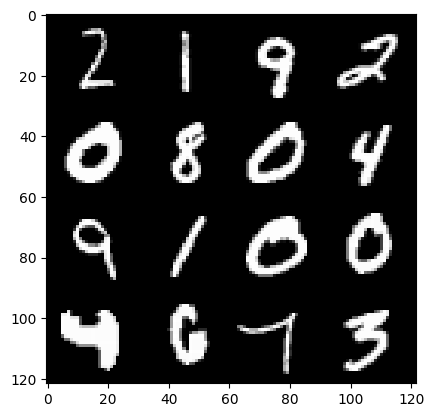

 74%|████████████████████████████████████▉             | 346/469 [00:07<00:03, 32.46it/s]

69: step 32700 / gen loss: 4.296777340571084 / disc_loss 0.08590877470249932


 36%|██████████████████                                | 170/469 [00:03<00:06, 47.57it/s]

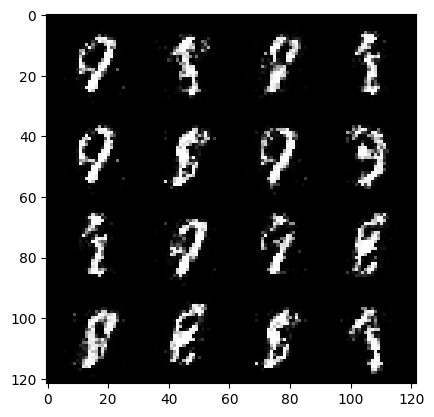

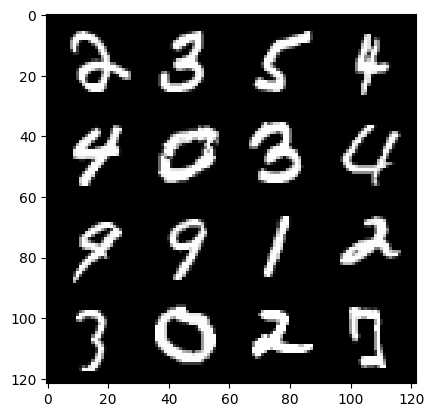

 37%|██████████████████▋                               | 175/469 [00:03<00:09, 30.57it/s]

70: step 33000 / gen loss: 4.7105783716837575 / disc_loss 0.07521688987190525


  0%|                                                            | 0/469 [00:00<?, ?it/s]

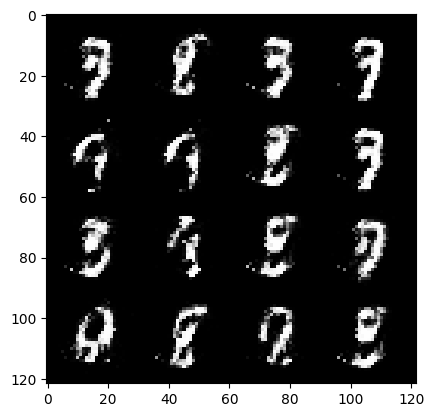

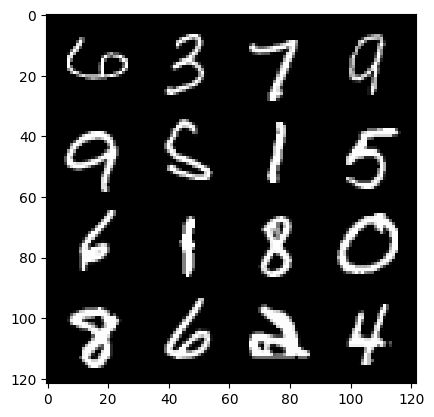

  1%|▊                                                   | 7/469 [00:00<00:20, 22.46it/s]

71: step 33300 / gen loss: 4.774550229708356 / disc_loss 0.07201033158227799


 64%|████████████████████████████████                  | 301/469 [00:06<00:03, 47.53it/s]

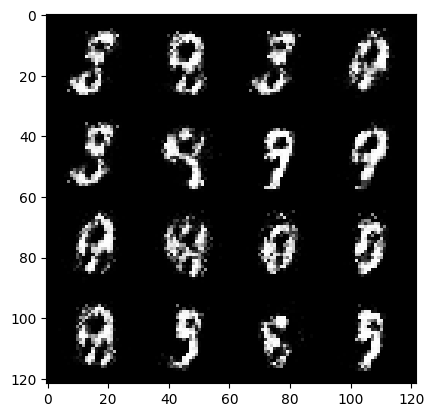

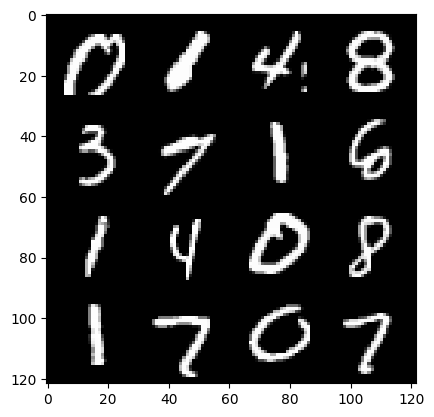

 65%|████████████████████████████████▌                 | 306/469 [00:06<00:05, 31.09it/s]

71: step 33600 / gen loss: 4.78177818059921 / disc_loss 0.07586109577367701


 28%|█████████████▉                                    | 131/469 [00:02<00:07, 46.99it/s]

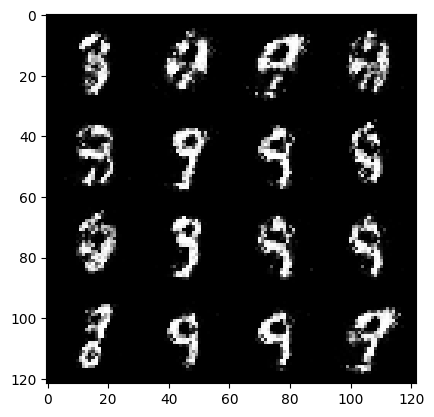

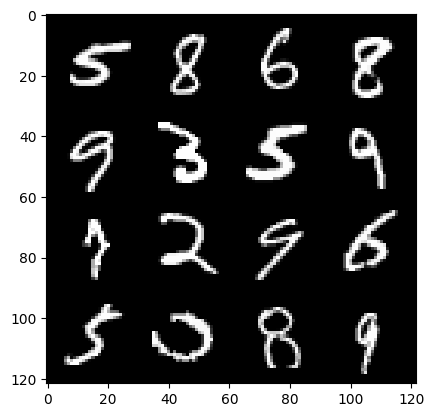

 30%|███████████████                                   | 141/469 [00:03<00:09, 35.20it/s]

72: step 33900 / gen loss: 4.627547476291656 / disc_loss 0.0771214888369044


 91%|█████████████████████████████████████████████▋    | 429/469 [00:09<00:00, 46.02it/s]

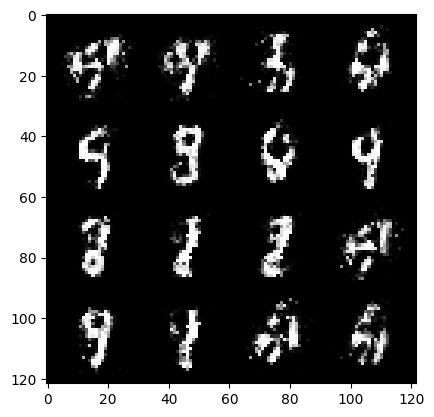

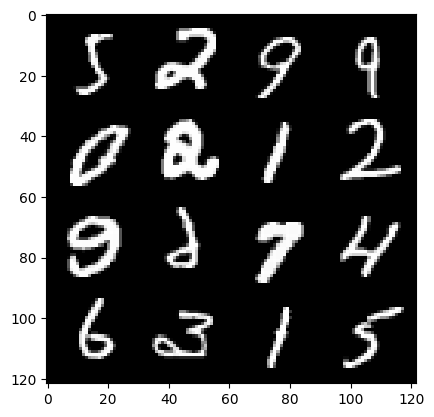

 94%|██████████████████████████████████████████████▊   | 439/469 [00:09<00:00, 33.80it/s]

72: step 34200 / gen loss: 4.922646674315135 / disc_loss 0.06622248696163296


 56%|████████████████████████████                      | 263/469 [00:05<00:04, 46.43it/s]

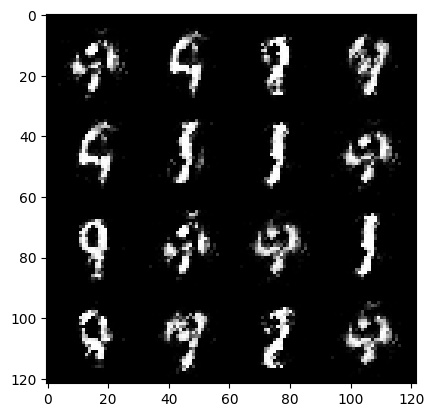

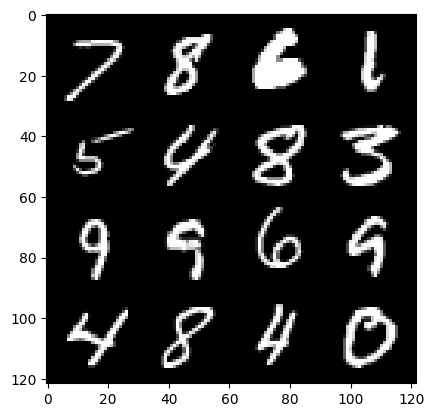

 57%|████████████████████████████▌                     | 268/469 [00:05<00:06, 29.16it/s]

73: step 34500 / gen loss: 4.619810168743136 / disc_loss 0.08415999205162121


 19%|█████████▉                                         | 91/469 [00:02<00:08, 43.27it/s]

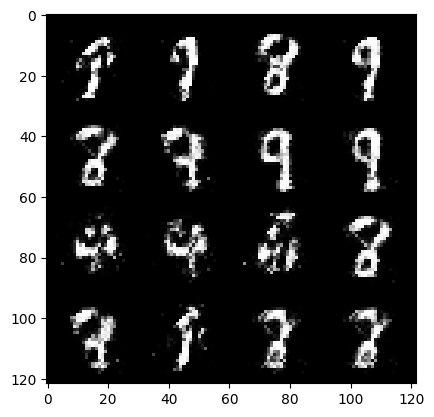

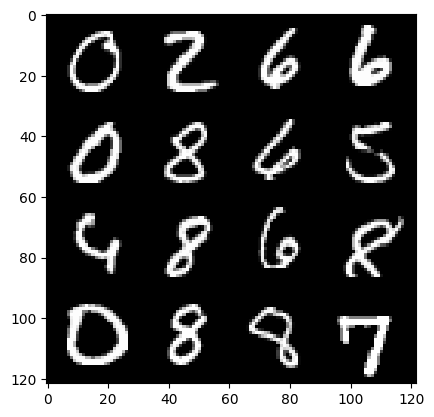

 21%|██████████▋                                       | 100/469 [00:02<00:12, 30.04it/s]

74: step 34800 / gen loss: 4.394703108469647 / disc_loss 0.08522734283159172


 83%|█████████████████████████████████████████▋        | 391/469 [00:08<00:01, 47.10it/s]

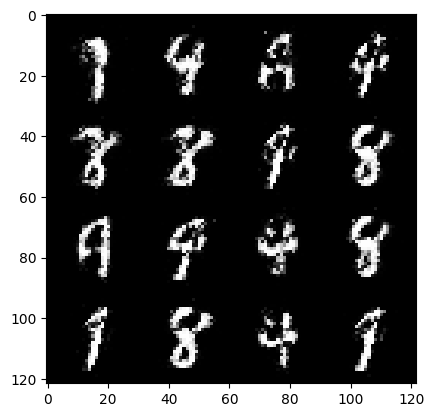

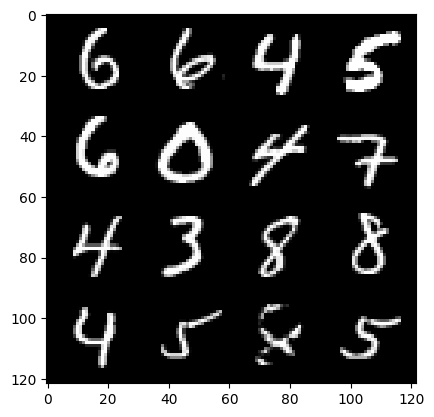

74: step 35100 / gen loss: 4.326571241219838 / disc_loss 0.0762612378845612


 48%|███████████████████████▉                          | 224/469 [00:04<00:04, 49.13it/s]

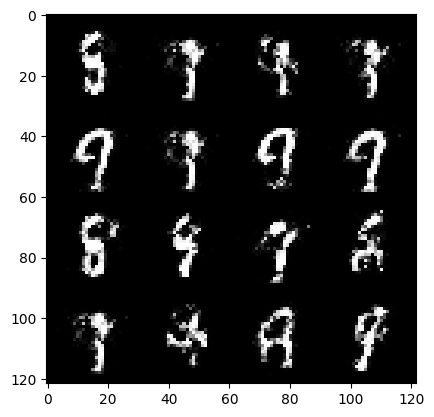

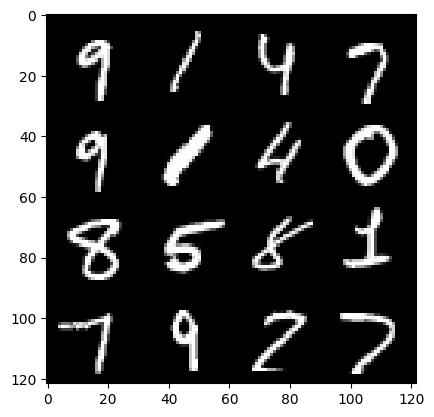

 50%|████████████████████████▉                         | 234/469 [00:05<00:06, 35.05it/s]

75: step 35400 / gen loss: 4.262797861893969 / disc_loss 0.08219721025476848


 12%|█████▊                                             | 54/469 [00:01<00:08, 46.26it/s]

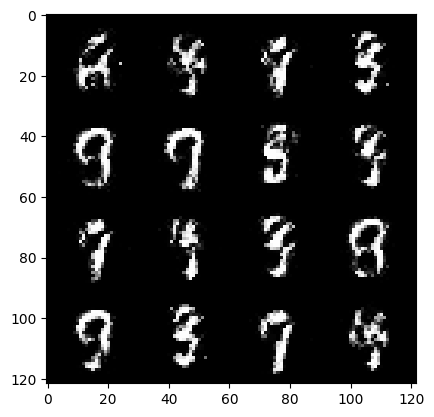

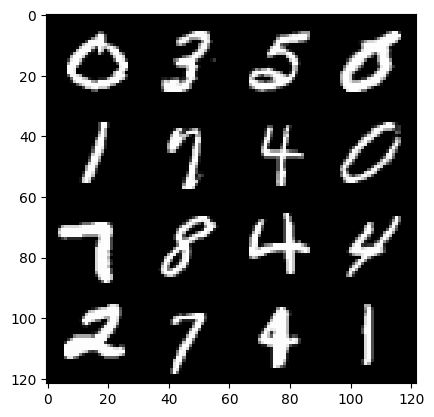

 14%|██████▉                                            | 64/469 [00:01<00:11, 34.54it/s]

76: step 35700 / gen loss: 4.322064288457235 / disc_loss 0.09108768254518507


 76%|█████████████████████████████████████▊            | 355/469 [00:07<00:02, 48.21it/s]

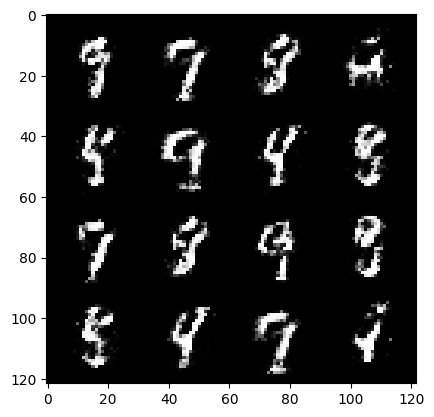

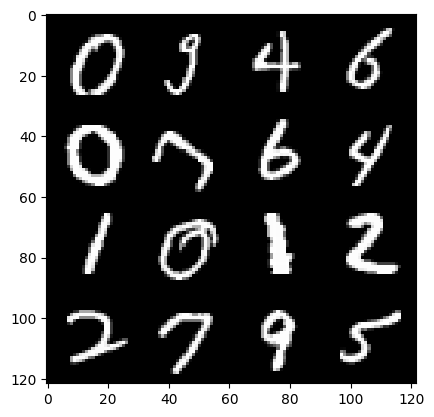

 78%|██████████████████████████████████████▉           | 365/469 [00:08<00:02, 34.98it/s]

76: step 36000 / gen loss: 4.344321120580035 / disc_loss 0.09289540421838564


 39%|███████████████████▌                              | 183/469 [00:03<00:06, 44.95it/s]

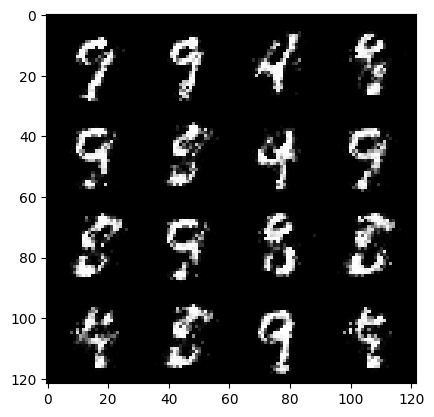

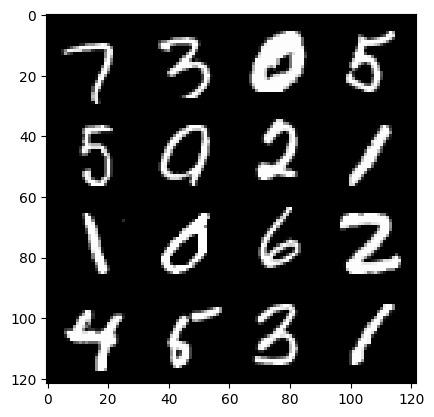

 41%|████████████████████▌                             | 193/469 [00:04<00:08, 30.80it/s]

77: step 36300 / gen loss: 3.8779376792907714 / disc_loss 0.10375380827734874


  3%|█▋                                                 | 15/469 [00:00<00:09, 45.69it/s]

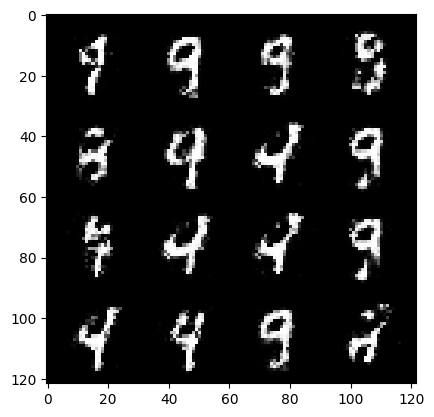

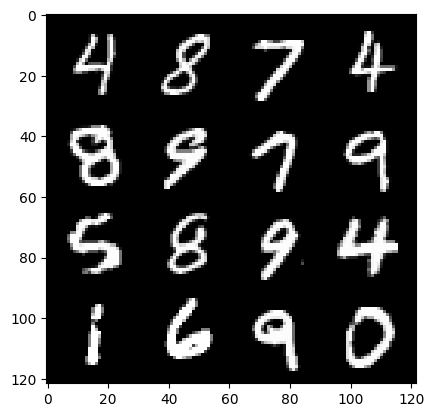

  5%|██▋                                                | 25/469 [00:00<00:13, 31.73it/s]

78: step 36600 / gen loss: 4.224462591807047 / disc_loss 0.08515057025477288


 67%|█████████████████████████████████▋                | 316/469 [00:06<00:03, 48.39it/s]

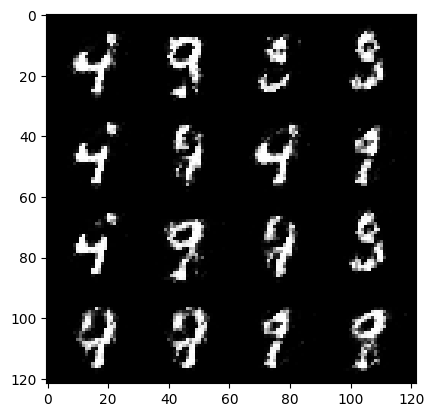

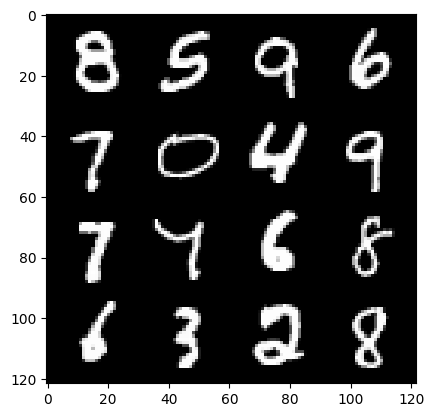

 70%|██████████████████████████████████▊               | 326/469 [00:07<00:04, 34.75it/s]

78: step 36900 / gen loss: 4.271830960114797 / disc_loss 0.08670709110175567


 31%|███████████████▌                                  | 146/469 [00:02<00:06, 47.75it/s]

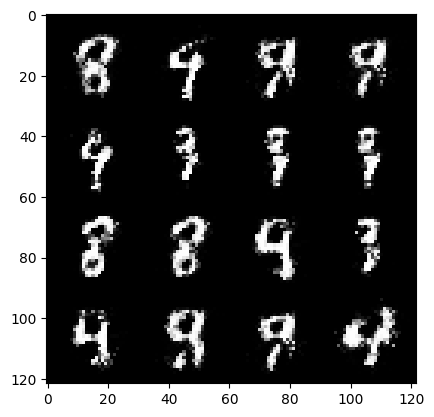

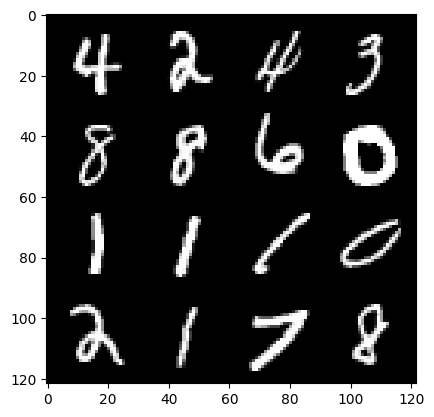

 33%|████████████████▋                                 | 156/469 [00:03<00:09, 34.02it/s]

79: step 37200 / gen loss: 4.279211131731672 / disc_loss 0.0792190504198273


 96%|███████████████████████████████████████████████▊  | 449/469 [00:09<00:00, 49.86it/s]

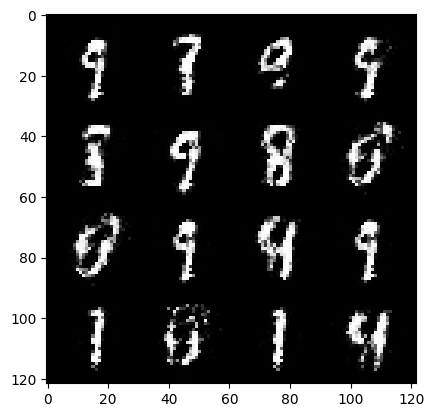

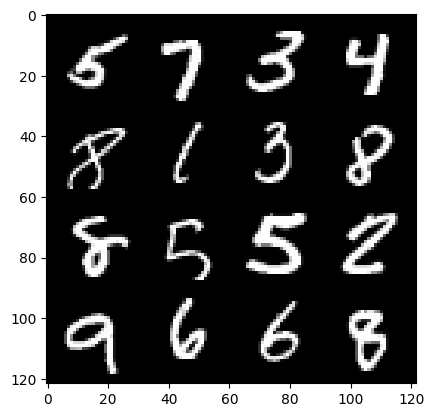

 97%|████████████████████████████████████████████████▍ | 454/469 [00:09<00:00, 33.63it/s]

79: step 37500 / gen loss: 4.24865386247635 / disc_loss 0.09271319977939127


 59%|█████████████████████████████▍                    | 276/469 [00:05<00:04, 48.00it/s]

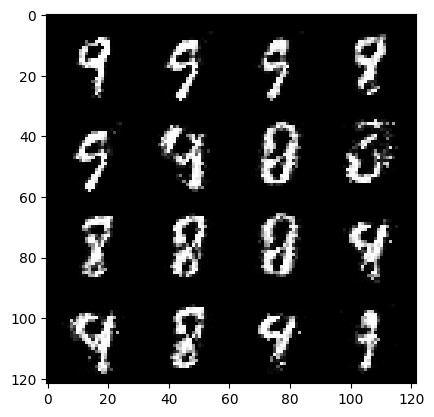

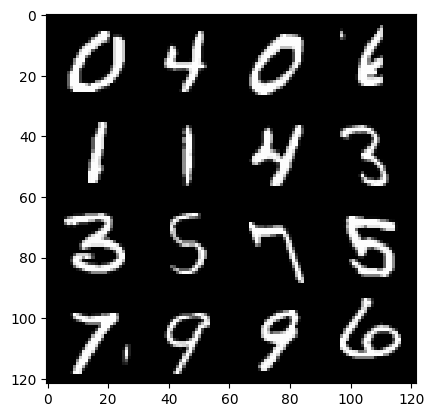

 61%|██████████████████████████████▍                   | 286/469 [00:06<00:05, 32.86it/s]

80: step 37800 / gen loss: 4.060985989570617 / disc_loss 0.09310324187700941


 23%|███████████▌                                      | 108/469 [00:02<00:07, 49.12it/s]

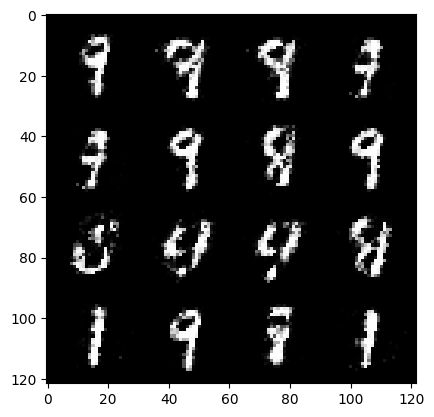

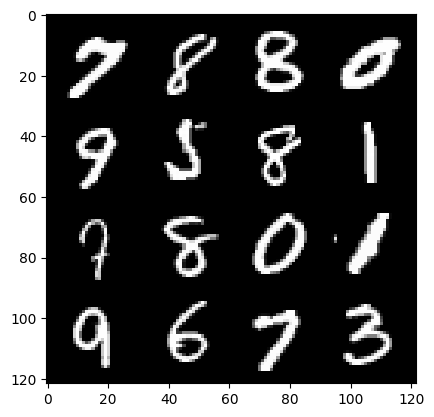

 25%|████████████▌                                     | 118/469 [00:02<00:10, 33.92it/s]

81: step 38100 / gen loss: 4.177688062985738 / disc_loss 0.09421428731953106


 88%|███████████████████████████████████████████▊      | 411/469 [00:08<00:01, 45.35it/s]

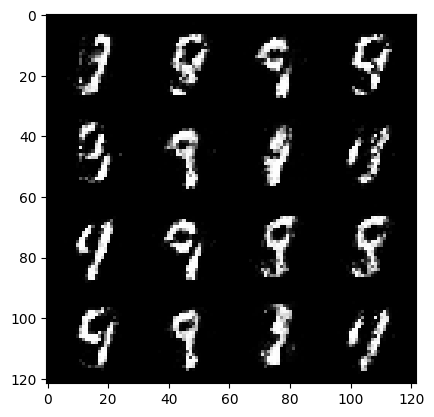

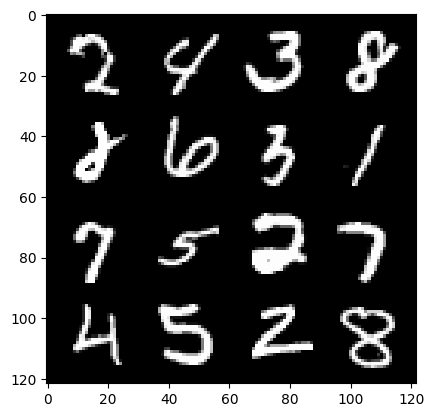

 89%|████████████████████████████████████████████▎     | 416/469 [00:09<00:01, 29.85it/s]

81: step 38400 / gen loss: 4.006377762158714 / disc_loss 0.10260177296896773


 51%|█████████████████████████▌                        | 240/469 [00:04<00:04, 48.55it/s]

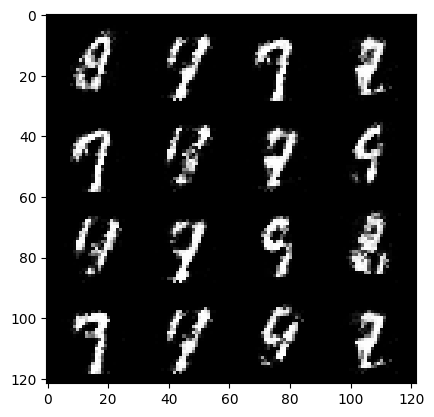

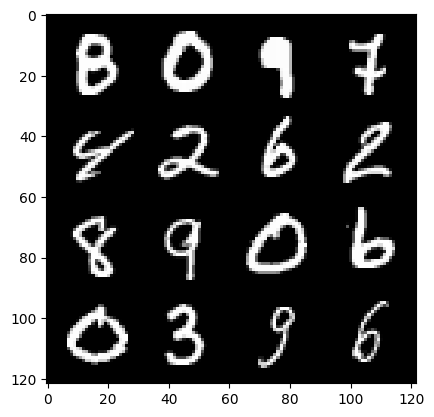

 53%|██████████████████████████▋                       | 250/469 [00:05<00:06, 35.31it/s]

82: step 38700 / gen loss: 3.8365776109695418 / disc_loss 0.12033554389451936


 15%|███████▌                                           | 70/469 [00:01<00:08, 46.05it/s]

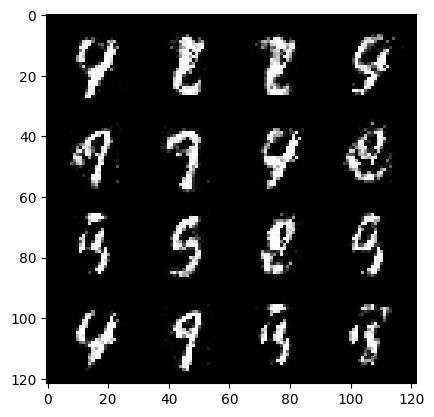

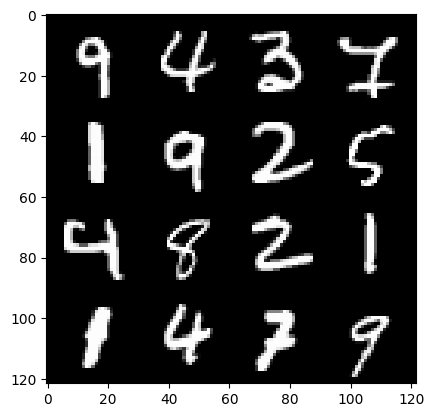

 17%|████████▋                                          | 80/469 [00:01<00:11, 34.69it/s]

83: step 39000 / gen loss: 3.874946742057799 / disc_loss 0.0968149537220597


 80%|███████████████████████████████████████▊          | 373/469 [00:07<00:02, 46.15it/s]

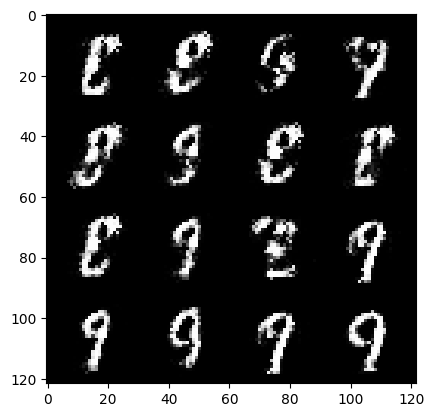

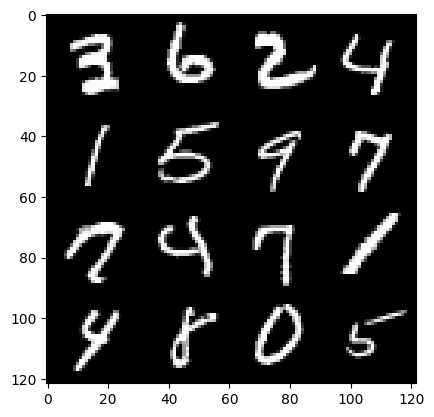

 81%|████████████████████████████████████████▎         | 378/469 [00:08<00:03, 29.76it/s]

83: step 39300 / gen loss: 4.117980837027232 / disc_loss 0.10075460815181332


 43%|█████████████████████▌                            | 202/469 [00:04<00:05, 46.81it/s]

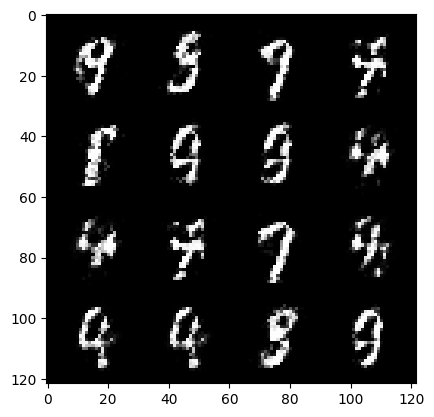

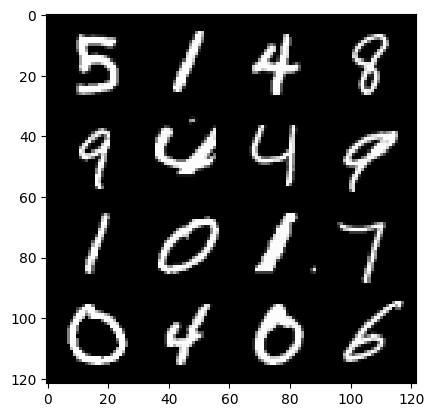

 45%|██████████████████████▌                           | 212/469 [00:04<00:07, 33.86it/s]

84: step 39600 / gen loss: 3.878551853497823 / disc_loss 0.10778585970401766


  7%|███▊                                               | 35/469 [00:00<00:09, 45.20it/s]

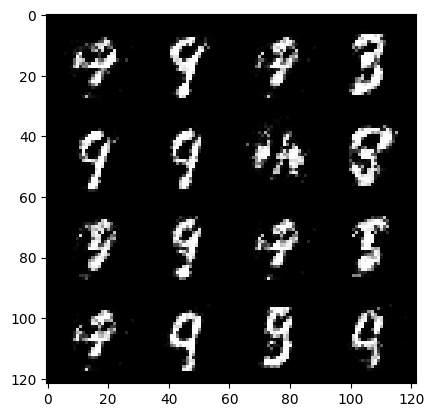

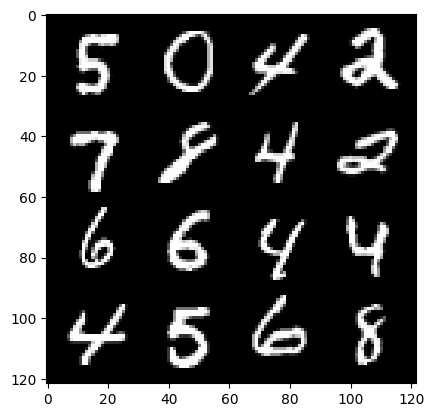

  9%|████▎                                              | 40/469 [00:01<00:14, 29.42it/s]

85: step 39900 / gen loss: 4.036045381228129 / disc_loss 0.11492906125883263


 71%|███████████████████████████████████▎              | 331/469 [00:07<00:02, 48.18it/s]

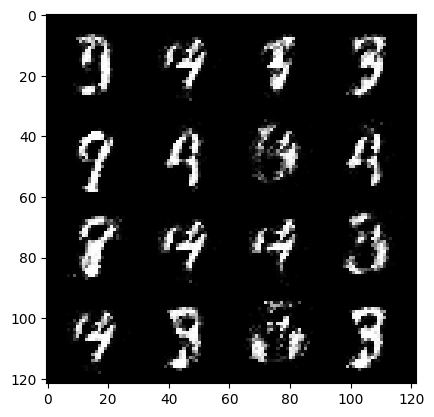

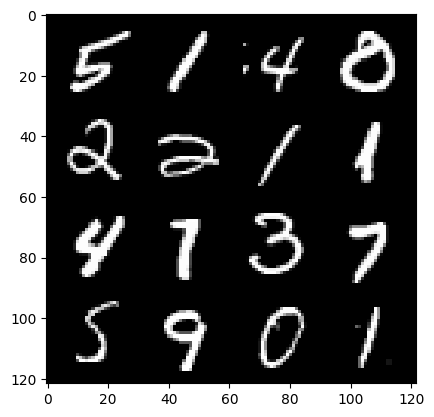

 73%|████████████████████████████████████▎             | 341/469 [00:07<00:03, 33.33it/s]

85: step 40200 / gen loss: 3.944125103155773 / disc_loss 0.1264260358860095


 35%|█████████████████▌                                | 165/469 [00:03<00:06, 45.09it/s]

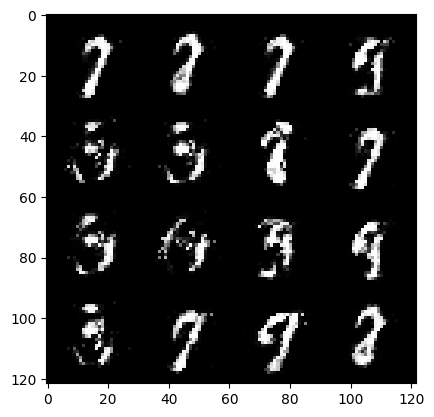

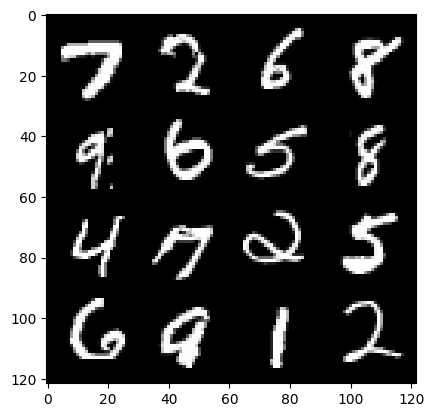

 37%|██████████████████▋                               | 175/469 [00:04<00:09, 32.64it/s]

86: step 40500 / gen loss: 3.7175051744778957 / disc_loss 0.1147349889328083


 99%|█████████████████████████████████████████████████▌| 465/469 [00:10<00:00, 45.37it/s]

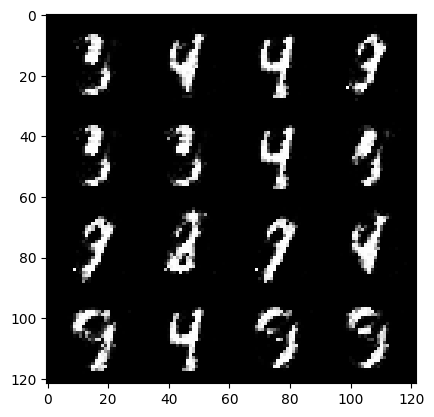

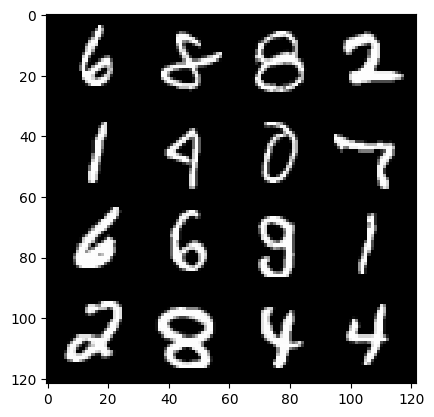

100%|██████████████████████████████████████████████████| 469/469 [00:10<00:00, 42.81it/s]


86: step 40800 / gen loss: 3.777001789410908 / disc_loss 0.11467362307012084


 63%|███████████████████████████████▍                  | 295/469 [00:06<00:03, 45.35it/s]

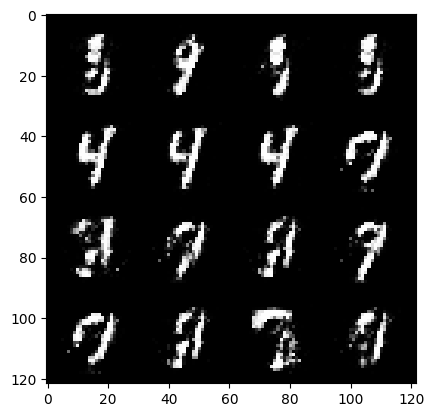

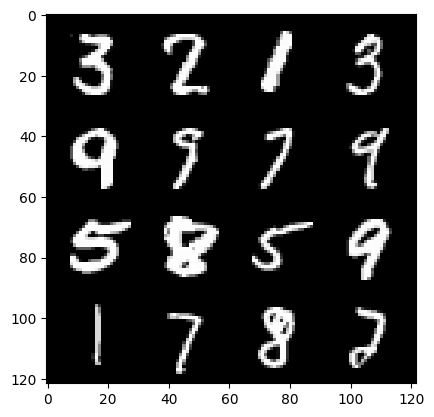

 65%|████████████████████████████████▌                 | 305/469 [00:07<00:05, 30.95it/s]

87: step 41100 / gen loss: 4.054377970695494 / disc_loss 0.09786057396481437


 27%|█████████████▎                                    | 125/469 [00:02<00:08, 42.11it/s]

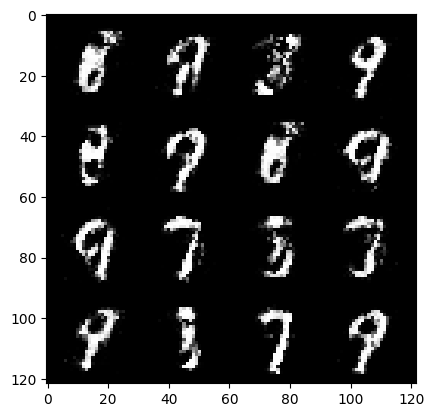

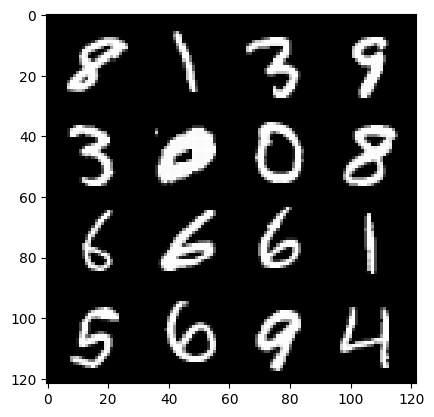

 29%|██████████████▎                                   | 134/469 [00:03<00:12, 27.68it/s]

88: step 41400 / gen loss: 3.845330510934193 / disc_loss 0.12760095668335752


 91%|█████████████████████████████████████████████▎    | 425/469 [00:09<00:00, 47.58it/s]

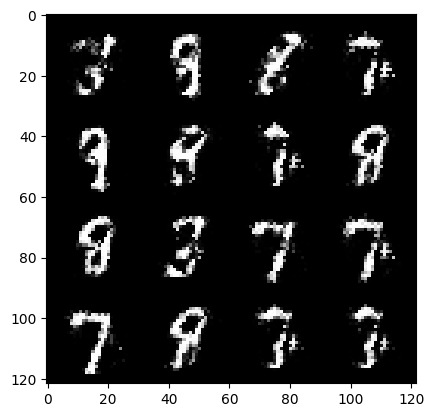

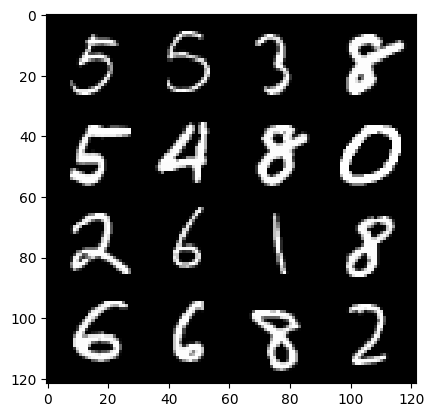

 93%|██████████████████████████████████████████████▍   | 435/469 [00:10<00:00, 34.84it/s]

88: step 41700 / gen loss: 3.851705011526745 / disc_loss 0.10251844736437002


 54%|███████████████████████████▏                      | 255/469 [00:05<00:04, 47.44it/s]

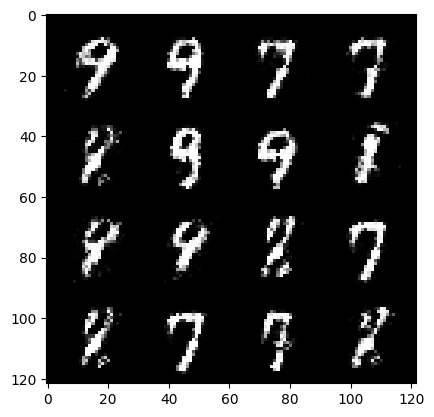

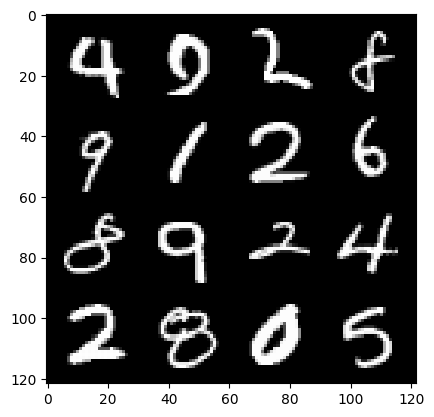

 57%|████████████████████████████▎                     | 265/469 [00:05<00:06, 33.24it/s]

89: step 42000 / gen loss: 3.7332046763102222 / disc_loss 0.11197126998255645


 19%|█████████▊                                         | 90/469 [00:01<00:08, 45.46it/s]

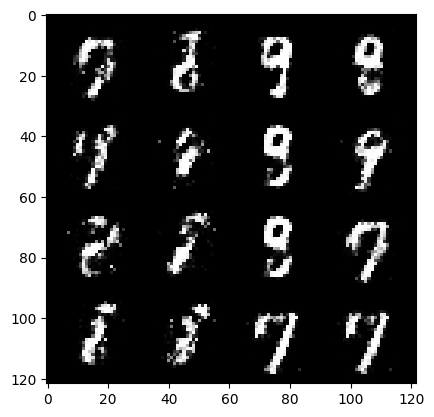

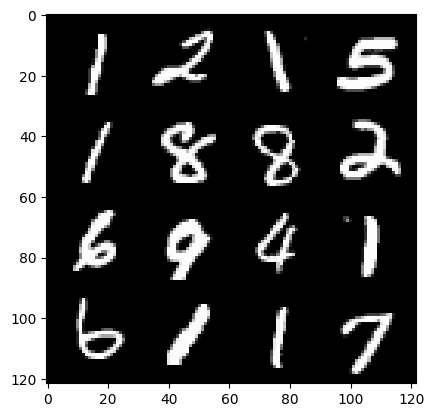

 20%|██████████▎                                        | 95/469 [00:02<00:13, 26.76it/s]

90: step 42300 / gen loss: 3.7441317001978565 / disc_loss 0.11510864295065398


 83%|█████████████████████████████████████████▍        | 389/469 [00:09<00:01, 44.85it/s]

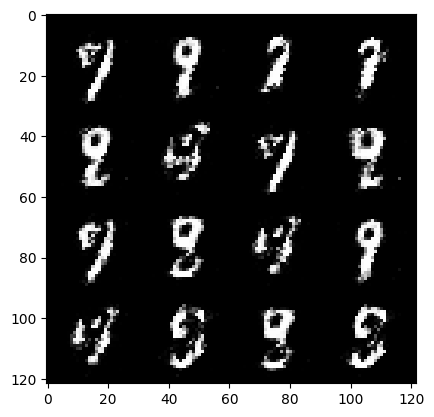

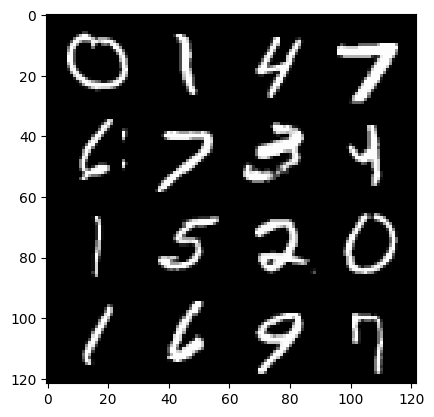

 84%|██████████████████████████████████████████        | 394/469 [00:09<00:02, 27.24it/s]

90: step 42600 / gen loss: 4.004528090159097 / disc_loss 0.10557230426619445


 46%|███████████████████████▏                          | 218/469 [00:04<00:05, 48.07it/s]

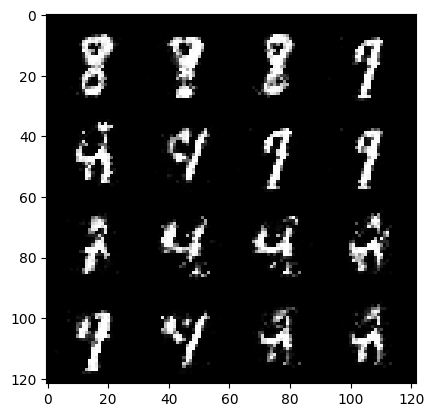

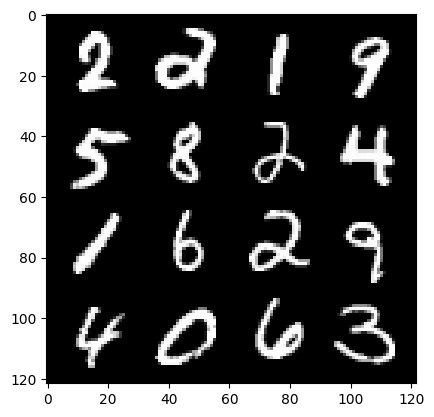

 49%|████████████████████████▎                         | 228/469 [00:05<00:07, 32.90it/s]

91: step 42900 / gen loss: 3.9848998546600325 / disc_loss 0.09519578034679096


 11%|█████▋                                             | 52/469 [00:01<00:08, 47.41it/s]

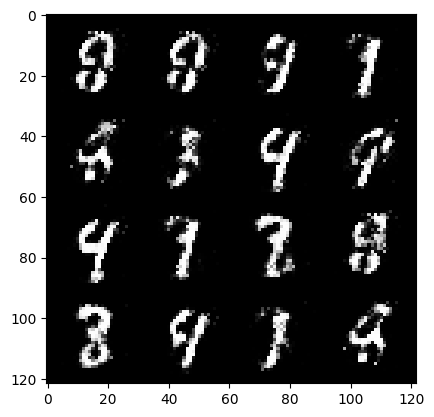

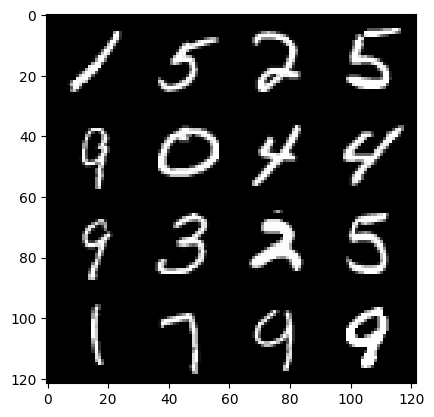

 12%|██████▏                                            | 57/469 [00:01<00:13, 29.92it/s]

92: step 43200 / gen loss: 3.7139272340138727 / disc_loss 0.11737985012431945


 75%|█████████████████████████████████████▌            | 352/469 [00:07<00:02, 45.56it/s]

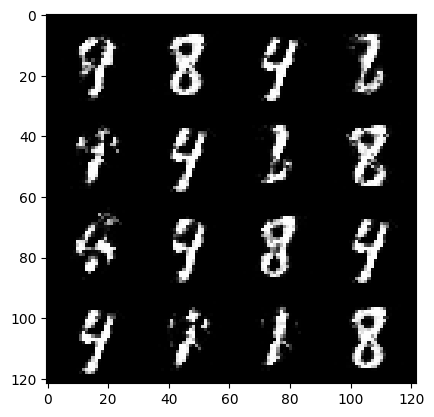

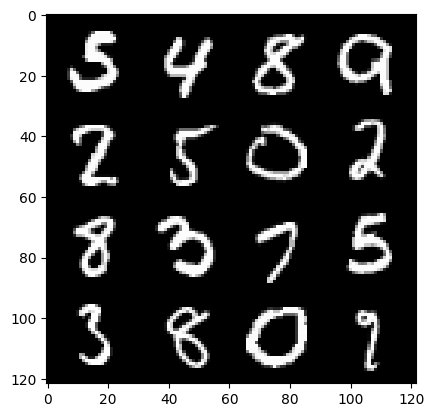

 76%|██████████████████████████████████████            | 357/469 [00:08<00:03, 30.74it/s]

92: step 43500 / gen loss: 3.950401777426401 / disc_loss 0.10850760685900845


 38%|███████████████████▏                              | 180/469 [00:03<00:06, 46.12it/s]

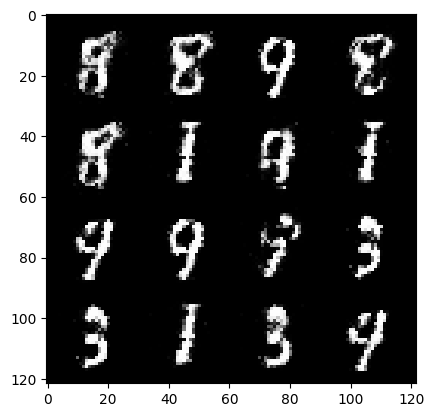

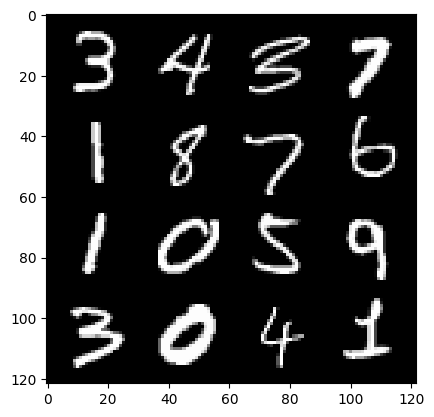

 41%|████████████████████▎                             | 190/469 [00:04<00:08, 34.58it/s]

93: step 43800 / gen loss: 3.772737501462301 / disc_loss 0.10755849962433182


  2%|█                                                  | 10/469 [00:00<00:10, 42.13it/s]

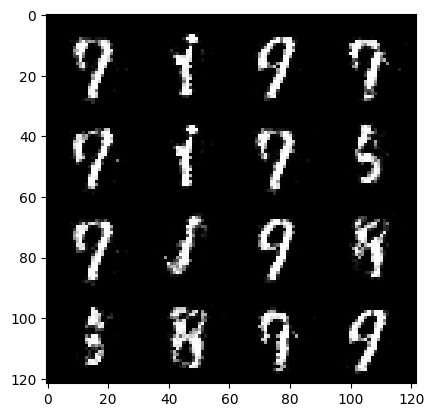

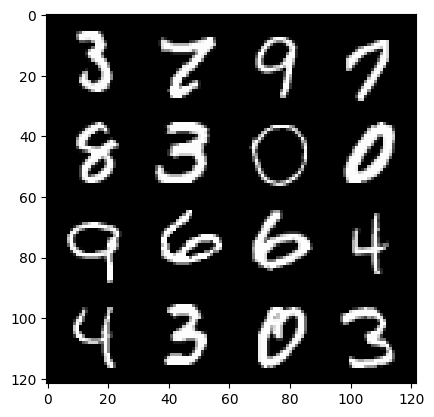

  4%|██▏                                                | 20/469 [00:00<00:15, 28.33it/s]

94: step 44100 / gen loss: 3.5716769782702134 / disc_loss 0.1253055529420574


 67%|█████████████████████████████████▎                | 313/469 [00:06<00:03, 48.40it/s]

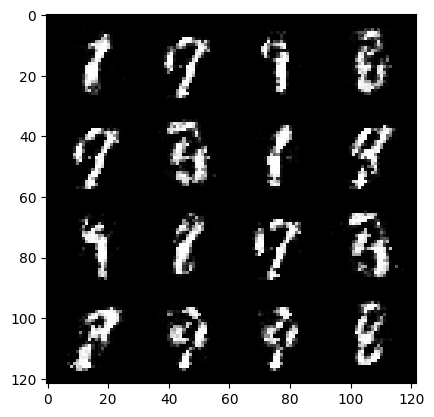

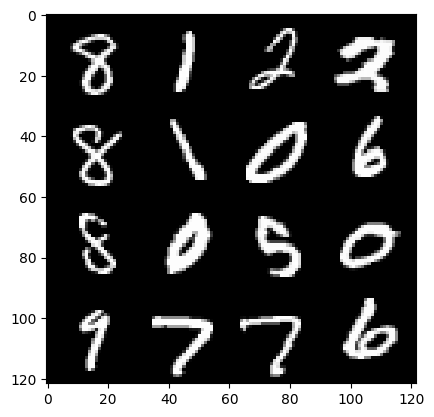

 68%|█████████████████████████████████▉                | 318/469 [00:07<00:04, 32.03it/s]

94: step 44400 / gen loss: 3.715805451075235 / disc_loss 0.12764572617908318


 31%|███████████████▍                                  | 145/469 [00:02<00:06, 48.56it/s]

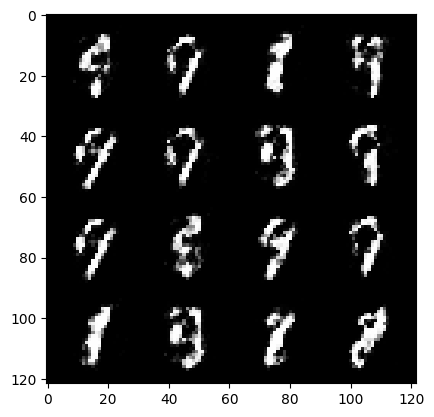

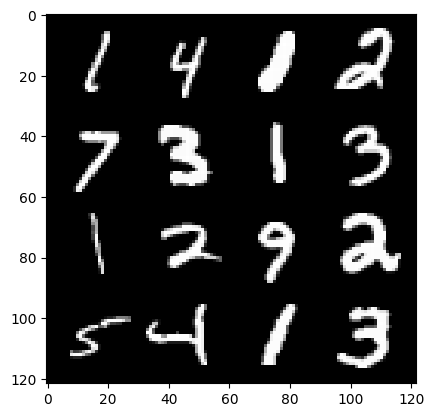

 33%|████████████████▌                                 | 155/469 [00:03<00:08, 35.62it/s]

95: step 44700 / gen loss: 3.687040781180064 / disc_loss 0.10964715802421174


 94%|██████████████████████████████████████████████▉   | 440/469 [00:09<00:00, 48.21it/s]

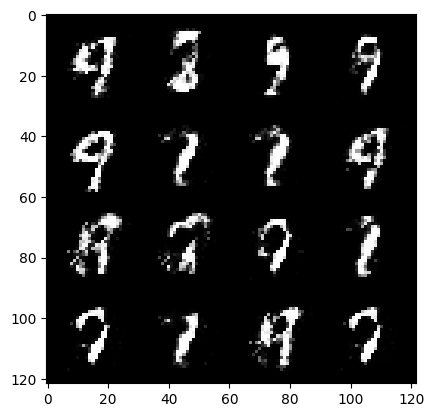

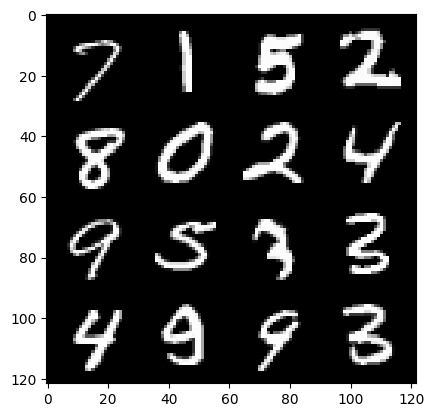

 96%|████████████████████████████████████████████████▏ | 452/469 [00:09<00:00, 36.53it/s]

95: step 45000 / gen loss: 3.8449199946721366 / disc_loss 0.11587133674571913


 58%|█████████████████████████████▏                    | 274/469 [00:05<00:03, 50.66it/s]

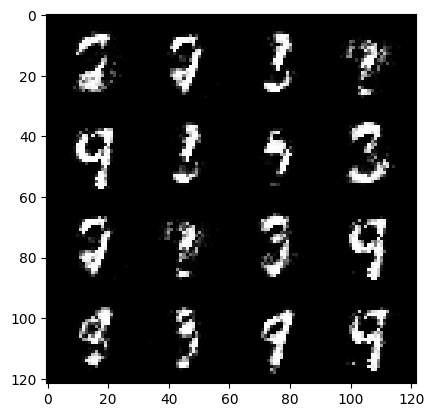

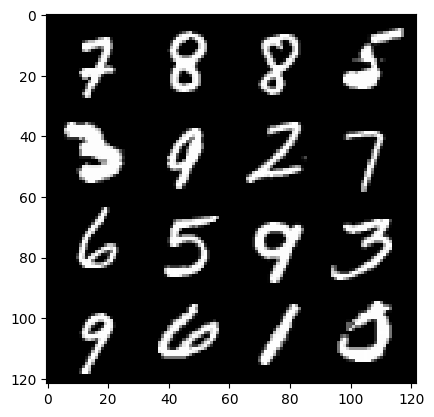

 61%|██████████████████████████████▍                   | 285/469 [00:05<00:04, 38.32it/s]

96: step 45300 / gen loss: 3.622696536382039 / disc_loss 0.12568836090465385


 23%|███████████▎                                      | 106/469 [00:02<00:07, 45.84it/s]

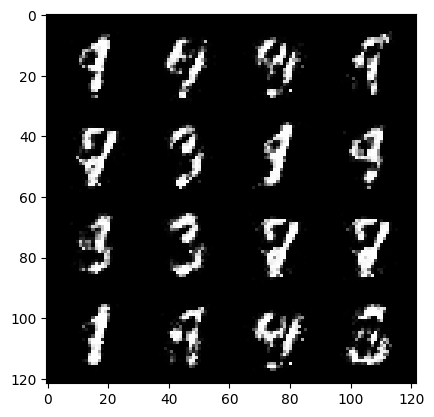

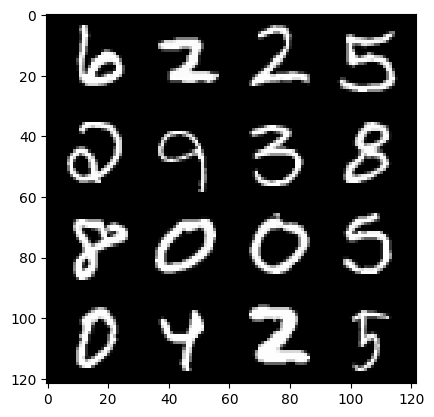

 25%|████████████▎                                     | 116/469 [00:02<00:10, 34.15it/s]

97: step 45600 / gen loss: 3.8144361837704994 / disc_loss 0.11709481688837209


 87%|███████████████████████████████████████████▎      | 406/469 [00:08<00:01, 46.25it/s]

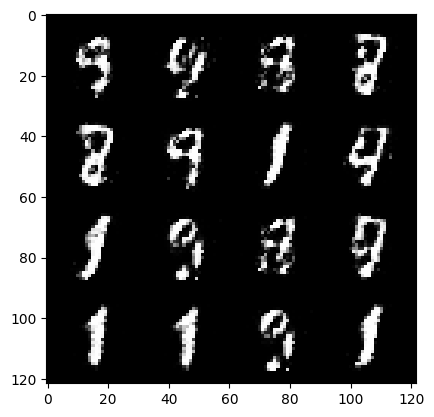

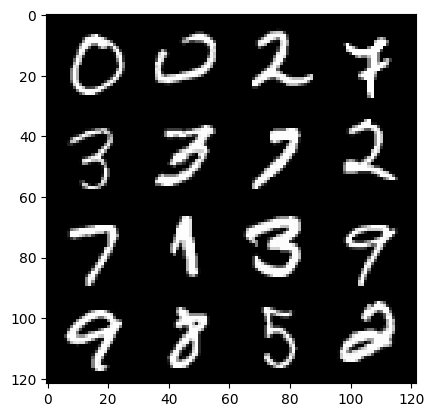

 89%|████████████████████████████████████████████▎     | 416/469 [00:09<00:01, 28.21it/s]

97: step 45900 / gen loss: 3.5613314318656912 / disc_loss 0.1291178910682599


 50%|█████████████████████████▏                        | 236/469 [00:04<00:04, 48.81it/s]

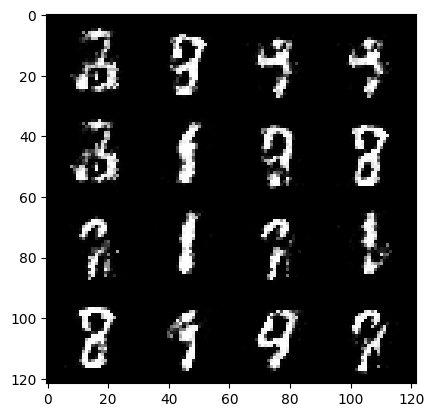

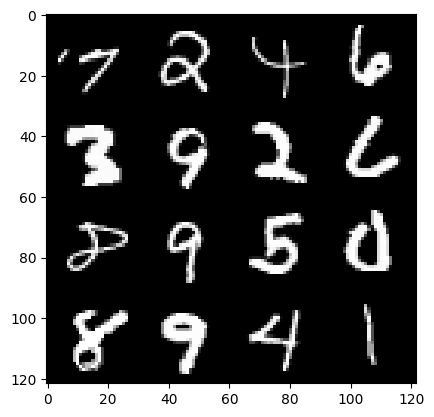

 52%|██████████████████████████▏                       | 246/469 [00:05<00:06, 34.47it/s]

98: step 46200 / gen loss: 3.6308454426129644 / disc_loss 0.11553654396285616


 14%|███████                                            | 65/469 [00:01<00:08, 46.35it/s]

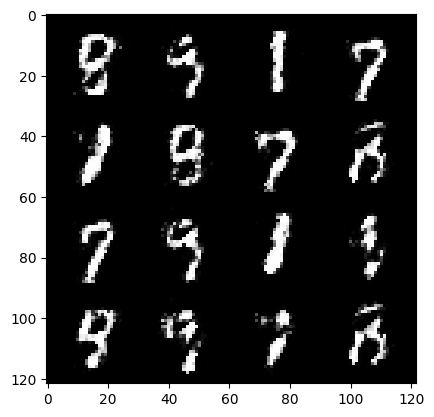

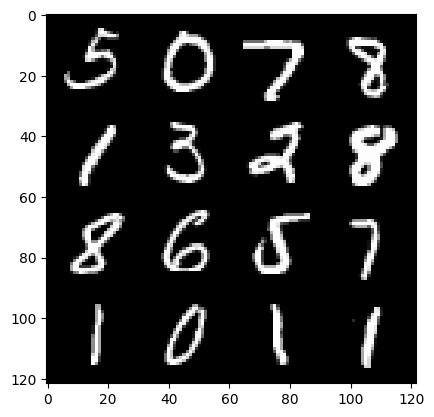

 16%|████████▏                                          | 75/469 [00:01<00:12, 31.46it/s]

99: step 46500 / gen loss: 3.5028759558995564 / disc_loss 0.12637269782523314


 78%|███████████████████████████████████████▏          | 367/469 [00:08<00:02, 46.57it/s]

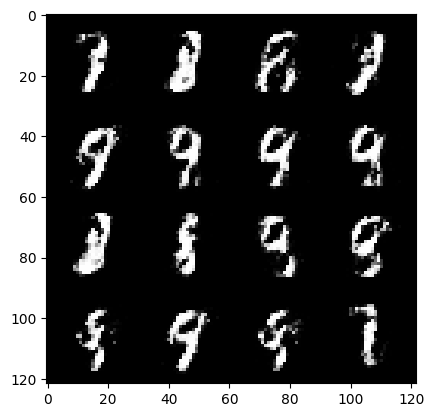

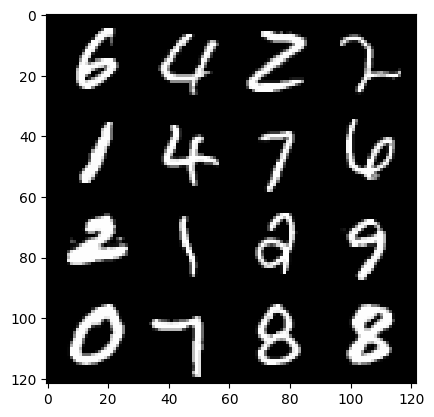

 80%|████████████████████████████████████████▏         | 377/469 [00:08<00:02, 32.57it/s]

99: step 46800 / gen loss: 3.3120213675498955 / disc_loss 0.15472360479334982


 42%|████████████████████▉                             | 196/469 [00:04<00:05, 46.83it/s]

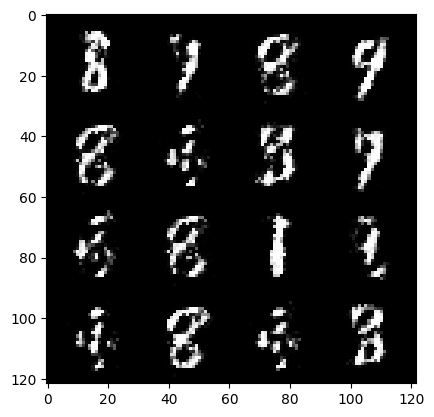

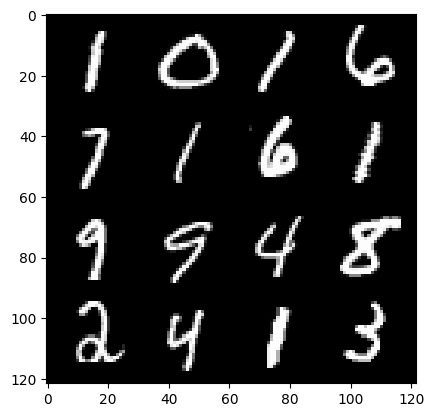

 44%|█████████████████████▉                            | 206/469 [00:04<00:07, 34.22it/s]

100: step 47100 / gen loss: 3.3222558871905017 / disc_loss 0.14268788953622163


  6%|██▉                                                | 27/469 [00:00<00:08, 49.22it/s]

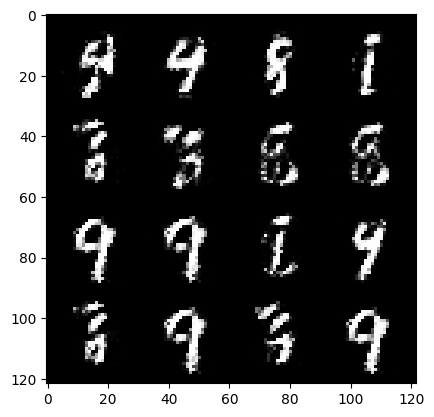

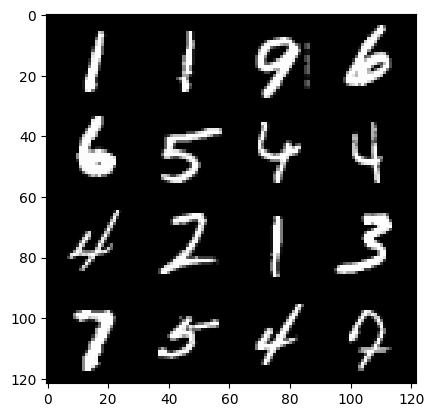

  8%|████                                               | 37/469 [00:00<00:12, 34.92it/s]

101: step 47400 / gen loss: 3.459298017819721 / disc_loss 0.1277500503882765


 71%|███████████████████████████████████▎              | 331/469 [00:07<00:02, 49.66it/s]

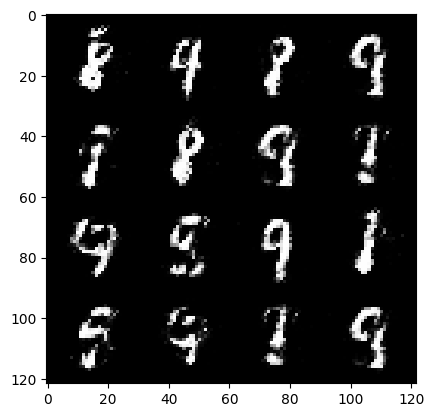

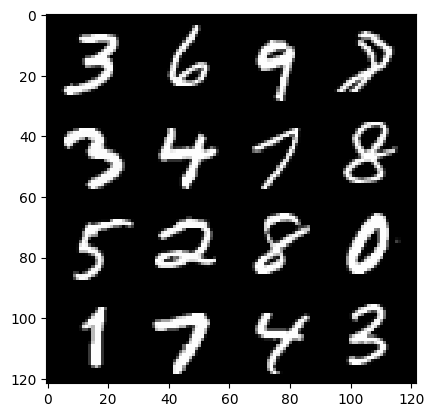

 73%|████████████████████████████████████▎             | 341/469 [00:07<00:03, 36.71it/s]

101: step 47700 / gen loss: 3.2880487100283324 / disc_loss 0.1454700197776158


 35%|█████████████████▎                                | 162/469 [00:03<00:06, 49.50it/s]

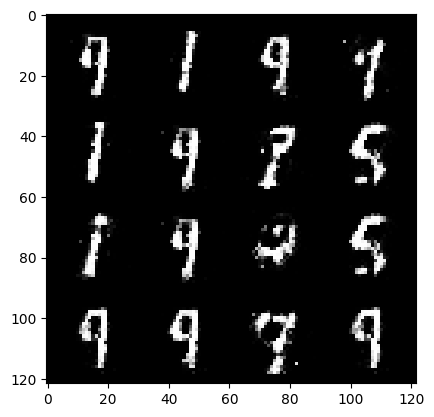

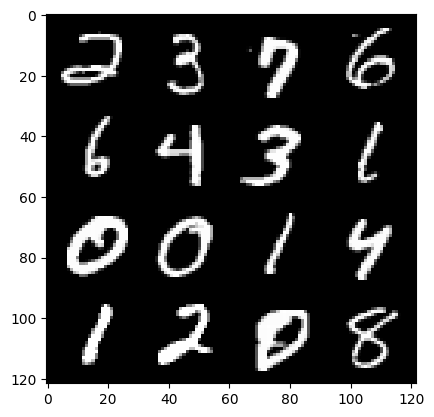

 36%|█████████████████▊                                | 167/469 [00:03<00:09, 33.52it/s]

102: step 48000 / gen loss: 3.563699837525685 / disc_loss 0.13212705208609504


 98%|████████████████████████████████████████████████▉ | 459/469 [00:09<00:00, 50.77it/s]

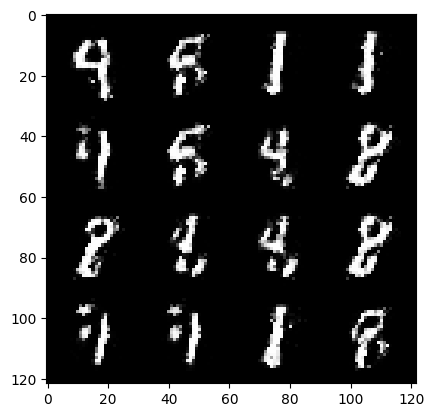

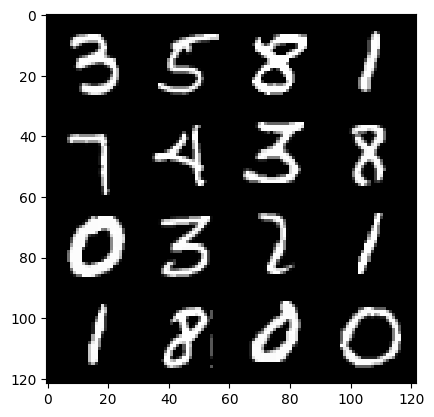

100%|██████████████████████████████████████████████████| 469/469 [00:09<00:00, 48.26it/s]


102: step 48300 / gen loss: 3.8928158084551536 / disc_loss 0.11927164271473877


 62%|███████████████████████████████                   | 291/469 [00:06<00:04, 43.66it/s]

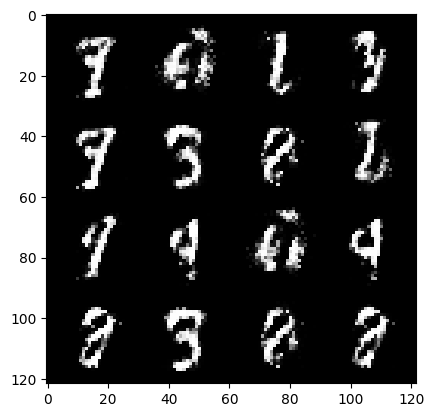

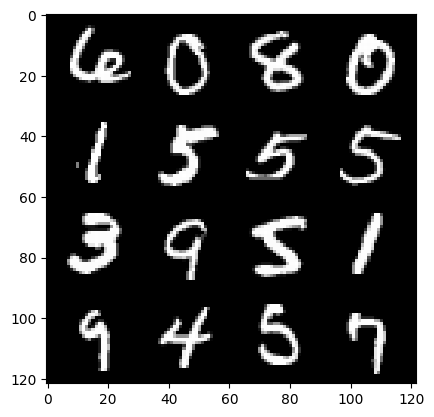

 64%|████████████████████████████████                  | 301/469 [00:06<00:05, 31.16it/s]

103: step 48600 / gen loss: 3.684842557907106 / disc_loss 0.13990800905972728


 26%|█████████████▏                                    | 124/469 [00:02<00:07, 48.76it/s]

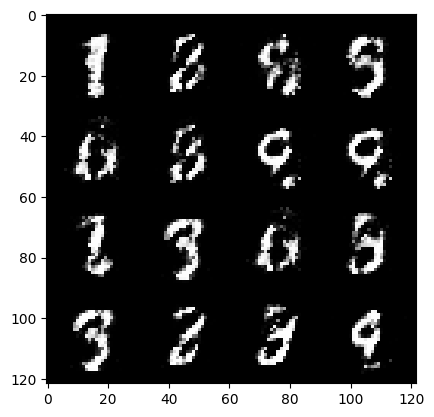

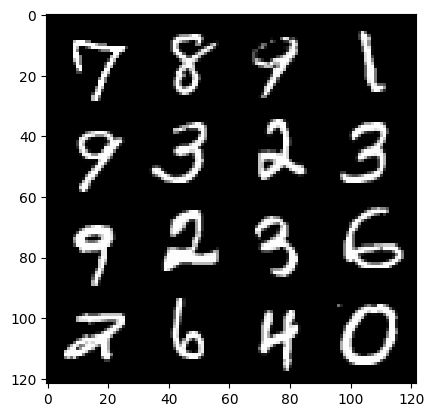

 28%|█████████████▊                                    | 129/469 [00:02<00:11, 30.37it/s]

104: step 48900 / gen loss: 3.5352788027127557 / disc_loss 0.1308029013499617


 90%|█████████████████████████████████████████████▏    | 424/469 [00:09<00:00, 45.20it/s]

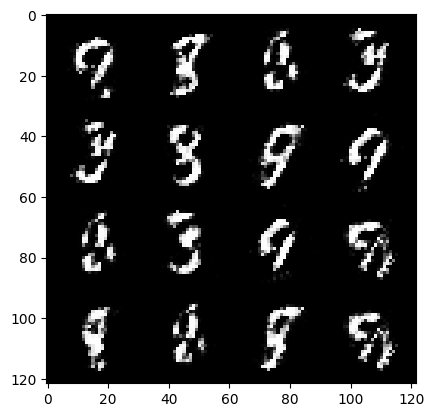

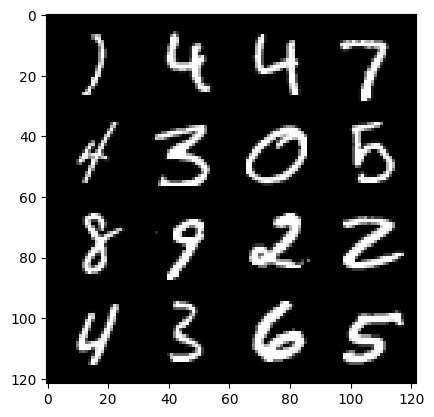

 91%|█████████████████████████████████████████████▋    | 429/469 [00:09<00:01, 29.64it/s]

104: step 49200 / gen loss: 3.7154213833808885 / disc_loss 0.11129212088882917


 54%|███████████████████████████                       | 254/469 [00:05<00:04, 47.75it/s]

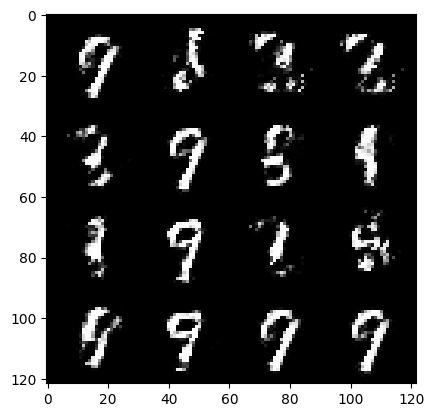

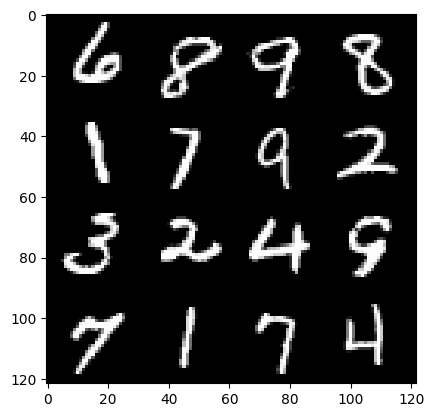

 56%|████████████████████████████▏                     | 264/469 [00:05<00:05, 34.39it/s]

105: step 49500 / gen loss: 3.971763091882069 / disc_loss 0.09637657133862364


 18%|█████████                                          | 83/469 [00:01<00:08, 45.94it/s]

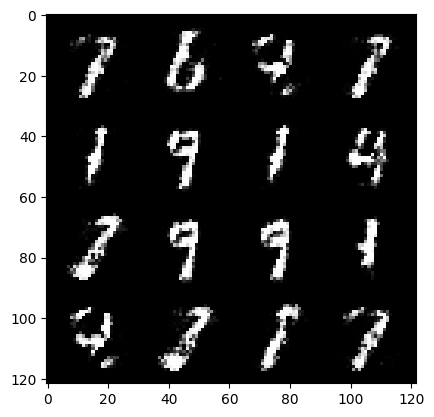

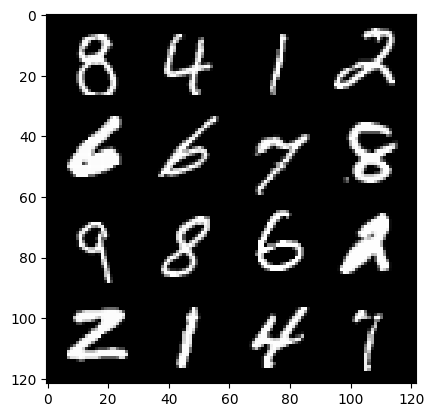

 20%|██████████                                         | 93/469 [00:02<00:11, 32.79it/s]

106: step 49800 / gen loss: 3.815393557548524 / disc_loss 0.12391261373956998


 82%|█████████████████████████████████████████         | 385/469 [00:08<00:01, 47.03it/s]

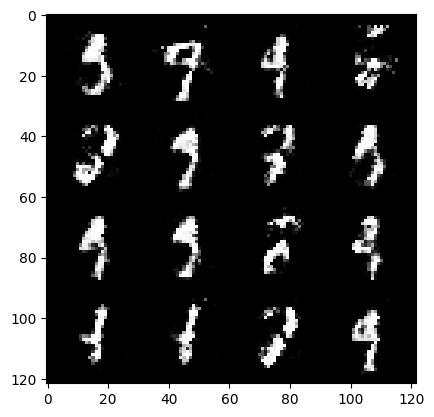

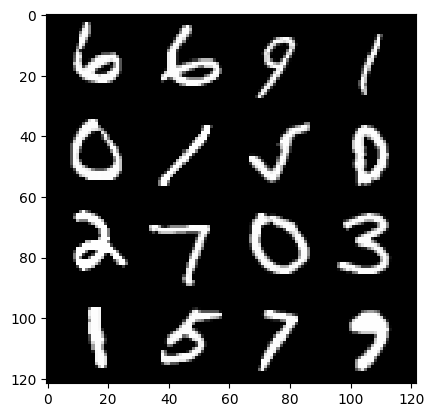

 83%|█████████████████████████████████████████▌        | 390/469 [00:08<00:02, 29.93it/s]

106: step 50100 / gen loss: 3.7539474646250373 / disc_loss 0.11317343010256686


 45%|██████████████████████▌                           | 212/469 [00:04<00:05, 51.06it/s]

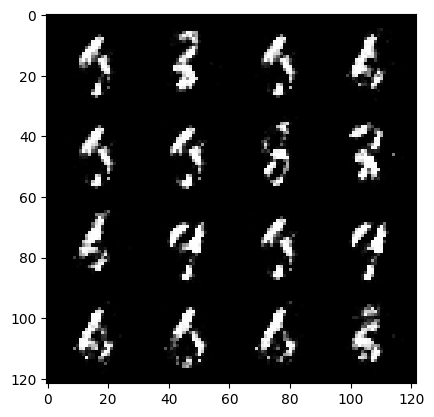

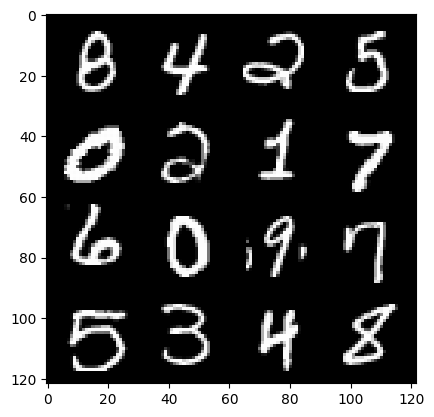

 48%|███████████████████████▊                          | 223/469 [00:04<00:06, 37.32it/s]

107: step 50400 / gen loss: 3.691050446033477 / disc_loss 0.11842502988874913


 10%|█████▏                                             | 48/469 [00:00<00:08, 47.52it/s]

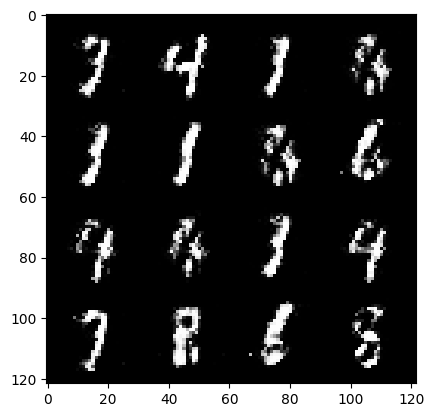

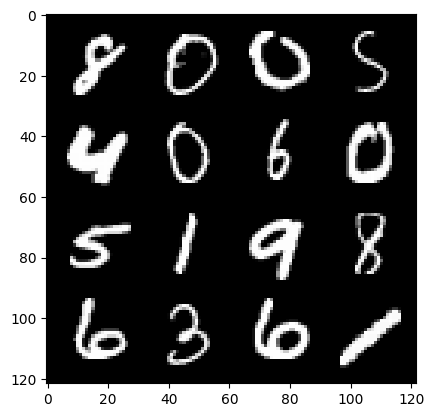

 11%|█████▊                                             | 53/469 [00:01<00:13, 31.41it/s]

108: step 50700 / gen loss: 3.6438697608311963 / disc_loss 0.1314204009994865


 73%|████████████████████████████████████▋             | 344/469 [00:07<00:02, 49.09it/s]

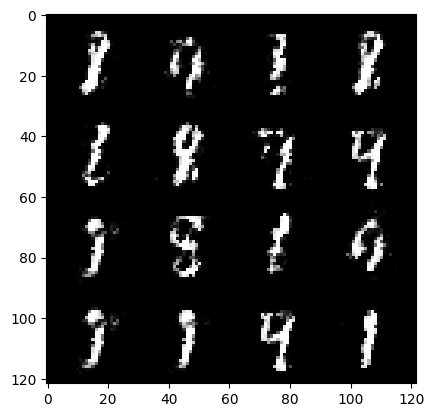

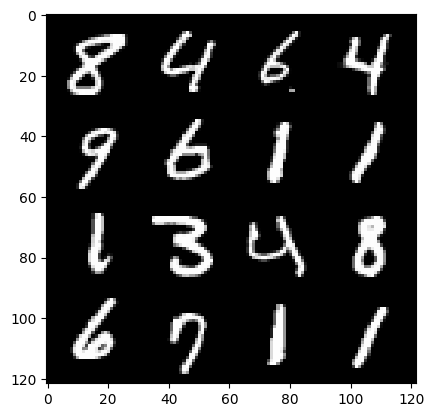

 75%|█████████████████████████████████████▋            | 353/469 [00:07<00:03, 34.04it/s]

108: step 51000 / gen loss: 3.5483897535006186 / disc_loss 0.14233338057994835


 38%|███████████████████                               | 179/469 [00:03<00:06, 48.17it/s]

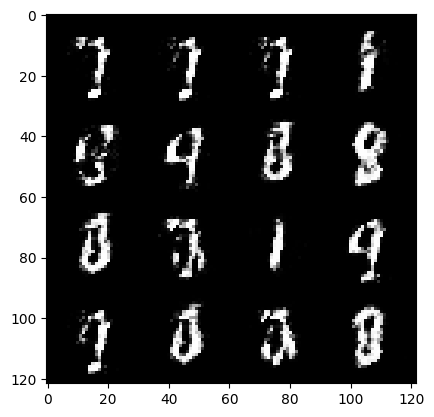

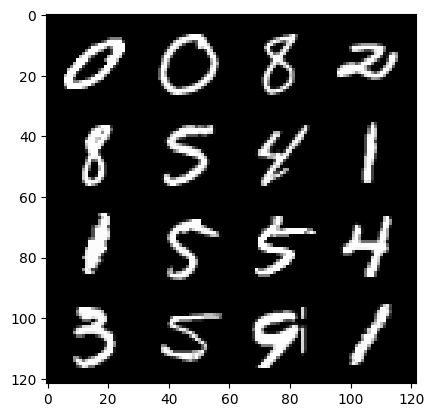

 40%|████████████████████▏                             | 189/469 [00:04<00:07, 35.70it/s]

109: step 51300 / gen loss: 3.2148534584045403 / disc_loss 0.16088492227097365


  1%|▋                                                   | 6/469 [00:00<00:09, 50.24it/s]

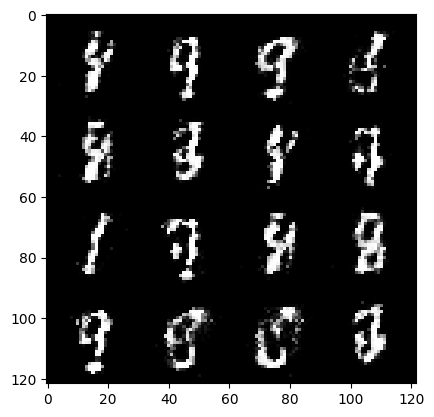

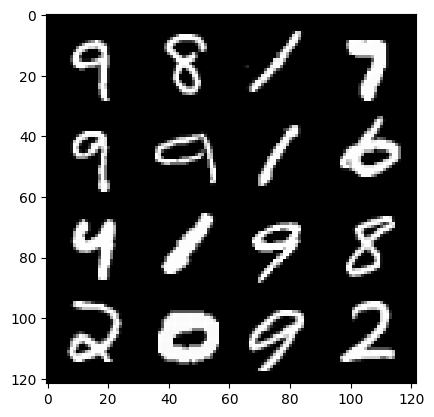

  4%|█▊                                                 | 17/469 [00:00<00:17, 26.35it/s]

110: step 51600 / gen loss: 3.2841718856493634 / disc_loss 0.156420370042324


 65%|████████████████████████████████▌                 | 306/469 [00:06<00:03, 47.26it/s]

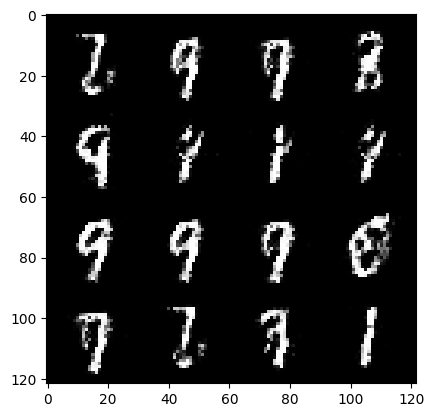

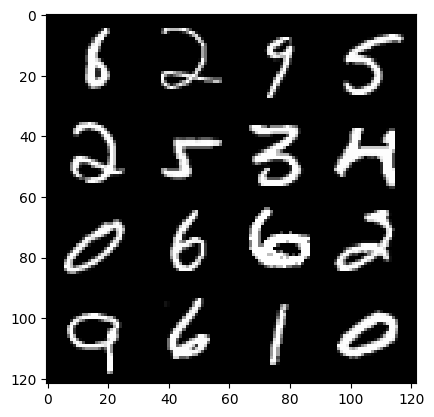

 68%|█████████████████████████████████▊                | 317/469 [00:07<00:04, 37.13it/s]

110: step 51900 / gen loss: 3.3552523318926486 / disc_loss 0.137027212480704


 29%|██████████████▋                                   | 138/469 [00:02<00:06, 47.88it/s]

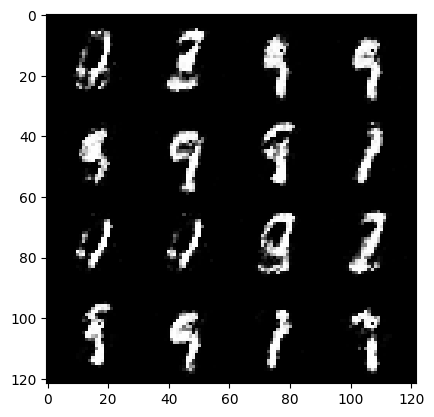

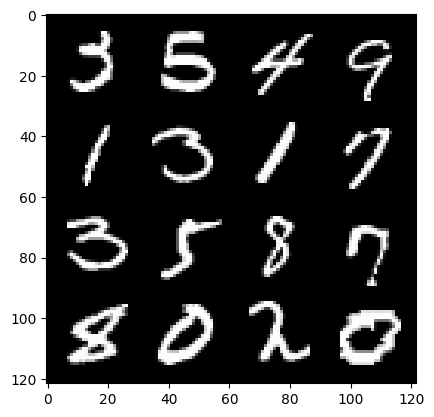

 32%|███████████████▊                                  | 148/469 [00:03<00:09, 32.79it/s]

111: step 52200 / gen loss: 3.3404982805252073 / disc_loss 0.1489899446815253


 94%|██████████████████████████████████████████████▉   | 440/469 [00:09<00:00, 47.58it/s]

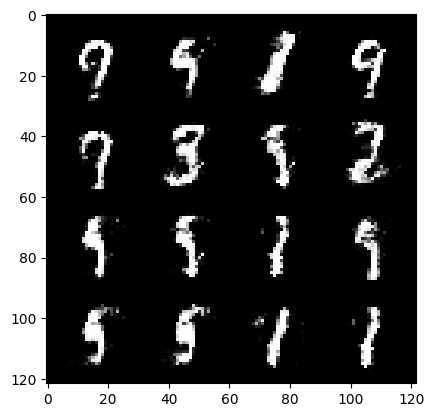

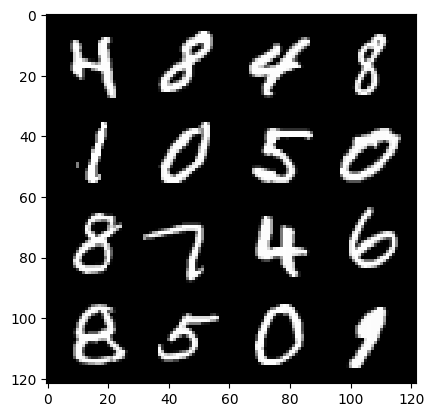

 96%|███████████████████████████████████████████████▉  | 450/469 [00:09<00:00, 35.73it/s]

111: step 52500 / gen loss: 3.3009102416038503 / disc_loss 0.15455223051210248


 58%|████████████████████████████▉                     | 271/469 [00:05<00:04, 46.03it/s]

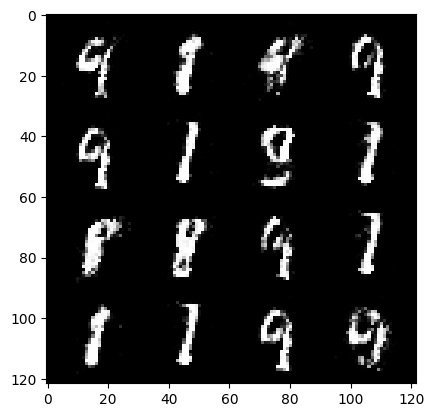

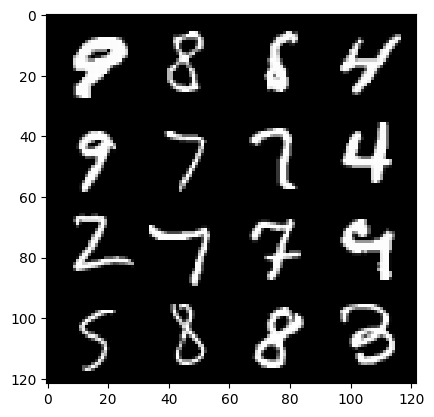

 60%|█████████████████████████████▉                    | 281/469 [00:06<00:05, 34.38it/s]

112: step 52800 / gen loss: 3.4623793236414597 / disc_loss 0.14100267715752118


 21%|██████████▋                                       | 100/469 [00:02<00:07, 49.04it/s]

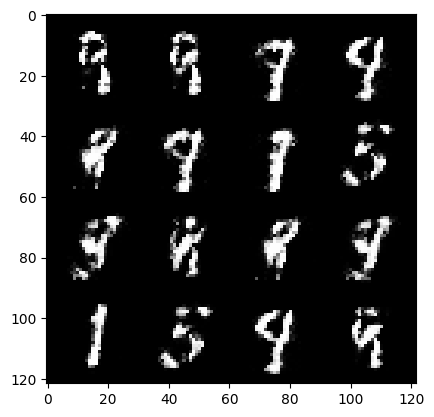

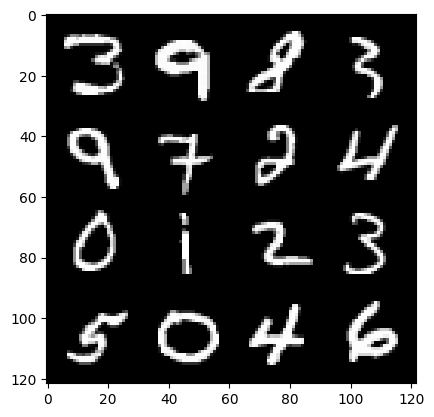

 23%|███████████▋                                      | 110/469 [00:02<00:09, 35.92it/s]

113: step 53100 / gen loss: 3.4822705944379178 / disc_loss 0.14588466296593358


 85%|██████████████████████████████████████████▋       | 400/469 [00:08<00:01, 49.34it/s]

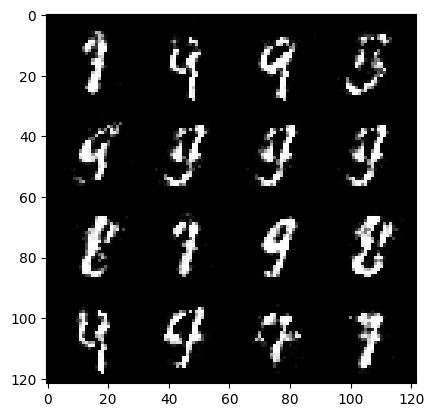

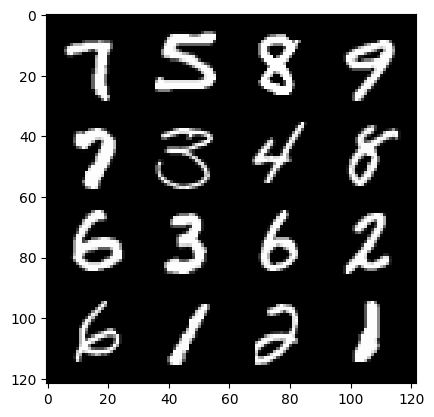

 87%|███████████████████████████████████████████▌      | 409/469 [00:08<00:01, 33.65it/s]

113: step 53400 / gen loss: 3.342703118324282 / disc_loss 0.14239640988409516


 49%|████████████████████████▋                         | 231/469 [00:04<00:04, 49.32it/s]

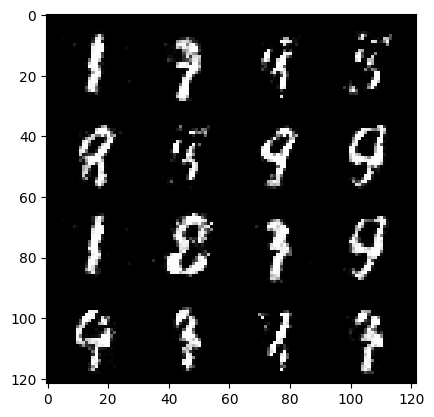

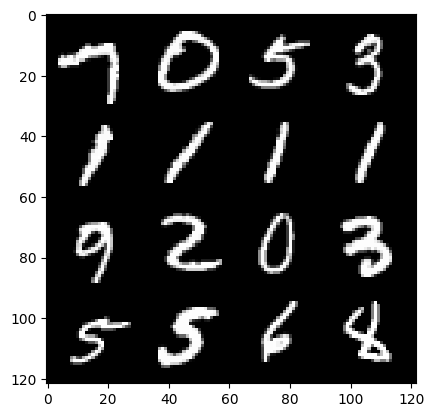

 51%|█████████████████████████▋                        | 241/469 [00:05<00:06, 34.27it/s]

114: step 53700 / gen loss: 3.2512057073911036 / disc_loss 0.14487111153701937


 14%|███████                                            | 65/469 [00:01<00:08, 50.32it/s]

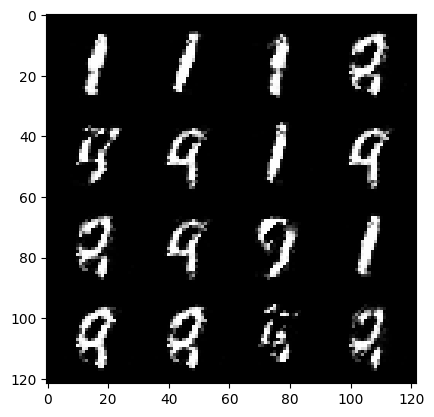

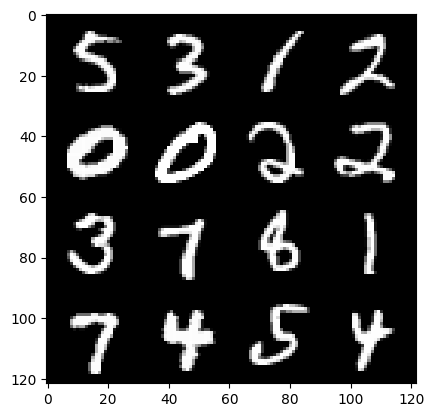

 15%|███████▋                                           | 71/469 [00:01<00:12, 31.45it/s]

115: step 54000 / gen loss: 3.4060046275456726 / disc_loss 0.13273878907163936


 77%|██████████████████████████████████████▋           | 363/469 [00:07<00:02, 48.15it/s]

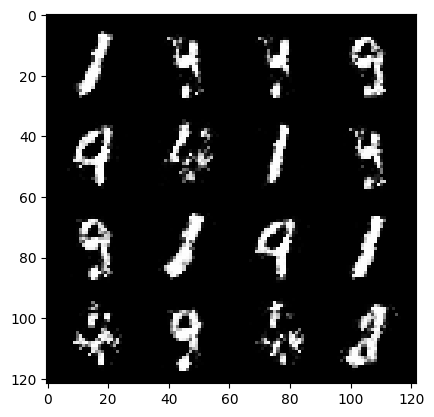

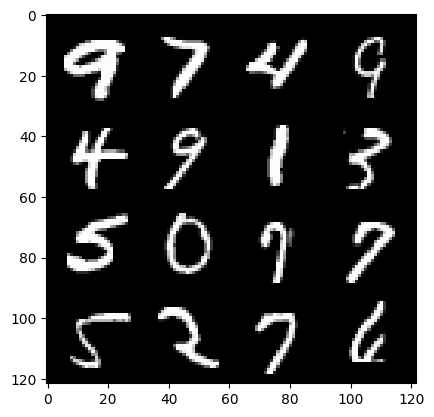

 80%|███████████████████████████████████████▊          | 373/469 [00:08<00:02, 32.49it/s]

115: step 54300 / gen loss: 3.289204974969228 / disc_loss 0.1462525354574124


 42%|████████████████████▉                             | 196/469 [00:03<00:05, 51.77it/s]

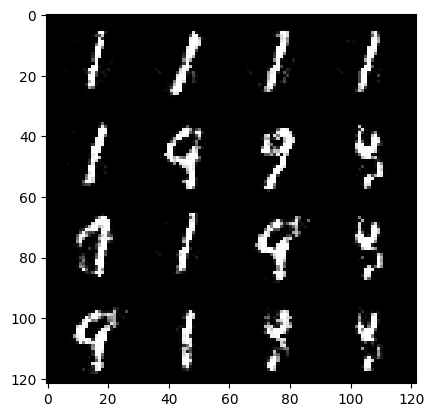

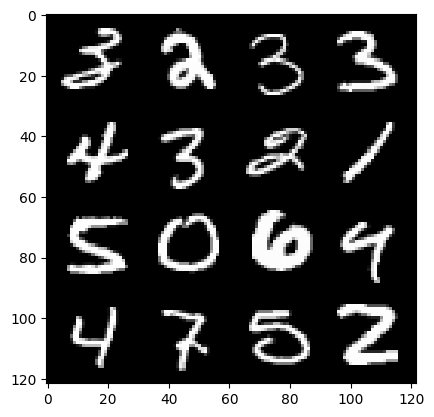

 43%|█████████████████████▌                            | 202/469 [00:04<00:07, 34.75it/s]

116: step 54600 / gen loss: 3.272971587181094 / disc_loss 0.14801664965848124


  5%|██▋                                                | 25/469 [00:00<00:09, 46.31it/s]

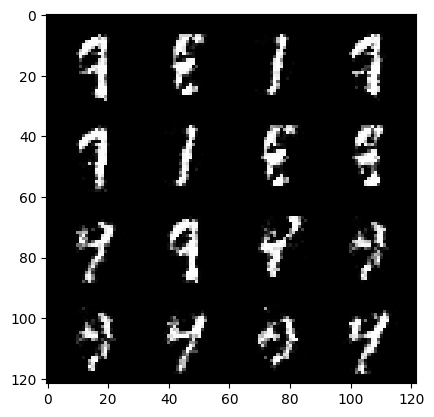

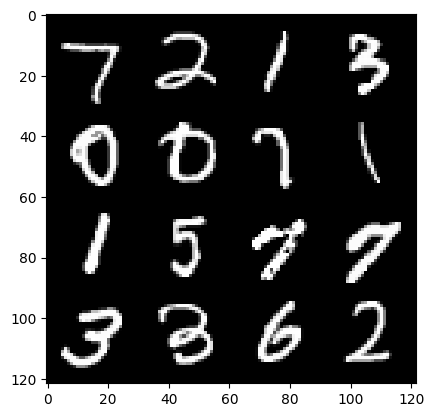

  7%|███▋                                               | 34/469 [00:00<00:14, 30.46it/s]

117: step 54900 / gen loss: 3.3672924717267345 / disc_loss 0.14450845961769423


 70%|██████████████████████████████████▊               | 327/469 [00:07<00:02, 48.43it/s]

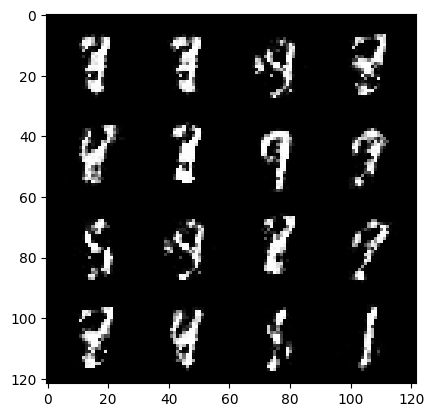

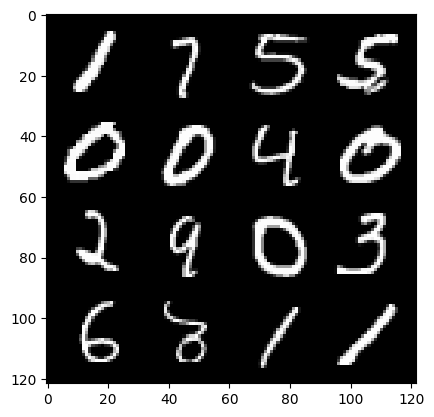

 71%|███████████████████████████████████▍              | 332/469 [00:07<00:04, 31.18it/s]

117: step 55200 / gen loss: 3.4971140321095775 / disc_loss 0.1273295905689399


 33%|████████████████▌                                 | 155/469 [00:03<00:06, 46.51it/s]

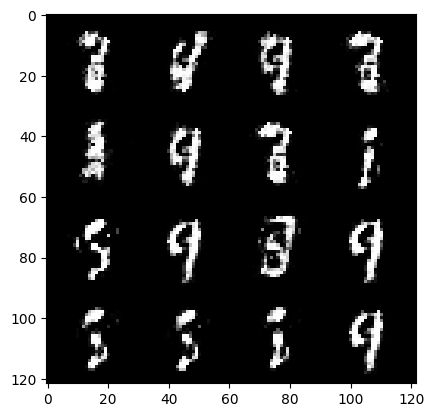

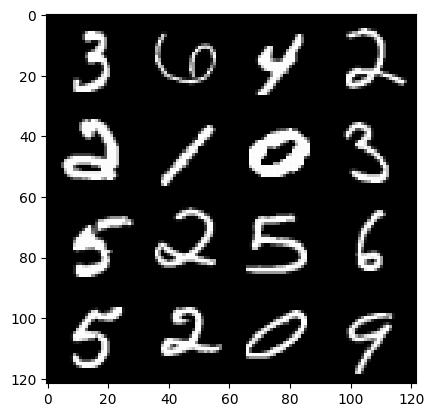

 35%|█████████████████▌                                | 165/469 [00:03<00:09, 32.79it/s]

118: step 55500 / gen loss: 3.218305036226909 / disc_loss 0.15312194108963012


 97%|████████████████████████████████████████████████▌ | 455/469 [00:09<00:00, 47.30it/s]

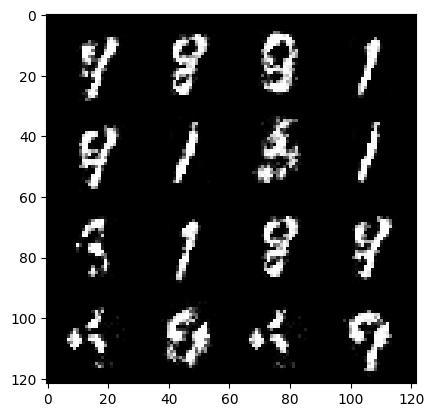

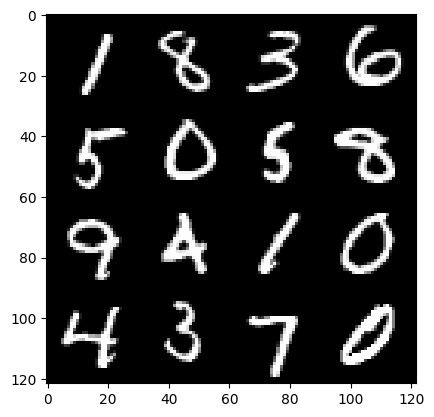

 99%|█████████████████████████████████████████████████▌| 465/469 [00:10<00:00, 33.20it/s]

118: step 55800 / gen loss: 3.3200231409072862 / disc_loss 0.15154392443597323


 62%|██████████████████████████████▊                   | 289/469 [00:06<00:03, 48.60it/s]

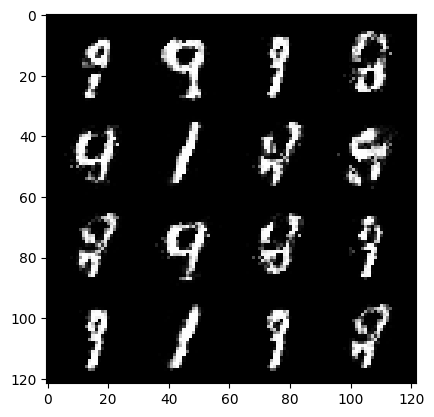

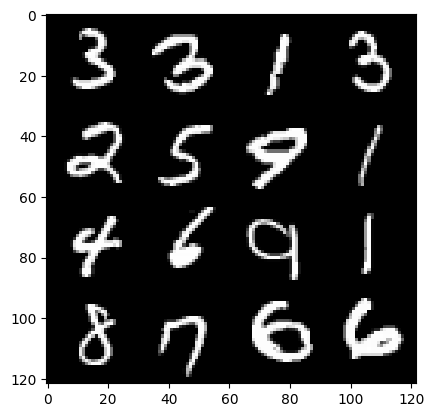

 63%|███████████████████████████████▎                  | 294/469 [00:06<00:05, 32.10it/s]

119: step 56100 / gen loss: 3.16546857357025 / disc_loss 0.15791503285368275


 26%|████████████▊                                     | 120/469 [00:02<00:07, 47.54it/s]

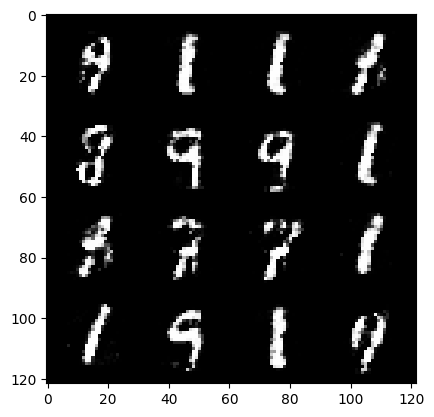

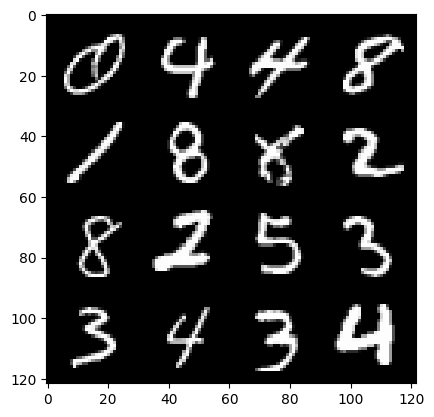

 27%|█████████████▎                                    | 125/469 [00:02<00:14, 24.41it/s]

120: step 56400 / gen loss: 3.1902686897913624 / disc_loss 0.16795424655079852


 89%|████████████████████████████████████████████▍     | 417/469 [00:08<00:01, 49.78it/s]

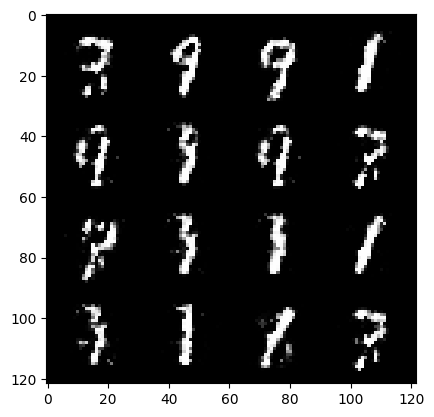

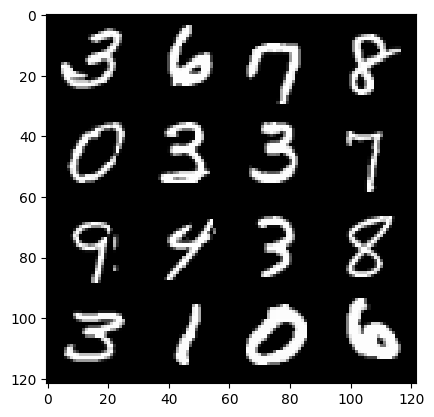

 91%|█████████████████████████████████████████████▌    | 427/469 [00:09<00:01, 36.62it/s]

120: step 56700 / gen loss: 3.066550884246821 / disc_loss 0.16022934342424078


 53%|██████████████████████████▋                       | 250/469 [00:05<00:04, 45.52it/s]

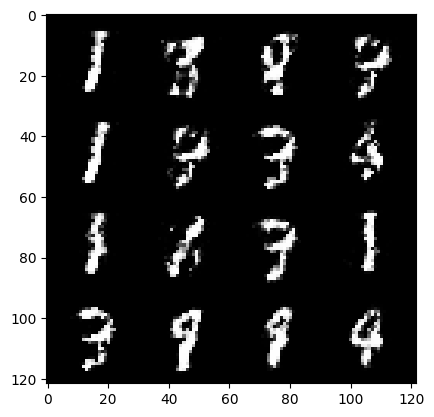

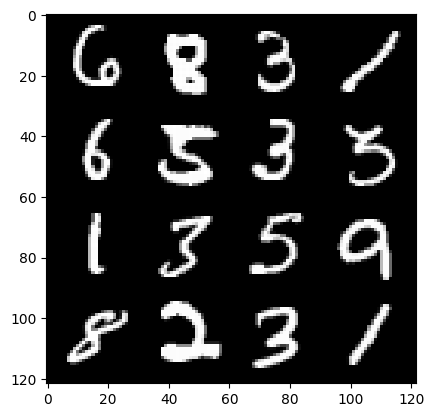

 55%|███████████████████████████▋                      | 260/469 [00:05<00:06, 34.40it/s]

121: step 57000 / gen loss: 3.217080225149791 / disc_loss 0.14362023582061134


 17%|████████▊                                          | 81/469 [00:01<00:07, 48.85it/s]

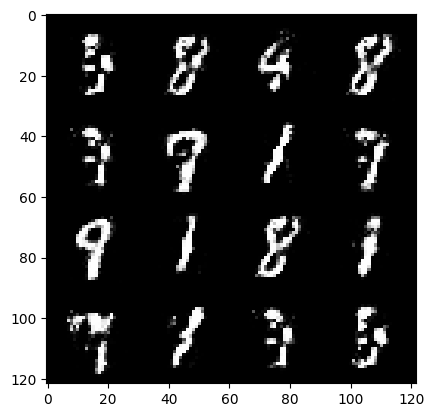

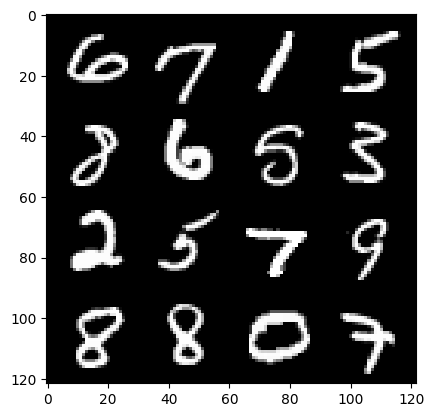

 18%|█████████▎                                         | 86/469 [00:01<00:12, 31.64it/s]

122: step 57300 / gen loss: 3.0733196330070496 / disc_loss 0.16694558460265396


 81%|████████████████████████████████████████▍         | 379/469 [00:07<00:01, 47.78it/s]

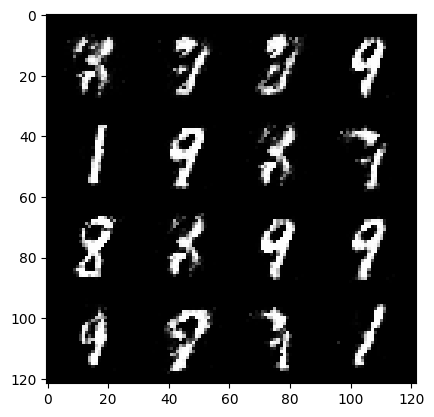

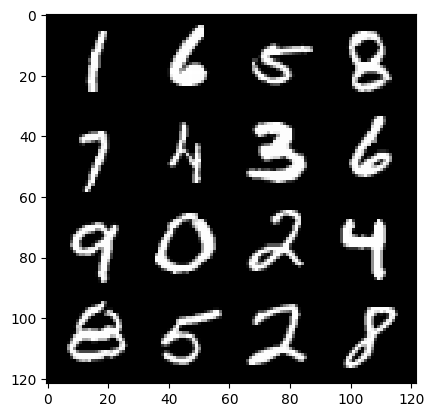

 83%|█████████████████████████████████████████▍        | 389/469 [00:08<00:02, 34.26it/s]

122: step 57600 / gen loss: 3.2166475041707354 / disc_loss 0.1643131984273593


 45%|██████████████████████▍                           | 211/469 [00:04<00:05, 48.83it/s]

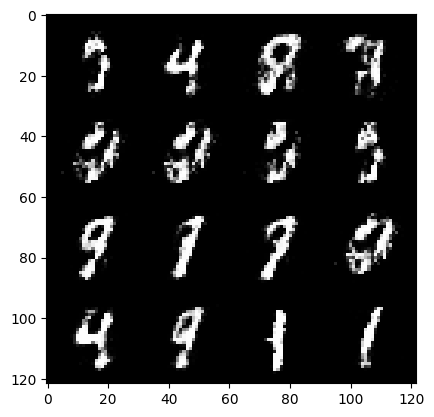

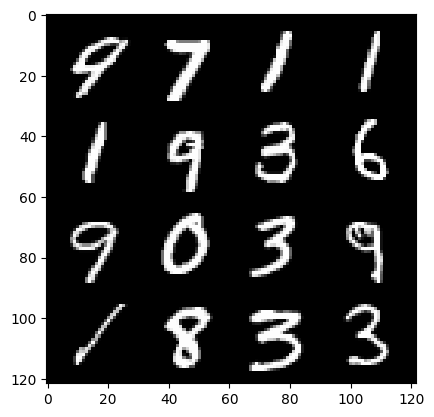

 47%|███████████████████████▌                          | 221/469 [00:04<00:07, 35.37it/s]

123: step 57900 / gen loss: 3.1786115113894162 / disc_loss 0.16825418328245478


  9%|████▎                                              | 40/469 [00:00<00:08, 50.47it/s]

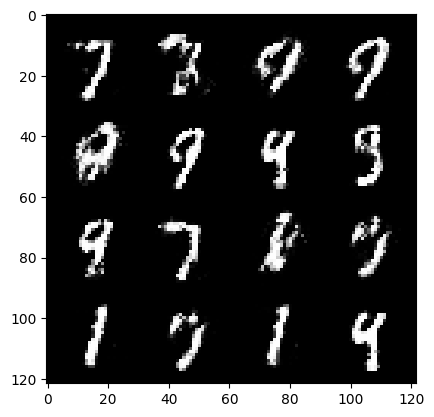

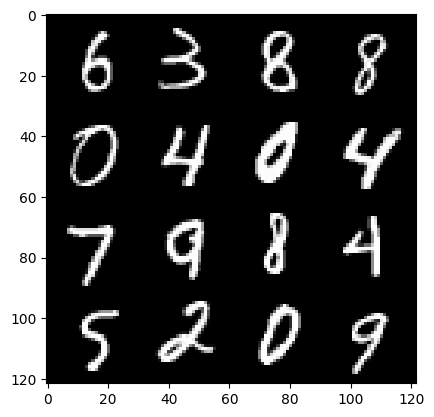

 11%|█████▋                                             | 52/469 [00:01<00:11, 37.27it/s]

124: step 58200 / gen loss: 2.9452118349075334 / disc_loss 0.20250796469549343


 72%|████████████████████████████████████▏             | 340/469 [00:07<00:02, 49.57it/s]

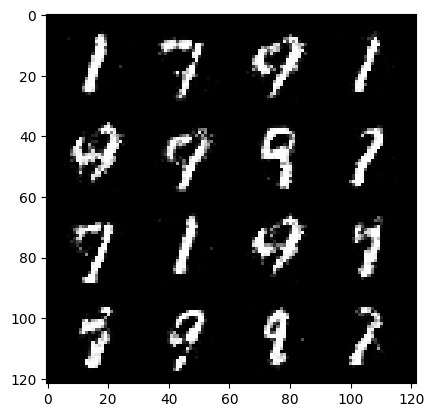

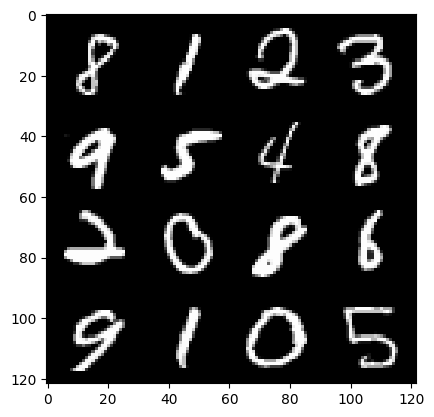

 75%|█████████████████████████████████████▍            | 351/469 [00:07<00:03, 36.62it/s]

124: step 58500 / gen loss: 2.511544330120089 / disc_loss 0.2346226106584074


 37%|██████████████████▎                               | 172/469 [00:03<00:06, 48.91it/s]

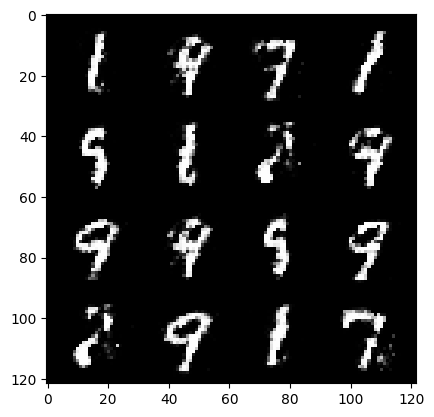

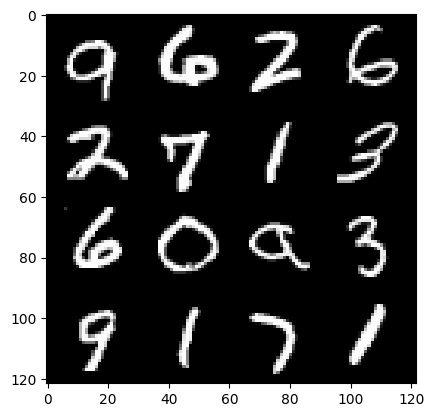

 39%|███████████████████▍                              | 182/469 [00:03<00:08, 35.58it/s]

125: step 58800 / gen loss: 2.660559149583181 / disc_loss 0.20355982902149378


  1%|▌                                                   | 5/469 [00:00<00:09, 49.80it/s]

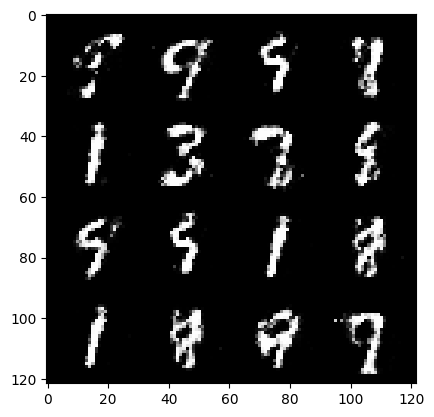

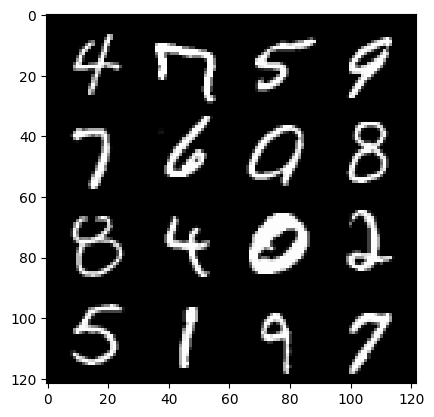

  3%|█▋                                                 | 15/469 [00:00<00:14, 30.64it/s]

126: step 59100 / gen loss: 2.8539211742083217 / disc_loss 0.19029244557023062


 64%|████████████████████████████████                  | 301/469 [00:06<00:03, 49.61it/s]

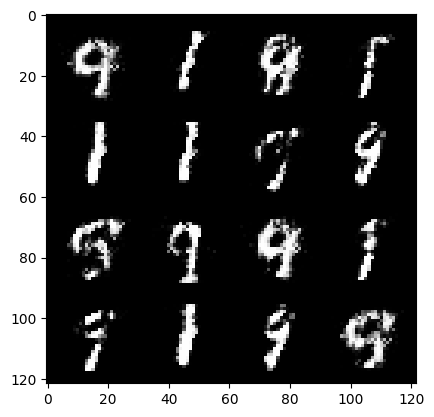

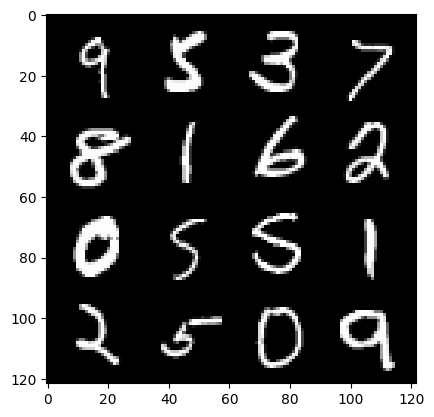

 67%|█████████████████████████████████▎                | 313/469 [00:06<00:04, 38.27it/s]

126: step 59400 / gen loss: 2.848244628111521 / disc_loss 0.1925613205383222


 29%|██████████████▍                                   | 136/469 [00:02<00:06, 49.43it/s]

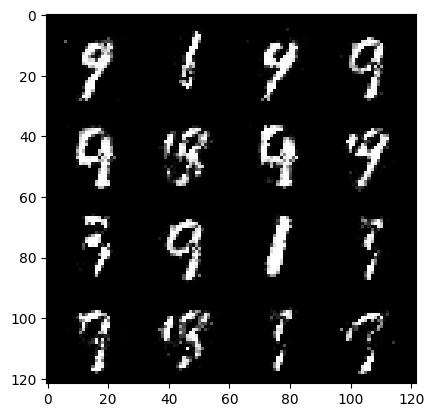

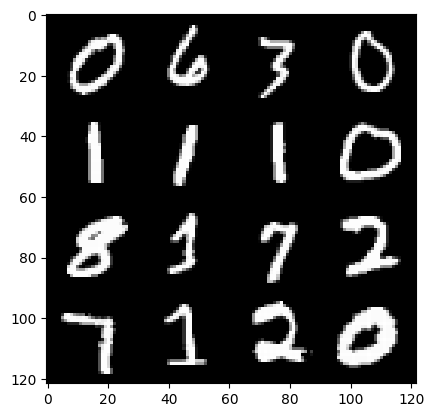

 30%|███████████████                                   | 141/469 [00:03<00:10, 32.46it/s]

127: step 59700 / gen loss: 2.8754258489608757 / disc_loss 0.19495759541789687


 92%|██████████████████████████████████████████████    | 432/469 [00:08<00:00, 50.40it/s]

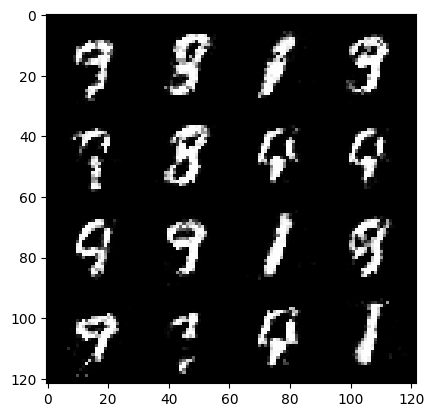

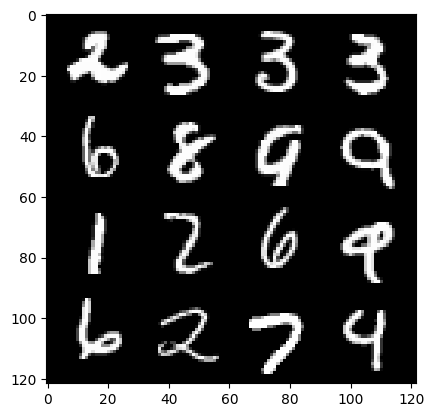

 94%|███████████████████████████████████████████████▏  | 443/469 [00:09<00:00, 36.35it/s]

127: step 60000 / gen loss: 2.8117947618166594 / disc_loss 0.17557260200381275


 57%|████████████████████████████▎                     | 265/469 [00:05<00:04, 43.71it/s]

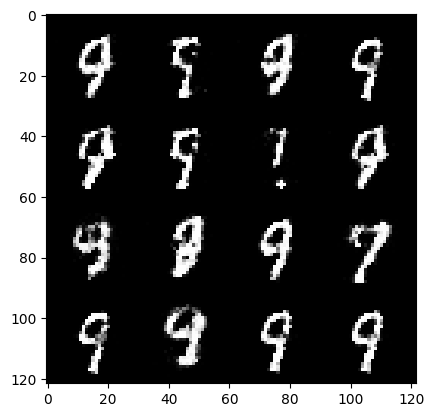

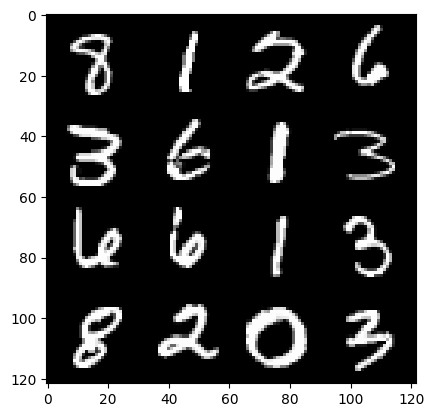

 59%|█████████████████████████████▎                    | 275/469 [00:06<00:06, 32.04it/s]

128: step 60300 / gen loss: 2.8357659173011753 / disc_loss 0.1740658728530008


 21%|██████████▌                                        | 97/469 [00:01<00:07, 48.38it/s]

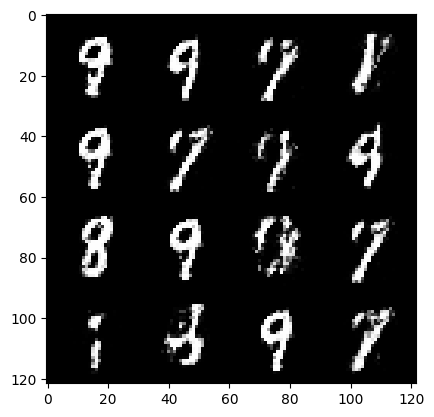

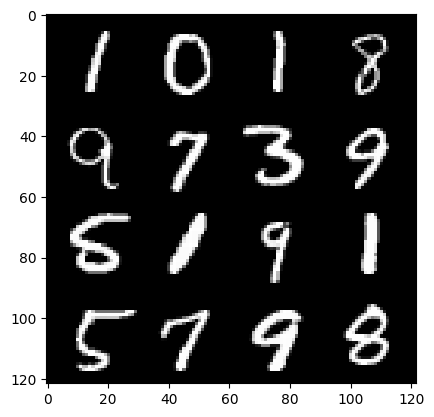

 23%|███████████▌                                      | 108/469 [00:02<00:09, 36.17it/s]

129: step 60600 / gen loss: 2.8077185543378196 / disc_loss 0.17954553857445738


 85%|██████████████████████████████████████████▌       | 399/469 [00:08<00:01, 51.09it/s]

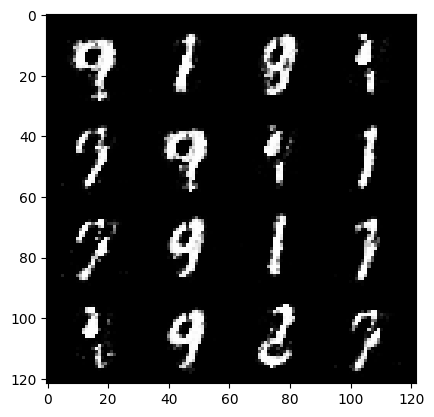

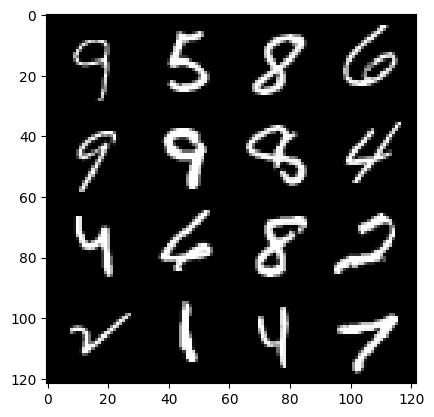

 86%|███████████████████████████████████████████▏      | 405/469 [00:08<00:01, 33.92it/s]

129: step 60900 / gen loss: 2.9422425103187564 / disc_loss 0.15961469200750195


 48%|████████████████████████                          | 226/469 [00:04<00:05, 47.04it/s]

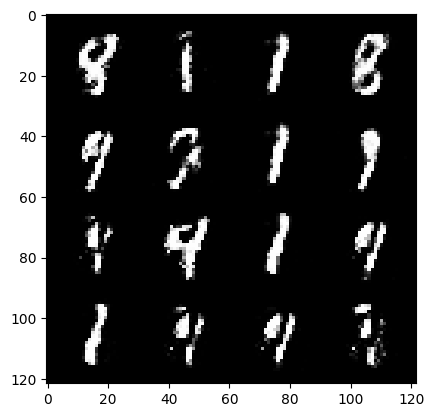

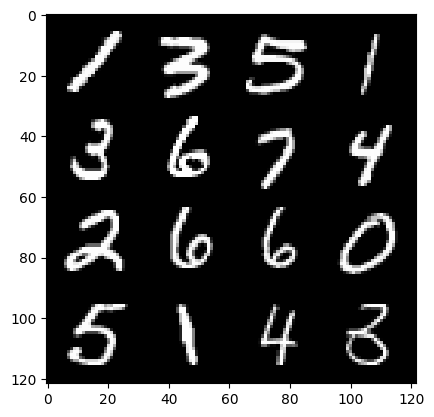

 50%|█████████████████████████▏                        | 236/469 [00:05<00:06, 34.76it/s]

130: step 61200 / gen loss: 2.930742566585539 / disc_loss 0.17697205449144038


 13%|██████▌                                            | 60/469 [00:01<00:08, 49.01it/s]

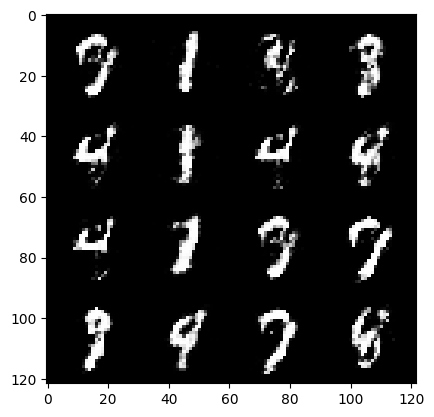

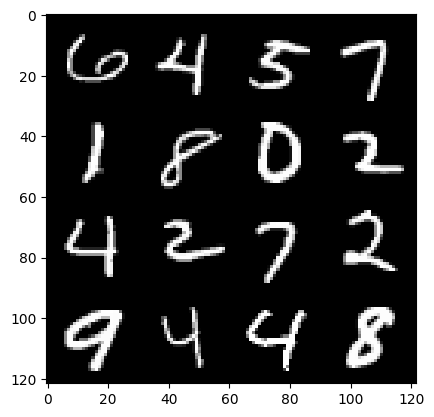

 15%|███████▌                                           | 70/469 [00:01<00:11, 35.47it/s]

131: step 61500 / gen loss: 2.8030114293098447 / disc_loss 0.17961531470219302


 76%|██████████████████████████████████████            | 357/469 [00:07<00:02, 45.56it/s]

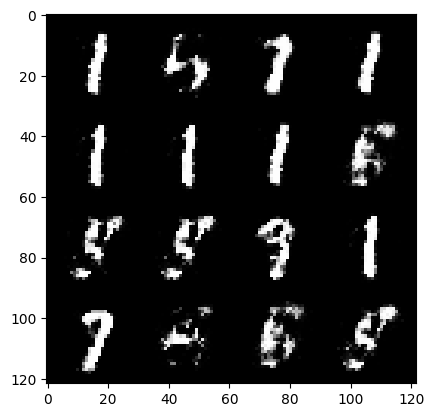

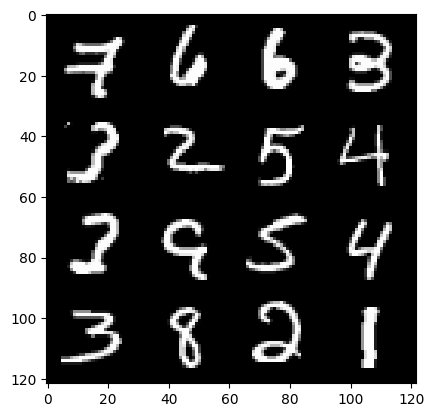

 78%|███████████████████████████████████████▏          | 367/469 [00:08<00:03, 27.57it/s]

131: step 61800 / gen loss: 2.776319420337678 / disc_loss 0.2217721951007844


 40%|████████████████████                              | 188/469 [00:03<00:05, 47.51it/s]

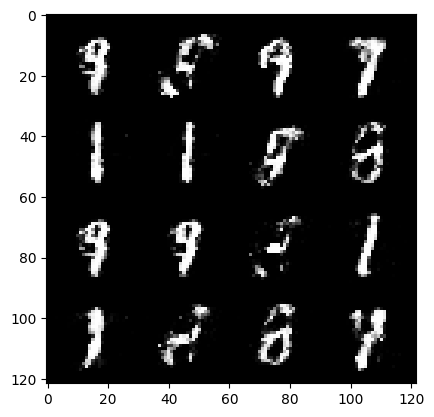

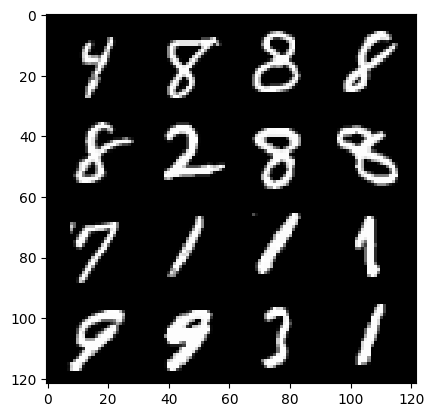

 42%|█████████████████████                             | 198/469 [00:04<00:07, 34.20it/s]

132: step 62100 / gen loss: 2.885839949448905 / disc_loss 0.18913181605438392


  4%|██▏                                                | 20/469 [00:00<00:09, 46.35it/s]

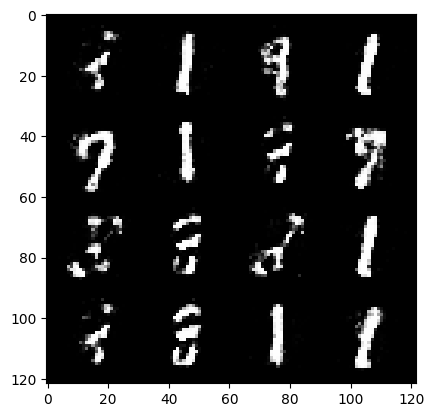

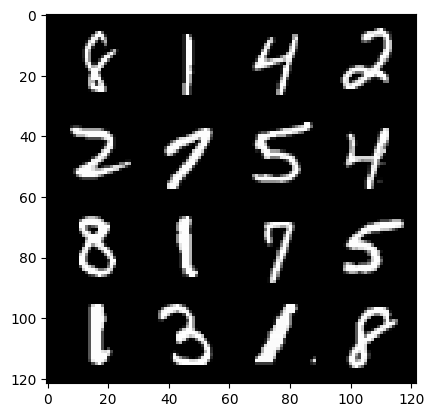

  6%|███▎                                               | 30/469 [00:00<00:14, 31.35it/s]

133: step 62400 / gen loss: 2.648478957811992 / disc_loss 0.19610097338755936


 51%|█████████████████████████▎                        | 238/469 [00:05<00:04, 46.63it/s]


KeyboardInterrupt: 

In [10]:
# train
for epoch in range(epochs):
   for real, _ in tqdm(dataloader):
       ## disc
       disc_optimizer.zero_grad(set_to_none=True)
       
       cur_bs = len(real) # 128 x 1 x 28 x 28
       real = real.view(cur_bs, -1) # 128 x 784
       real = real.to(device)

       disc_loss = calculate_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)
       disc_loss.backward(retain_graph=True)
       disc_optimizer.step()

       # Generator
       gen_optimizer.zero_grad(set_to_none=True)
       gen_loss = calculate_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
       gen_loss.backward(retain_graph=True)
       gen_optimizer.step()

       #vizz training loop
       mean_discriminator_loss += disc_loss.item() / info_step
       mean_generator_loss += gen_loss.item() / info_step

       if current_step % info_step == 0 and current_step >0:
           fake_noise = gen_noise(cur_bs, z_dim)
           fake = gen(fake_noise)
           show(fake)
           show(real)
           print(f"{epoch}: step {current_step} / gen loss: {mean_generator_loss} / disc_loss {mean_discriminator_loss}")
           mean_discriminator_loss = 0
           mean_generator_loss = 0
       current_step += 1

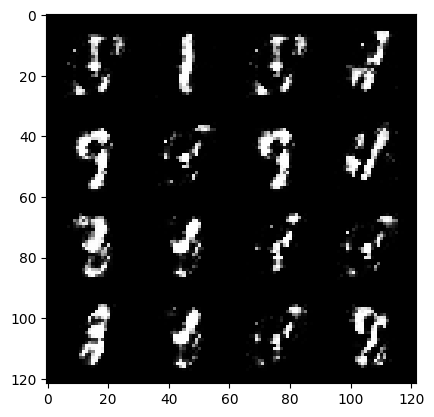

In [16]:
noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)